<a href="https://colab.research.google.com/github/ThamirisNeves/xAI-Projeto/blob/main/Projeto_Final_xAI_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Braindecode 

Para utilizar o Braindecode é necessário instalar o PyTorch, depois instalamos o Moabb (Mother of all BCI Benchmarks), cuja ideia é disponibilizar um benchmark compreensível de algoritmos de BCI populares aplicados em um lista extensa de datasets disponíveis de grátis. E finalmente, instalamos o Braindecode, uma ferramenta para trabalhar com sistemas BCI.


In [ ]:
!pip3 install torch==1.2.0+cu92 torchvision==0.4.0+cu92 -f https://download.pytorch.org/whl/torch_stable.html
!pip install moabb braindecode

Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [ ]:
import numpy as np

##Importando dataset 
Importamos o dataset do Moabb, identificando qual sujeito gostaríamos de analisar.

Aqui, podemos verificar que foram encontrados 48 eventos: Para cada imaginação de movimento, 'feet', 'left_hand', 'right_hand', 'tongue', tivemos 12 rodadas de leitura de sinal, sendo 6 delas de treino, e as outras 6, de teste.

In [ ]:
from braindecode import datasets
from braindecode.datasets import MOABBDataset

subject_id = [3]
dataset = MOABBDataset(dataset_name="BNCI2014001", subject_ids=subject_id)

print(dataset.description)

48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
    subject    session    run
0         3  session_T  run_0
1         3  session_T  run_1
2         3  session_T  run_2
3         3  session_T  run_3
4         3  session_T  run_4
5         3  session_T  run_5
6         3  session_E  run_0
7         3  session_E  run_1
8         3  session_E  run_2
9         3  session_E  run_3
10        3  session_E  run_4
11        3  session_E  run_5
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Event IDs: [1 2 3 4]
48 events found
Ev

Podemos observar que o dataset é composto por sinais de EEG, EOG, e estímulo, totalizando 26 colunas de sinais, e 1 coluna composta pelo tempo que durou o movimento. O sinais tem duração de 4 segundos. 

Cada sessão para cada usuário tem base de tamanho aproximado 19.2 MB, e existem 9 usuários com 12 sessões (6 treino + 6 teste). No total, a base interira tem aproximadamente 2GB.

In [ ]:
dataset.datasets[0].raw.describe()

<RawArray | 26 x 96735 (386.9 s), ~19.2 MB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  Fz    EEG   µV      -100.00      -7.42       0.15       7.76      93.90
 1  FC3   EEG   µV       -81.25      -7.08       0.10       7.42      73.78
 2  FC1   EEG   µV       -81.25      -7.32       0.15       7.71      68.55
 3  FCz   EEG   µV       -84.08      -7.52       0.15       8.01      71.78
 4  FC2   EEG   µV       -79.00      -7.37       0.15       7.81      68.80
 5  FC4   EEG   µV       -80.96      -7.18       0.15       7.57      73.88
 6  C5    EEG   µV       -68.65      -6.01       0.10       6.40      67.48
 7  C3    EEG   µV       -75.34      -7.03       0.20       7.52      69.58
 8  C1    EEG   µV       -75.98      -7.37       0.15       7.71      71.09
 9  Cz    EEG   µV       -83.98      -7.57       0.15       7.91      76.17
10  C2    EEG   µV       -78.66      -7.37       0.10       7.71      71.29
11  C4    EEG   µV       -79.88

In [ ]:
dataset.datasets[0].raw.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fz, FC3, FC1, FCz, FC2, FC4, C5, C3, C1, Cz, C2, C4, C6, CP3, ...
 chs: 22 EEG, 3 EOG, 1 Stimulus
 custom_ref_applied: False
 dig: 25 items (3 Cardinal, 22 EEG)
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: unspecified
 nchan: 26
 projs: []
 sfreq: 250.0 Hz
>

<Info | 8 non-empty values
 bads: []
 ch_names: Fz, FC3, FC1, FCz, FC2, FC4, C5, C3, C1, Cz, C2, C4, C6, CP3, ...
 chs: 22 EEG, 3 EOG, 1 Stimulus
 custom_ref_applied: False
 dig: 25 items (3 Cardinal, 22 EEG)
 highpass: 0.0 Hz
 lowpass: 125.0 Hz
 meas_date: unspecified
 nchan: 26
 projs: []
 sfreq: 250.0 Hz
>

In [ ]:
#indice [0] corresponde a primeira rodada do primeiro sujeito 
dataset.datasets[0].raw.to_data_frame()

,time,Fz,FC3,FC1,FCz,FC2,FC4,C5,C3,C1,...,CP2,CP4,P1,Pz,P2,POz,EOG1,EOG2,EOG3,stim
0,0,6.494141,-0.146484,4.736328,3.857422,2.148437,-2.587891,-1.660156,-1.464844,0.488281,...,-6.884766,-7.910156,-14.062500,-9.423828,-13.525391,-18.066406,-3.417969,8.300781,5.859375,0.0
1,4,3.906250,-2.832031,1.269531,0.341797,-1.855469,-6.396484,-5.810547,-5.419922,-1.171875,...,-11.718750,-13.378906,-16.699219,-13.281250,-19.335937,-23.095703,2.441406,10.253906,0.976562,0.0
2,8,9.912109,6.738281,7.226562,7.666016,3.955078,2.490234,0.976562,3.515625,5.371094,...,-4.003906,-4.394531,-8.837891,-4.980469,-10.742188,-13.867187,9.277344,13.671875,6.347656,0.0
3,12,7.421875,4.003906,4.638672,6.591797,1.025391,3.564453,2.685547,6.005859,4.541016,...,-4.931641,-6.152344,-8.251953,-7.226562,-13.623047,-17.675781,10.742188,13.183594,5.859375,0.0
4,16,-5.712891,-4.687500,-5.566406,-4.638672,-9.472656,-8.105469,-5.810547,-2.343750,-3.369141,...,-13.525391,-15.380859,-14.013672,-14.013672,-21.191406,-23.339844,-5.371094,0.000000,-6.347656,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96730,386920,-18.261719,-8.789062,-11.669922,-13.525391,-17.480469,-20.947266,-7.177734,-6.933594,-9.375000,...,-23.876953,-28.955078,-11.425781,-18.798828,-20.068359,-14.160156,-1.953125,-46.386719,-12.207031,0.0
96731,386924,-8.056641,4.589844,1.562500,-3.759766,-5.419922,-10.986328,5.126953,4.003906,2.099609,...,-14.501953,-19.970703,-2.880859,-10.009766,-11.083984,-4.882812,0.976562,-45.898438,-12.207031,0.0
96732,386928,-14.160156,5.419922,-3.173828,-4.394531,-10.156250,-12.353516,-0.292969,3.271484,-3.417969,...,-16.748047,-22.851562,-5.957031,-12.207031,-13.232422,-7.373047,-1.464844,-50.781250,-10.742188,0.0
96733,386932,-24.707031,-12.402344,-15.869141,-19.970703,-22.265625,-30.810547,-13.037109,-14.355469,-15.673828,...,-27.832031,-33.056641,-16.503906,-23.193359,-23.095703,-15.771484,-10.253906,-56.152344,-20.507812,0.0


,time,Fz,FC3,FC1,FCz,FC2,FC4,C5,C3,C1,...,CP2,CP4,P1,Pz,P2,POz,EOG1,EOG2,EOG3,stim
0,0,6.494141,-0.146484,4.736328,3.857422,2.148437,-2.587891,-1.660156,-1.464844,0.488281,...,-6.884766,-7.910156,-14.062500,-9.423828,-13.525391,-18.066406,-3.417969,8.300781,5.859375,0.0
1,4,3.906250,-2.832031,1.269531,0.341797,-1.855469,-6.396484,-5.810547,-5.419922,-1.171875,...,-11.718750,-13.378906,-16.699219,-13.281250,-19.335937,-23.095703,2.441406,10.253906,0.976562,0.0
2,8,9.912109,6.738281,7.226562,7.666016,3.955078,2.490234,0.976562,3.515625,5.371094,...,-4.003906,-4.394531,-8.837891,-4.980469,-10.742188,-13.867187,9.277344,13.671875,6.347656,0.0
3,12,7.421875,4.003906,4.638672,6.591797,1.025391,3.564453,2.685547,6.005859,4.541016,...,-4.931641,-6.152344,-8.251953,-7.226562,-13.623047,-17.675781,10.742188,13.183594,5.859375,0.0
4,16,-5.712891,-4.687500,-5.566406,-4.638672,-9.472656,-8.105469,-5.810547,-2.343750,-3.369141,...,-13.525391,-15.380859,-14.013672,-14.013672,-21.191406,-23.339844,-5.371094,0.000000,-6.347656,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96730,386920,-18.261719,-8.789062,-11.669922,-13.525391,-17.480469,-20.947266,-7.177734,-6.933594,-9.375000,...,-23.876953,-28.955078,-11.425781,-18.798828,-20.068359,-14.160156,-1.953125,-46.386719,-12.207031,0.0
96731,386924,-8.056641,4.589844,1.562500,-3.759766,-5.419922,-10.986328,5.126953,4.003906,2.099609,...,-14.501953,-19.970703,-2.880859,-10.009766,-11.083984,-4.882812,0.976562,-45.898438,-12.207031,0.0
96732,386928,-14.160156,5.419922,-3.173828,-4.394531,-10.156250,-12.353516,-0.292969,3.271484,-3.417969,...,-16.748047,-22.851562,-5.957031,-12.207031,-13.232422,-7.373047,-1.464844,-50.781250,-10.742188,0.0
96733,386932,-24.707031,-12.402344,-15.869141,-19.970703,-22.265625,-30.810547,-13.037109,-14.355469,-15.673828,...,-27.832031,-33.056641,-16.503906,-23.193359,-23.095703,-15.771484,-10.253906,-56.152344,-20.507812,0.0


In [ ]:
type(dataset.datasets[0].raw.to_data_frame())

pandas.core.frame.DataFrame

pandas.core.frame.DataFrame

##Pré-processamento selecionando valores

Na fase de pré-processamento são selecionados apenas os sinais de EEG, os sinais são convertido de $\mu$V para V, são filtrados em uma certa frequência, e é aplicada uma média móvel nos blocos de 1000 em 1000.
Como são selecionados apenas os sinais de EEG, agora temos 22 colunas de sinais, e 1 com o tempo. 

In [ ]:
from numpy import multiply
from braindecode.preprocessing import (
    exponential_moving_standardize, preprocess, Preprocessor, scale)

low_cut_hz = 4.  # low cut frequency for filtering
high_cut_hz = 38.  # high cut frequency for filtering
# Parameters for exponential moving standardization
factor_new = 1e-3
init_block_size = 1000

preprocessors = [
    Preprocessor('pick_types', eeg=True, meg=False, stim=False),  # Mantendo apenas os sinais de EEG
    Preprocessor(scale, factor=1e6, apply_on_array=True),  # Convertendo V para uV
    Preprocessor('filter', l_freq=low_cut_hz, h_freq=high_cut_hz),  # Bandpass filter
    Preprocessor(exponential_moving_standardize,  # Exponential moving standardization
                 factor_new=factor_new, init_block_size=init_block_size)
]

# Transform the data
preprocess(dataset, preprocessors)

for x, y in dataset:
    print(x.shape, y)
    break
    

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 38 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 38.00 Hz
- Upper transition bandwidth: 9.50 Hz (-6 dB cutoff frequency: 42.75 Hz)
- Filter length: 413 samples (1.652 sec)



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function scale is deprecated; will be removed in 0.7.0. Use numpy.multiply instead.
  warnings.warn(msg, category=FutureWarning)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 38 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 38.00 Hz
- Upper transition bandwidth: 9.50 Hz (-6 dB cutoff frequency: 42.75 Hz)
- Filter length: 413 samples (1.652 sec)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 38 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function scale is deprecated; will be removed in 0.7.0. Use numpy.multiply instead.
  warnings.warn(msg, category=FutureWarning)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 38 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 38.00 Hz
- Upper transition bandwidth: 9.50 Hz (-6 dB cutoff frequency: 42.75 Hz)
- Filter length: 413 samples (1.652 sec)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 38 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 

In [ ]:
dataset.datasets[0].raw.to_data_frame()

,time,Fz,FC3,FC1,FCz,FC2,FC4,C5,C3,C1,...,C6,CP3,CP1,CPz,CP2,CP4,P1,Pz,P2,POz
0,0,10185.718291,8804.480905,11289.698435,7365.665970,5784.257800,-1322.385845,5548.694851,2579.986379,3137.936398,...,-3.174004e+03,-5112.659914,-1675.115533,-181.514122,-3978.219110,-5754.825462,-7111.770044,-4302.001004,-4713.337882,-6881.866519
1,4,181016.671046,382136.320579,90221.247157,182040.936832,-26553.834460,276748.597919,89173.821177,264816.459883,277942.674012,...,-5.854256e+05,214832.612897,111683.574487,36402.087966,-24257.758175,-5808.766270,122106.357270,39748.631497,-125558.217806,-49024.735511
2,8,94485.085452,497780.346622,-17123.160843,158717.551384,-202323.302677,342828.619678,115647.023298,437485.046591,377363.115478,...,-9.948489e+05,488419.883203,202991.135584,33430.139512,-136149.531992,-141624.793851,198957.558532,-7456.931703,-319598.280243,-184709.069751
3,12,-319833.384838,260678.156474,-356144.694088,-131588.614197,-558208.160536,114900.909382,58380.934886,460892.776091,234151.213762,...,-1.161487e+06,772527.860118,235027.044993,-55059.854252,-376935.112541,-453952.833825,182198.770170,-188548.017688,-609278.339174,-452754.093329
4,16,-898864.069062,-201336.542742,-793680.822838,-583922.429389,-994179.938354,-313943.162780,-57538.200540,341014.300580,-67506.855746,...,-1.144377e+06,948498.952397,180177.978071,-247055.595523,-694632.980455,-849732.796737,74424.952779,-459696.475084,-932894.817020,-795096.193529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96730,386920,288291.136980,-395886.062619,62536.064595,62650.505184,131913.932284,47040.417875,22210.084646,-48.452179,115682.376186,...,-2.719055e+05,65881.015559,-124754.186865,-440318.364825,-642200.768133,-711583.037568,-540598.499818,-711431.800257,-772755.825308,-846978.381129
96731,386924,100141.530966,-467081.289512,-37257.197472,-84404.476210,40494.175537,-85209.276602,-169879.784152,-176558.726379,-71024.590553,...,-4.397901e+05,-201091.474203,-315588.763454,-607388.990159,-743695.019490,-799343.459071,-701903.296833,-869242.429050,-869833.167994,-916935.344284
96732,386928,82267.485713,-361836.233764,3769.459655,-77361.144444,82943.219605,-71350.148168,-177946.831850,-209968.445280,-91485.308756,...,-3.481025e+05,-285628.841911,-298096.191589,-538603.180817,-603942.998329,-637986.802009,-632250.643524,-763102.245755,-725769.019800,-764456.589377
96733,386932,67177.251087,-184235.528657,31391.985224,-32233.240908,81737.263517,-29136.317128,-99726.986771,-134703.783984,-49919.363662,...,-1.760558e+05,-197444.034561,-170411.974733,-310636.895461,-330532.891665,-345750.085546,-371627.314633,-443374.266784,-408874.335188,-432373.031534


,time,Fz,FC3,FC1,FCz,FC2,FC4,C5,C3,C1,...,C6,CP3,CP1,CPz,CP2,CP4,P1,Pz,P2,POz
0,0,10185.718291,8804.480905,11289.698435,7365.665970,5784.257800,-1322.385845,5548.694851,2579.986379,3137.936398,...,-3.174004e+03,-5112.659914,-1675.115533,-181.514122,-3978.219110,-5754.825462,-7111.770044,-4302.001004,-4713.337882,-6881.866519
1,4,181016.671046,382136.320579,90221.247157,182040.936832,-26553.834460,276748.597919,89173.821177,264816.459883,277942.674012,...,-5.854256e+05,214832.612897,111683.574487,36402.087966,-24257.758175,-5808.766270,122106.357270,39748.631497,-125558.217806,-49024.735511
2,8,94485.085452,497780.346622,-17123.160843,158717.551384,-202323.302677,342828.619678,115647.023298,437485.046591,377363.115478,...,-9.948489e+05,488419.883203,202991.135584,33430.139512,-136149.531992,-141624.793851,198957.558532,-7456.931703,-319598.280243,-184709.069751
3,12,-319833.384838,260678.156474,-356144.694088,-131588.614197,-558208.160536,114900.909382,58380.934886,460892.776091,234151.213762,...,-1.161487e+06,772527.860118,235027.044993,-55059.854252,-376935.112541,-453952.833825,182198.770170,-188548.017688,-609278.339174,-452754.093329
4,16,-898864.069062,-201336.542742,-793680.822838,-583922.429389,-994179.938354,-313943.162780,-57538.200540,341014.300580,-67506.855746,...,-1.144377e+06,948498.952397,180177.978071,-247055.595523,-694632.980455,-849732.796737,74424.952779,-459696.475084,-932894.817020,-795096.193529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96730,386920,288291.136980,-395886.062619,62536.064595,62650.505184,131913.932284,47040.417875,22210.084646,-48.452179,115682.376186,...,-2.719055e+05,65881.015559,-124754.186865,-440318.364825,-642200.768133,-711583.037568,-540598.499818,-711431.800257,-772755.825308,-846978.381129
96731,386924,100141.530966,-467081.289512,-37257.197472,-84404.476210,40494.175537,-85209.276602,-169879.784152,-176558.726379,-71024.590553,...,-4.397901e+05,-201091.474203,-315588.763454,-607388.990159,-743695.019490,-799343.459071,-701903.296833,-869242.429050,-869833.167994,-916935.344284
96732,386928,82267.485713,-361836.233764,3769.459655,-77361.144444,82943.219605,-71350.148168,-177946.831850,-209968.445280,-91485.308756,...,-3.481025e+05,-285628.841911,-298096.191589,-538603.180817,-603942.998329,-637986.802009,-632250.643524,-763102.245755,-725769.019800,-764456.589377
96733,386932,67177.251087,-184235.528657,31391.985224,-32233.240908,81737.263517,-29136.317128,-99726.986771,-134703.783984,-49919.363662,...,-1.760558e+05,-197444.034561,-170411.974733,-310636.895461,-330532.891665,-345750.085546,-371627.314633,-443374.266784,-408874.335188,-432373.031534


Quando tirados os valores de EOG e estímulo, o tamanho da base diminui para 16.3MB.


In [ ]:
dataset.datasets[0].raw.describe()

<RawArray | 22 x 96735 (386.9 s), ~16.3 MB, data loaded>
ch  name  type  unit        min         Q1     median         Q3        max
 0  Fz    EEG   µV    -6200360.55  -663423.98   -2108.11  663216.17  6400893.81
 1  FC3   EEG   µV    -6354972.97  -663631.49    8264.97  672216.32  6534284.16
 2  FC1   EEG   µV    -6333371.88  -663179.10    7741.07  672447.61  6334400.63
 3  FCz   EEG   µV    -6520958.60  -663677.65   -1162.59  670835.73  6240450.73
 4  FC2   EEG   µV    -6554315.59  -665107.42    1749.41  674358.12  6098722.27
 5  FC4   EEG   µV    -6706703.38  -667563.41    5669.48  667798.55  6214723.17
 6  C5    EEG   µV    -6588007.41  -661115.10   12069.19  674310.62  6467575.35
 7  C3    EEG   µV    -6193758.43  -648162.77   25830.69  677736.24  6069540.77
 8  C1    EEG   µV    -6375275.80  -657169.54   12590.37  677454.12  6153306.10
 9  Cz    EEG   µV    -6647764.94  -659230.09    4372.15  676012.55  6189146.24
10  C2    EEG   µV    -6556128.37  -659508.52    8030.63  676849.41

In [ ]:
dataset.datasets[0].raw.annotations.to_data_frame()

,onset,duration,description
0,1970-01-01 00:00:03.000,4.0,left_hand
1,1970-01-01 00:00:11.012,4.0,right_hand
2,1970-01-01 00:00:18.684,4.0,right_hand
3,1970-01-01 00:00:26.492,4.0,left_hand
4,1970-01-01 00:00:34.524,4.0,right_hand
5,1970-01-01 00:00:42.968,4.0,left_hand
6,1970-01-01 00:00:50.636,4.0,right_hand
7,1970-01-01 00:00:58.836,4.0,feet
8,1970-01-01 00:01:06.560,4.0,right_hand
9,1970-01-01 00:01:14.552,4.0,tongue


,onset,duration,description
0,1970-01-01 00:00:03.000,4.0,left_hand
1,1970-01-01 00:00:11.012,4.0,right_hand
2,1970-01-01 00:00:18.684,4.0,right_hand
3,1970-01-01 00:00:26.492,4.0,left_hand
4,1970-01-01 00:00:34.524,4.0,right_hand
5,1970-01-01 00:00:42.968,4.0,left_hand
6,1970-01-01 00:00:50.636,4.0,right_hand
7,1970-01-01 00:00:58.836,4.0,feet
8,1970-01-01 00:01:06.560,4.0,right_hand
9,1970-01-01 00:01:14.552,4.0,tongue


##Criando janela de eventos

A janela de eventos tem como objetivo dividir uma certa quantidade de sinais que corresponde a um movimento específico. 


In [ ]:
#import numpy as np
from braindecode.preprocessing import \
    create_windows_from_events, create_fixed_length_windows

trial_start_offset_seconds = -0.5
# Extract sampling frequency, check that they are same in all datasets
sfreq = dataset.datasets[0].raw.info['sfreq']
assert all([ds.raw.info['sfreq'] == sfreq for ds in dataset.datasets])
# Calculate the trial start offset in samples.
trial_start_offset_samples = int(trial_start_offset_seconds * sfreq)

windows_dataset = create_windows_from_events(
    dataset,
    trial_start_offset_samples=trial_start_offset_samples,
    trial_stop_offset_samples=0,
    preload=True,
)

Used Annotations descriptions: ['feet', 'left_hand', 'right_hand', 'tongue']
Adding metadata with 4 columns
48 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 48 events and 1125 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['feet', 'left_hand', 'right_hand', 'tongue']
Adding metadata with 4 columns
48 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 48 events and 1125 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['feet', 'left_hand', 'right_hand', 'tongue']
Adding metadata with 4 columns
48 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 48 events and 1125 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['feet', 'left_hand', 'right_hand', 'tongue']
Adding metadata with 4 columns
48 matching even

In [ ]:
windows_dataset.datasets[0].windows.to_data_frame()

,time,condition,epoch,Fz,FC3,FC1,FCz,FC2,FC4,C5,...,C6,CP3,CP1,CPz,CP2,CP4,P1,Pz,P2,POz
0,0,left_hand,0,-2.172395e+05,-3.356897e+05,-1.547392e+05,-3.112529e+05,-3.869214e+05,-5.252199e+05,1.608167e+05,...,-967733.160677,5.587671e+04,1.446084e+05,9.964704e+03,-3.436497e+04,-2.761891e+05,-7.395379e+04,1.600318e+05,4.352465e+04,1.251943e+05
1,4,left_hand,0,-1.529343e+05,-6.590405e+05,-3.300484e+05,-3.148636e+05,-2.367157e+05,-4.124697e+05,-4.897971e+05,...,-698397.082870,-3.438858e+05,-5.726611e+04,8.011425e+03,1.317336e+04,-2.713270e+05,-1.314617e+05,1.612326e+05,5.706226e+04,1.600256e+05
2,8,left_hand,0,2.026980e+05,-5.462836e+05,-1.454605e+05,1.922104e+04,2.609232e+05,7.129143e+04,-6.622778e+05,...,-250207.622783,-2.414329e+05,1.749898e+05,3.633730e+05,3.575497e+05,3.304852e+03,2.613704e+05,4.920847e+05,3.557394e+05,5.113740e+05
3,12,left_hand,0,6.921749e+05,-1.040104e+05,2.780394e+05,5.349607e+05,8.742239e+05,7.048575e+05,-4.638181e+05,...,171284.379850,1.666211e+05,6.070518e+05,8.411805e+05,7.857446e+05,3.487864e+05,8.148939e+05,9.214595e+05,7.259793e+05,9.566913e+05
4,16,left_hand,0,1.100599e+06,3.882684e+05,6.894982e+05,9.921974e+05,1.321112e+06,1.227607e+06,-2.271576e+05,...,469153.821134,5.102128e+05,8.977367e+05,1.157342e+06,1.060378e+06,5.772407e+05,1.162385e+06,1.183110e+06,9.434586e+05,1.221209e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53995,4480,tongue,47,9.079834e+05,1.338487e+05,1.011638e+04,4.074944e+05,3.961406e+05,5.693596e+05,-1.922234e+06,...,307293.890269,-1.928237e+06,-1.377320e+06,-7.454512e+05,-6.672987e+05,-4.691225e+05,-1.202646e+06,-1.028297e+06,-7.497613e+05,-8.340843e+05
53996,4484,tongue,47,-9.776642e+04,-1.105714e+06,-1.210768e+06,-7.690979e+05,-7.403438e+05,-4.450069e+05,-2.957881e+06,...,-366937.347695,-3.037941e+06,-2.540576e+06,-1.934270e+06,-1.756737e+06,-1.408837e+06,-2.167347e+06,-2.007117e+06,-1.697638e+06,-1.670022e+06
53997,4488,tongue,47,-9.766005e+05,-2.316571e+06,-2.270032e+06,-1.826936e+06,-1.716285e+06,-1.362421e+06,-3.356828e+06,...,-894082.515216,-3.688483e+06,-3.292166e+06,-2.869893e+06,-2.577402e+06,-2.130859e+06,-2.785642e+06,-2.675230e+06,-2.364158e+06,-2.214121e+06
53998,4492,tongue,47,-1.305530e+06,-2.833930e+06,-2.634024e+06,-2.249514e+06,-2.064967e+06,-1.722048e+06,-2.866041e+06,...,-946064.642668,-3.445843e+06,-3.202660e+06,-3.043897e+06,-2.672159e+06,-2.210349e+06,-2.625823e+06,-2.616217e+06,-2.348009e+06,-2.076728e+06


In [ ]:
type(windows_dataset.description)

pandas.core.frame.DataFrame

In [ ]:
windows_dataset.get_metadata()

,i_window_in_trial,i_start_in_trial,i_stop_in_trial,target,subject,session,run
0,0,625,1750,1,3,session_T,run_0
1,0,2628,3753,2,3,session_T,run_0
2,0,4546,5671,2,3,session_T,run_0
3,0,6498,7623,1,3,session_T,run_0
4,0,8506,9631,2,3,session_T,run_0
...,...,...,...,...,...,...,...
43,0,87125,88250,0,3,session_E,run_5
44,0,89031,90156,3,3,session_E,run_5
45,0,90959,92084,0,3,session_E,run_5
46,0,93073,94198,1,3,session_E,run_5


##Plotando sinais de EEG

In [ ]:
windows_dataset.datasets[0].windows.event_id #valores que correspondem a cada movimento

{'feet': 0, 'left_hand': 1, 'right_hand': 2, 'tongue': 3}

1
[0, 625, 1750]


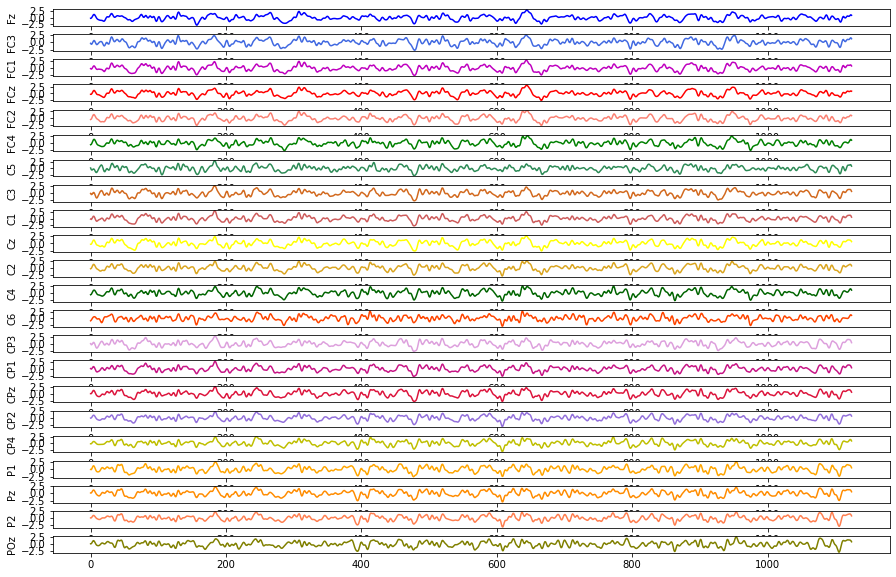

In [ ]:
import matplotlib.pyplot as plt
max_i = 0

sensores = ['Fz', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'C5', 'C3', 'C1', 'Cz',
       'C2', 'C4', 'C6', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'P1', 'Pz', 'P2',
       'POz']
mov = ['feet', 'left_hand', 'right_hand', 'tongue']
color=['blue', 'royalblue','m','r','salmon','g','seagreen','chocolate',
       'indianred','yellow','goldenrod','darkgreen','orangered','plum',
       'mediumvioletred','crimson','mediumpurple','y','orange','darkorange',
       'coral','olive']

for i, (x, y, window_ind) in enumerate(windows_dataset):
  #print(len(x))
  print(y)
  print(window_ind)
  fig, axs = plt.subplots(len(x),1, figsize=(15, 10), facecolor='w', edgecolor='k')
  fig.subplots_adjust(hspace = .5, wspace=.001)
  axs = axs.ravel()
  for k in range(len(x)):
    axs[k].plot(x[k], color[k],label=mov[y])
    axs[k].set_ylabel(sensores[k])
  if i == max_i:
    break




# fig.tight_layout()

## Dividindo as sessões
Podemos dividir as sessões entre treino e teste.


In [ ]:
splitted = windows_dataset.split('session') #dividindo as sessões entre treino e teste 
train_set = splitted['session_T'] #base de treino (6 sessões de cada usuário)
valid_set = splitted['session_E'] #base de teste (6 sessões de cada usuário)
#type(train_set)

In [ ]:
#valid_set.description

In [ ]:
dataset_list_train = []

for data in train_set.datasets: 
  df_dataset = data.windows.to_data_frame().reset_index() #copiando cada dataset (dos 30) no formato dataframe para uma variável 
  #df_dataset = df_dataset.join(data.description)
  dataset_list_train.append(df_dataset.copy())
#dataset_list_train[1]


In [ ]:
dataset_list_train[0]

,index,time,condition,epoch,Fz,FC3,FC1,FCz,FC2,FC4,...,C6,CP3,CP1,CPz,CP2,CP4,P1,Pz,P2,POz
0,0,0,left_hand,0,-2.172395e+05,-3.356897e+05,-1.547392e+05,-3.112529e+05,-3.869214e+05,-5.252199e+05,...,-967733.160677,5.587671e+04,1.446084e+05,9.964704e+03,-3.436497e+04,-2.761891e+05,-7.395379e+04,1.600318e+05,4.352465e+04,1.251943e+05
1,1,4,left_hand,0,-1.529343e+05,-6.590405e+05,-3.300484e+05,-3.148636e+05,-2.367157e+05,-4.124697e+05,...,-698397.082870,-3.438858e+05,-5.726611e+04,8.011425e+03,1.317336e+04,-2.713270e+05,-1.314617e+05,1.612326e+05,5.706226e+04,1.600256e+05
2,2,8,left_hand,0,2.026980e+05,-5.462836e+05,-1.454605e+05,1.922104e+04,2.609232e+05,7.129143e+04,...,-250207.622783,-2.414329e+05,1.749898e+05,3.633730e+05,3.575497e+05,3.304852e+03,2.613704e+05,4.920847e+05,3.557394e+05,5.113740e+05
3,3,12,left_hand,0,6.921749e+05,-1.040104e+05,2.780394e+05,5.349607e+05,8.742239e+05,7.048575e+05,...,171284.379850,1.666211e+05,6.070518e+05,8.411805e+05,7.857446e+05,3.487864e+05,8.148939e+05,9.214595e+05,7.259793e+05,9.566913e+05
4,4,16,left_hand,0,1.100599e+06,3.882684e+05,6.894982e+05,9.921974e+05,1.321112e+06,1.227607e+06,...,469153.821134,5.102128e+05,8.977367e+05,1.157342e+06,1.060378e+06,5.772407e+05,1.162385e+06,1.183110e+06,9.434586e+05,1.221209e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53995,53995,4480,tongue,47,9.079834e+05,1.338487e+05,1.011638e+04,4.074944e+05,3.961406e+05,5.693596e+05,...,307293.890269,-1.928237e+06,-1.377320e+06,-7.454512e+05,-6.672987e+05,-4.691225e+05,-1.202646e+06,-1.028297e+06,-7.497613e+05,-8.340843e+05
53996,53996,4484,tongue,47,-9.776642e+04,-1.105714e+06,-1.210768e+06,-7.690979e+05,-7.403438e+05,-4.450069e+05,...,-366937.347695,-3.037941e+06,-2.540576e+06,-1.934270e+06,-1.756737e+06,-1.408837e+06,-2.167347e+06,-2.007117e+06,-1.697638e+06,-1.670022e+06
53997,53997,4488,tongue,47,-9.766005e+05,-2.316571e+06,-2.270032e+06,-1.826936e+06,-1.716285e+06,-1.362421e+06,...,-894082.515216,-3.688483e+06,-3.292166e+06,-2.869893e+06,-2.577402e+06,-2.130859e+06,-2.785642e+06,-2.675230e+06,-2.364158e+06,-2.214121e+06
53998,53998,4492,tongue,47,-1.305530e+06,-2.833930e+06,-2.634024e+06,-2.249514e+06,-2.064967e+06,-1.722048e+06,...,-946064.642668,-3.445843e+06,-3.202660e+06,-3.043897e+06,-2.672159e+06,-2.210349e+06,-2.625823e+06,-2.616217e+06,-2.348009e+06,-2.076728e+06


In [ ]:
np.shape(dataset_list_train)

(6, 54000, 26)

In [ ]:
dataset_list_valid=[]

for data in valid_set.datasets:
  df_dataset = data.windows.to_data_frame().reset_index()
  dataset_list_valid.append(df_dataset.copy())
#dataset_list_valid[1]



In [ ]:
np.shape(dataset_list_valid)

(6, 54000, 26)

In [ ]:
dataset_list_valid[1].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54000 entries, 0 to 53999
Data columns (total 26 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   index      54000 non-null  int64  
 1   time       54000 non-null  int64  
 2   condition  54000 non-null  object 
 3   epoch      54000 non-null  int64  
 4   Fz         54000 non-null  float64
 5   FC3        54000 non-null  float64
 6   FC1        54000 non-null  float64
 7   FCz        54000 non-null  float64
 8   FC2        54000 non-null  float64
 9   FC4        54000 non-null  float64
 10  C5         54000 non-null  float64
 11  C3         54000 non-null  float64
 12  C1         54000 non-null  float64
 13  Cz         54000 non-null  float64
 14  C2         54000 non-null  float64
 15  C4         54000 non-null  float64
 16  C6         54000 non-null  float64
 17  CP3        54000 non-null  float64
 18  CP1        54000 non-null  float64
 19  CPz        54000 non-null  float64
 20  CP2   

## Pré-processamento e extração de métricas para auxiliar na análise

Normalizando os dados, e passando a Transformada de Fourier nos valores das bases, além da retirada as seguintes métricas: quartil, mediana e variância.


In [ ]:
#Importando Bibliotecas a serem utilizadas no projeto
import pandas as pd

#Biblioteca para plotar dados(Mais bonito)
import seaborn as sns

#converter os campos de horas
from datetime import datetime
import math
import time
from datetime import datetime

#pacote estatístico retorna desvio padrão sem viés pra variância
import statistics as st

from scipy.fft import fft, fftfreq, fftshift

import sklearn.decomposition as skd
from sklearn.preprocessing import normalize

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report

from sklearn.neighbors import KNeighborsClassifier

# Normalizando os dados de treino e teste




In [ ]:
#sensores = ['Fz','FC3', 'FCz', 'FC2', 'FC4', 'C3', 'C1', 'Cz',
#       'C2','C4', 'CP1', 'CPz', 'CP2', 'CP4', 'P1', 'Pz', 'P2','POz']

sensores = ['C3', 'Cz','C4']
sensores_normalized = ['C3_norm', 'Cz_norm','C4_norm']
#sensores_normalized = ['Fz_norm', 'FC3_norm', 'FCz_norm', 'FC2_norm', 'FC4_norm', 'C3_norm', 'C1_norm', 'Cz_norm',
#       'C2_norm','C4_norm', 'CP1_norm', 'CPz_norm', 'CP2_norm', 'CP4_norm', 'P1_norm', 'Pz_norm', 'P2_norm', 'POz_norm']

In [ ]:
#dados de treino
train_list_normalized=[]

for database in dataset_list_train: 
  df_dataset = pd.DataFrame(normalize(database[sensores]),columns = sensores_normalized)
  train_list_normalized.append(df_dataset.copy())  # e colocando cada dataframe em uma posição da lista dataset_list_train
 
train_list_normalized[1]


,C3_norm,Cz_norm,C4_norm
0,0.310049,0.588941,0.746336
1,0.425914,0.581684,0.692994
2,0.517837,0.580325,0.628544
3,0.676083,0.553179,0.486728
4,0.944694,0.060199,-0.322380
...,...,...,...
53995,0.188418,0.696191,0.692688
53996,-0.696929,0.433975,0.570926
53997,-0.955103,-0.276423,-0.106621
53998,-0.928649,-0.357260,-0.099885


In [ ]:
#dados de teste
valid_list_normalized=[]

for database in dataset_list_valid: 
  df_dataset = pd.DataFrame(normalize(database[sensores]),columns = sensores_normalized)
  valid_list_normalized.append(df_dataset.copy())  # e colocando cada dataframe em uma posição da lista dataset_list_valid

# Juntando os valores normalizados e não normalizados


In [ ]:
dataset_list_train_norm = []
for database in dataset_list_train: #colocando os dados normalizados na base original 
  for database2 in train_list_normalized: 
    df_dataset = database.copy()
    df_dataset2 = database2.copy()
    df_dataset = df_dataset.join(df_dataset2)
  dataset_list_train_norm.append(df_dataset.copy())
dataset_list_train_norm[1]


,index,time,condition,epoch,Fz,FC3,FC1,FCz,FC2,FC4,...,CPz,CP2,CP4,P1,Pz,P2,POz,C3_norm,Cz_norm,C4_norm
0,0,0,tongue,0,2.473591e+06,2.029220e+06,2.080523e+06,2.323336e+06,2.121030e+06,2.254930e+06,...,1.135440e+06,1.536362e+06,1.700648e+06,8.457475e+05,1.039696e+06,1.184946e+06,9.611778e+05,-0.532147,-0.762926,-0.367102
1,1,4,tongue,0,2.231856e+06,2.263020e+06,2.123056e+06,2.221058e+06,1.853030e+06,2.073780e+06,...,1.695013e+06,1.997015e+06,2.189071e+06,1.427090e+06,1.620208e+06,1.757296e+06,1.607444e+06,0.640357,0.407392,0.651134
2,2,8,tongue,0,1.435044e+06,1.818531e+06,1.632745e+06,1.482396e+06,1.064113e+06,1.209561e+06,...,1.641389e+06,1.782886e+06,1.934994e+06,1.455007e+06,1.626463e+06,1.747035e+06,1.711652e+06,0.675532,0.504107,0.538082
3,3,12,tongue,0,4.917882e+05,9.598541e+05,8.857940e+05,4.838008e+05,1.599048e+05,1.351490e+05,...,1.023597e+06,1.036043e+06,1.154845e+06,9.663919e+05,1.109333e+06,1.219194e+06,1.277798e+06,0.769469,0.528410,0.358748
4,4,16,tongue,0,-1.415720e+05,1.737665e+05,2.799271e+05,-2.564906e+05,-4.032956e+05,-5.779500e+05,...,2.142688e+05,1.598021e+05,2.877371e+05,2.793292e+05,3.879172e+05,4.783643e+05,5.623118e+05,0.271822,-0.186982,-0.944008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53995,53995,4480,left_hand,47,5.975252e+05,5.840401e+05,6.802958e+05,7.717161e+05,7.749830e+05,9.250357e+05,...,8.463003e+05,7.435768e+05,8.556228e+05,3.531882e+05,4.823875e+05,3.820523e+05,5.169680e+04,-0.363225,-0.560793,-0.744029
53996,53996,4484,left_hand,47,6.340878e+04,-2.043062e+05,3.306646e+04,1.629918e+05,2.790628e+05,4.303155e+05,...,2.213332e+05,1.704234e+05,2.985465e+05,-3.157486e+05,-1.545219e+05,-1.951753e+05,-6.606282e+05,-0.449737,-0.558173,-0.697265
53997,53997,4488,left_hand,47,-4.623139e+05,-9.476062e+05,-5.964488e+05,-4.304016e+05,-2.129110e+05,-4.639948e+04,...,-3.172266e+05,-2.928644e+05,-1.838631e+05,-7.982505e+05,-6.067092e+05,-5.869585e+05,-1.091727e+06,-0.510092,-0.518286,-0.686429
53998,53998,4492,left_hand,47,-5.982325e+05,-1.149826e+06,-7.795039e+05,-6.101530e+05,-3.148733e+05,-1.002040e+05,...,-4.019060e+05,-2.648264e+05,-1.482109e+05,-7.809523e+05,-5.465616e+05,-4.397017e+05,-9.101807e+05,-0.727169,0.589876,-0.351101


In [ ]:
dataset_list_valid_norm = []
for database in dataset_list_valid: #colocando os dados normalizados na base original 
  for database2 in valid_list_normalized: 
    df_dataset = database.copy()
    df_dataset2 = database2.copy()
    df_dataset = df_dataset.join(df_dataset2)
  dataset_list_valid_norm.append(df_dataset.copy())

#Separando apenas os valores de 'mão direita' e 'pé'

Dados dos eletrodos + dados normalizados


In [ ]:
#treino
dataset_list_train_norm_sep = []
for data in dataset_list_train_norm: 
  df_dataset = data.copy()
  dataset_list_train_norm_sep.append(df_dataset
                                     [(df_dataset['condition'].isin(['right_hand','feet']))].copy())  # e colocando cada dataframe em uma posição da lista dataset_list_train

#dataset_list_train_norm_sep[0]

In [ ]:
dataset_list_train_norm_sep[0]
#pd.concat(dataset_list_train_norm_sep)[sensores_normalized]

,index,time,condition,epoch,Fz,FC3,FC1,FCz,FC2,FC4,...,CPz,CP2,CP4,P1,Pz,P2,POz,C3_norm,Cz_norm,C4_norm
1125,1125,0,right_hand,1,-7.397911e+05,-5.482642e+05,-7.598279e+05,-6.991614e+05,-8.391321e+05,-4.935778e+05,...,-2.288251e+05,-3.776376e+05,-1.197999e+05,-4.545710e+05,-4.565512e+05,-2.957363e+05,-7.256151e+05,0.972381,0.217082,-0.085739
1126,1126,4,right_hand,1,-9.375990e+05,-7.066274e+05,-1.082662e+06,-9.285904e+05,-1.198599e+06,-8.466976e+05,...,-4.941611e+05,-7.654426e+05,-6.648244e+05,-7.403353e+05,-7.372005e+05,-7.167892e+05,-9.395023e+05,0.991249,-0.032928,0.127833
1127,1127,8,right_hand,1,-9.269353e+05,-6.381122e+05,-1.087520e+06,-1.003107e+06,-1.323193e+06,-1.064030e+06,...,-6.604879e+05,-1.026944e+06,-1.092458e+06,-8.557369e+05,-8.750807e+05,-1.041284e+06,-1.020134e+06,0.736779,0.258824,0.624634
1128,1128,12,right_hand,1,-8.532599e+05,-5.582048e+05,-9.626868e+05,-1.050993e+06,-1.344537e+06,-1.255293e+06,...,-8.671277e+05,-1.300830e+06,-1.495095e+06,-9.642436e+05,-1.018846e+06,-1.364547e+06,-1.114369e+06,0.624861,0.428731,0.652486
1129,1129,16,right_hand,1,-8.224698e+05,-6.369867e+05,-9.125969e+05,-1.167948e+06,-1.388594e+06,-1.494744e+06,...,-1.209565e+06,-1.664142e+06,-1.919249e+06,-1.204251e+06,-1.268876e+06,-1.722923e+06,-1.313238e+06,0.610310,0.498331,0.615782
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49495,49495,4480,feet,43,-2.049331e+06,-2.148265e+06,-2.150566e+06,-1.983215e+06,-1.770119e+06,-1.755853e+06,...,-1.068914e+06,-8.255552e+05,-6.665992e+05,-1.086480e+06,-8.636150e+05,-6.768434e+05,-1.066854e+06,0.675044,0.557944,0.482714
49496,49496,4484,feet,43,-2.644920e+06,-2.406365e+06,-2.467864e+06,-2.421376e+06,-2.411166e+06,-2.445727e+06,...,-1.405717e+06,-1.326911e+06,-1.290735e+06,-1.357661e+06,-1.222580e+06,-1.174174e+06,-1.438403e+06,0.714569,0.565462,0.411879
49497,49497,4488,feet,43,-2.434753e+06,-1.951886e+06,-2.056498e+06,-2.080620e+06,-2.281829e+06,-2.284006e+06,...,-1.108455e+06,-1.221194e+06,-1.325152e+06,-1.044759e+06,-1.000841e+06,-1.108832e+06,-1.226932e+06,-0.165452,-0.436266,-0.884476
49498,49498,4492,feet,43,-1.760748e+06,-1.193339e+06,-1.293953e+06,-1.381143e+06,-1.709994e+06,-1.677343e+06,...,-5.907533e+05,-8.442803e+05,-1.058575e+06,-5.065249e+05,-5.613386e+05,-7.842899e+05,-7.851732e+05,-0.464569,-0.544637,-0.698245


In [ ]:
np.shape(dataset_list_train_norm_sep)

(6, 27000, 29)

In [ ]:
#teste
dataset_list_valid_norm_sep = []
for data in dataset_list_valid_norm: 
  df_dataset = data.copy()
  dataset_list_valid_norm_sep.append(df_dataset
                                     [(df_dataset['condition'].isin(['right_hand','feet']))].copy())  # e colocando cada dataframe em uma posição da lista dataset_list_train

#dataset_list_valid_norm_sep[0]

In [ ]:
dataset_list_train_norm_sep[0]['condition'].unique()

array(['right_hand', 'feet'], dtype=object)

In [ ]:
dataset_list_train_norm_sep[0]['epoch'].unique()

array([ 1,  2,  4,  6,  7,  8, 11, 12, 20, 21, 24, 27, 28, 29, 31, 33, 34,
       36, 37, 38, 39, 40, 42, 43])

# Passando a transformada de Fourier no dados de treino e teste


In [ ]:
# Number of sample points
N = 1125
# Period
T = 1.0 / sfreq

In [ ]:
#treino
df_todos_train = []
df_transf = pd.DataFrame()

for data in dataset_list_train_norm_sep:
  #print(data)
  #break
  for (mov,ep),df_mov in data.groupby(by=['condition','epoch']):
    df_transf=pd.DataFrame([i for i in range(N//2)],columns=['indice'])
    #print(df_mov)
    #break
    for sensor in sensores_normalized:
      yf = fft(df_mov[sensor].to_numpy()) 
      x = 2.0/N * np.abs(yf[0:N//2])
      xf = fftfreq(N, T)[:N//2]
      df_transf['freq'] = xf
      df_transf['condition'] = mov
      df_transf['epoch']=ep
      df_transf[sensor]= x
      #print(df_transf)
      #break
    df_todos_train.append(df_transf) #uma lista com os valores das transformadas de fourier de cada sensor normalizado para cada movimento e cada época
np.shape(df_todos_train)


(144, 562, 7)

In [ ]:
treino = pd.concat(df_todos_train)
treino

,indice,freq,condition,epoch,C3_norm,Cz_norm,C4_norm
0,0,0.000000,feet,7,0.020519,0.020411,0.039694
1,1,0.222222,feet,7,0.007487,0.029916,0.042526
2,2,0.444444,feet,7,0.002969,0.020947,0.019369
3,3,0.666667,feet,7,0.029337,0.030602,0.015194
4,4,0.888889,feet,7,0.004237,0.020781,0.014158
...,...,...,...,...,...,...,...
557,557,123.777778,right_hand,40,0.008101,0.006683,0.006914
558,558,124.000000,right_hand,40,0.012337,0.003872,0.006264
559,559,124.222222,right_hand,40,0.008040,0.017675,0.003122
560,560,124.444444,right_hand,40,0.005956,0.006718,0.001996


['Fz_norm', 'FC3_norm', 'FCz_norm', 'FC2_norm', 'FC4_norm', 'C3_norm', 'C1_norm', 'Cz_norm','C2_norm','C4_norm', 'CP1_norm', 'CPz_norm', 'CP2_norm', 'CP4_norm', 'P1_norm', 'Pz_norm', 'P2_norm', 'POz_norm']

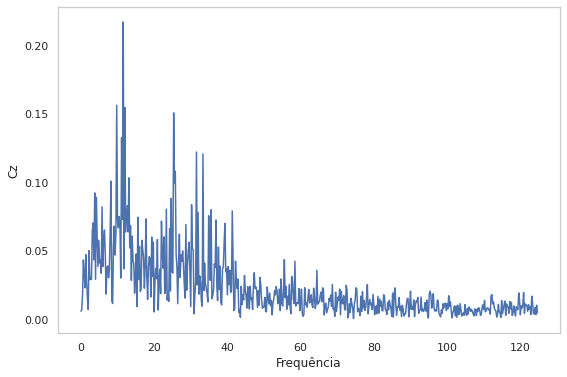

In [558]:
i=1
sen='Cz_norm'
# y is one channel of EEG data
yf = df_todos_train[i]['C3_norm']
yd= df_todos_train[i]['Cz_norm']
ye=df_todos_train[i]['C4_norm']
#print(len(yf))

xf = df_todos_train[i]['freq']
#print(len(xf))

plt.plot(xf, yf)
plt.xlabel('Frequência')
plt.ylabel('Cz')

plt.grid()

plt.show()

In [ ]:
#teste
df_todos_valid = []
df_transf = pd.DataFrame()

for data in dataset_list_valid_norm_sep:
  #print(data)
  #break
  for (mov,ep),df_mov in data.groupby(by=['condition','epoch']):
    df_transf=pd.DataFrame([i for i in range(N//2)],columns=['indice'])
    #print(df_mov)
    #break
    for sensor in sensores_normalized:
      yf = fft(df_mov[sensor].to_numpy()) 
      x = 2.0/N * np.abs(yf[0:N//2])
      xf = fftfreq(N, T)[:N//2]
      df_transf['freq'] = xf
      df_transf['condition'] = mov
      df_transf['epoch']=ep
      df_transf[sensor]= x
      #print(df_transf)
      #break
    df_todos_valid.append(df_transf) #uma lista com os valores das transformadas de fourier de cada sensor normalizado para cada movimento e cada época
np.shape(df_todos_valid)




(144, 562, 7)

In [ ]:
teste = pd.concat(df_todos_valid)
teste

,indice,freq,condition,epoch,C3_norm,Cz_norm,C4_norm
0,0,0.000000,feet,7,0.023253,0.006404,0.002575
1,1,0.222222,feet,7,0.008202,0.040608,0.012748
2,2,0.444444,feet,7,0.032328,0.026948,0.017151
3,3,0.666667,feet,7,0.011451,0.012763,0.019331
4,4,0.888889,feet,7,0.037242,0.022087,0.029506
...,...,...,...,...,...,...,...
557,557,123.777778,right_hand,40,0.006273,0.002182,0.006064
558,558,124.000000,right_hand,40,0.008278,0.006581,0.003500
559,559,124.222222,right_hand,40,0.006707,0.006656,0.004461
560,560,124.444444,right_hand,40,0.006496,0.006182,0.008211


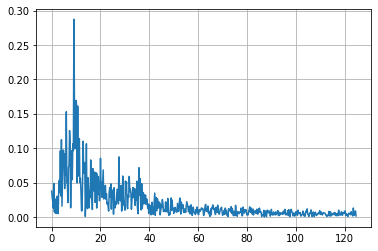

In [ ]:
i=1
sen='Cz_norm'
# y is one channel of EEG data
yf = df_todos_valid[i][sen]
#print(len(yf))

xf = df_todos_valid[i]['freq']

plt.plot(xf, yf)

plt.grid()

plt.show()

#Separando as bandas de frequência 


Treino

In [ ]:
#Bandas = Nome, limite inferior e limite superior
bandas  = [('alpha',8,12),('delta',1,3),('theta',4,7),('beta',16,24)]
vals = []


for df in df_todos_train:
  #percorre por cada banda
  for i in bandas:
    #percorre por cada coluna que deseja aplicar a banda
    df_transf = pd.DataFrame()
    for col in sensores_normalized:
    #filtra os valores daquela coluna naquela banda
      df_transf[col+'_'+i[0]] = df[(df['freq'] > i[1]) & (df['freq'] <= i[2])][col]
      df_transf['indice'] = df['indice']
      df_transf['condition'] = df['condition']
      df_transf['epoch'] = df['epoch']
    vals.append(df_transf)
    #Cria uma nova coluna com a média dos valores filtrados na banda
    #base.append([col+'_'+i[0],vals])
    #base['condition']=df['condition']
    #base[col+'_'+i[0]] = vals


In [ ]:
#sensores_alpha = ['Fz_norm_alpha', 'FC3_norm_alpha', 'FCz_norm_alpha', 'FC2_norm_alpha', 'FC4_norm_alpha',
#                  'C3_norm_alpha', 'C1_norm_alpha', 'Cz_norm_alpha','C2_norm_alpha','C4_norm_alpha', 'CP1_norm_alpha',
#                  'CPz_norm_alpha', 'CP2_norm_alpha', 'CP4_norm_alpha', 'P1_norm_alpha', 'Pz_norm_alpha', 
#                  'P2_norm_alpha', 'POz_norm_alpha']
sensores_alpha = ['C3_norm_alpha', 'Cz_norm_alpha','C4_norm_alpha']

#sensores_beta = ['Fz_norm_beta', 'FC3_norm_beta', 'FCz_norm_beta', 'FC2_norm_beta', 'FC4_norm_beta',
#                  'C3_norm_beta', 'C1_norm_beta', 'Cz_norm_beta','C2_norm_beta','C4_norm_beta', 'CP1_norm_beta',
#                  'CPz_norm_beta', 'CP2_norm_beta', 'CP4_norm_beta', 'P1_norm_beta', 'Pz_norm_beta', 
#                  'P2_norm_beta', 'POz_norm_beta']

sensores_beta = ['C3_norm_beta', 'Cz_norm_beta','C4_norm_beta']

#sensores_delta = ['Fz_norm_delta', 'FC3_norm_delta', 'FCz_norm_delta', 'FC2_norm_delta', 'FC4_norm_delta',
#                  'C3_norm_delta', 'C1_norm_delta', 'Cz_norm_delta','C2_norm_delta','C4_norm_delta', 'CP1_norm_delta',
#                  'CPz_norm_delta', 'CP2_norm_delta', 'CP4_norm_delta', 'P1_norm_delta', 'Pz_norm_delta', 
#                  'P2_norm_delta', 'POz_norm_delta']

sensores_delta = ['C3_norm_delta', 'Cz_norm_delta','C4_norm_delta']

#sensores_theta = ['Fz_norm_theta', 'FC3_norm_theta', 'FCz_norm_theta', 'FC2_norm_theta', 'FC4_norm_theta',
#                  'C3_norm_theta', 'C1_norm_theta', 'Cz_norm_theta','C2_norm_theta','C4_norm_theta', 'CP1_norm_theta',
#                  'CPz_norm_theta', 'CP2_norm_theta', 'CP4_norm_theta', 'P1_norm_theta', 'Pz_norm_theta', 
#                  'P2_norm_theta', 'POz_norm_theta']

sensores_theta = ['C3_norm_theta', 'Cz_norm_theta','C4_norm_theta']

bands=['C3_norm_alpha', 'Cz_norm_alpha','C4_norm_alpha','C3_norm_delta', 
       'Cz_norm_delta','C4_norm_delta','C3_norm_theta', 'Cz_norm_theta',
       'C4_norm_theta','C3_norm_beta', 'Cz_norm_beta','C4_norm_beta']
bands

['C3_norm_alpha',
 'Cz_norm_alpha',
 'C4_norm_alpha',
 'C3_norm_delta',
 'Cz_norm_delta',
 'C4_norm_delta',
 'C3_norm_theta',
 'Cz_norm_theta',
 'C4_norm_theta',
 'C3_norm_beta',
 'Cz_norm_beta',
 'C4_norm_beta']

Somando os valores de cada coluna (cada sensor) para ter apenas 1 valor por época para cada movimento. 

In [ ]:
soma_alpha = []
soma_delta = []
soma_theta = []
soma_beta = []

for i in range(0,len(vals),4):
  df_dataset1=pd.DataFrame()
  df_dataset2=pd.DataFrame()
  df_dataset3=pd.DataFrame()
  df_dataset4=pd.DataFrame()

  for col in sensores_alpha:
    df_dataset1['condition'] = vals[i]['condition'].unique()
    df_dataset1['epoch'] = vals[i]['epoch'].unique()
    df_dataset1[col] = vals[i][col].sum()
  soma_alpha.append(df_dataset1)  

  for col in sensores_delta:
    df_dataset2['condition'] = vals[i+1]['condition'].unique()
    df_dataset2['epoch'] = vals[i+1]['epoch'].unique()
    df_dataset2[col] = vals[i+1][col].sum()
  soma_delta.append(df_dataset2)

  for col in sensores_theta:
    df_dataset3['condition'] = vals[i+2]['condition'].unique()
    df_dataset3['epoch'] = vals[i+2]['epoch'].unique()
    df_dataset3[col] = vals[i+2][col].sum()
  soma_theta.append(df_dataset3)  

  for col in sensores_beta:
    df_dataset4['condition'] = vals[i+3]['condition'].unique()
    df_dataset4['epoch'] = vals[i+3]['epoch'].unique()
    df_dataset4[col] = vals[i+3][col].sum()
  soma_beta.append(df_dataset4) 
    
#type(df_dataset)

In [ ]:
alpha_values_train = pd.concat(soma_alpha).reset_index()

In [ ]:
delta_values_train = pd.concat(soma_delta).reset_index()

In [ ]:
theta_values_train = pd.concat(soma_theta).reset_index()

In [ ]:
beta_values_train = pd.concat(soma_beta).reset_index()

In [ ]:
treino = pd.concat([alpha_values_train[sensores_alpha],
                    delta_values_train[sensores_delta],
                    theta_values_train[sensores_theta],
                    beta_values_train[sensores_beta]], axis=1)

In [ ]:
treinoy = alpha_values_train['condition']

In [ ]:
treino

,C3_norm_alpha,Cz_norm_alpha,C4_norm_alpha,C3_norm_delta,Cz_norm_delta,C4_norm_delta,C3_norm_theta,Cz_norm_theta,C4_norm_theta,C3_norm_beta,Cz_norm_beta,C4_norm_beta
0,1.740807,1.365404,1.779563,0.167772,0.249586,0.208155,0.646010,0.952835,0.675305,1.542240,1.584832,1.843363
1,1.445136,1.348722,1.577385,0.261529,0.264127,0.249943,0.674155,1.082643,0.607122,1.309458,1.348860,1.584772
2,1.852344,1.357432,1.432335,0.189518,0.236838,0.182302,0.694701,0.873653,0.567623,1.636166,1.449145,1.634930
3,1.688412,1.224547,1.723140,0.204700,0.200889,0.178132,0.766784,0.855587,0.613126,1.492409,1.442794,1.465384
4,1.568973,1.511397,1.685534,0.227198,0.196925,0.164014,0.678779,0.995315,0.681323,1.635833,1.674120,1.560791
...,...,...,...,...,...,...,...,...,...,...,...,...
139,1.775213,1.511947,1.507173,0.208908,0.167402,0.206313,0.837662,1.082892,0.783185,1.309805,1.263580,1.506836
140,1.852344,1.357432,1.432335,0.189518,0.236838,0.182302,0.694701,0.873653,0.567623,1.636166,1.449145,1.634930
141,0.930472,1.317521,1.553864,0.169283,0.201696,0.232878,0.673035,0.804563,0.718431,1.842283,1.654227,1.865395
142,1.220577,1.332539,1.284360,0.250089,0.274096,0.239538,0.475880,0.838589,0.660226,1.680887,1.467372,1.533629


Teste

In [ ]:
#Bandas = Nome, limite inferior e limite superior
bandas  = [('alpha',8,12),('delta',1,3),('theta',4,7),('beta',16,24)]
vals = []


for df in df_todos_valid:
  #percorre por cada banda
  for i in bandas:
    #percorre por cada coluna que deseja aplicar a banda
    df_transf = pd.DataFrame()
    for col in sensores_normalized:
    #filtra os valores daquela coluna naquela banda
      df_transf[col+'_'+i[0]] = df[(df['freq'] > i[1]) & (df['freq'] <= i[2])][col]
      df_transf['indice'] = df['indice']
      df_transf['condition'] = df['condition']
      df_transf['epoch'] = df['epoch']
    vals.append(df_transf)
    #Cria uma nova coluna com a média dos valores filtrados na banda
    #base.append([col+'_'+i[0],vals])
    #base['condition']=df['condition']
    #base[col+'_'+i[0]] = vals

In [ ]:
soma_alpha = []
soma_delta = []
soma_theta = []
soma_beta = []

for i in range(0,len(vals),4):
  df_dataset1=pd.DataFrame()
  df_dataset2=pd.DataFrame()
  df_dataset3=pd.DataFrame()
  df_dataset4=pd.DataFrame()

  for col in sensores_alpha:
    df_dataset1['condition'] = vals[i]['condition'].unique()
    df_dataset1['epoch'] = vals[i]['epoch'].unique()
    df_dataset1[col] = vals[i][col].sum()
  soma_alpha.append(df_dataset1)  

  for col in sensores_delta:
    df_dataset2['condition'] = vals[i+1]['condition'].unique()
    df_dataset2['epoch'] = vals[i+1]['epoch'].unique()
    df_dataset2[col] = vals[i+1][col].sum()
  soma_delta.append(df_dataset2)

  for col in sensores_theta:
    df_dataset3['condition'] = vals[i+2]['condition'].unique()
    df_dataset3['epoch'] = vals[i+2]['epoch'].unique()
    df_dataset3[col] = vals[i+2][col].sum()
  soma_theta.append(df_dataset3)  

  for col in sensores_beta:
    df_dataset4['condition'] = vals[i+3]['condition'].unique()
    df_dataset4['epoch'] = vals[i+3]['epoch'].unique()
    df_dataset4[col] = vals[i+3][col].sum()
  soma_beta.append(df_dataset4) 
    
#type(df_dataset)

In [ ]:
alpha_values_test = pd.concat(soma_alpha).reset_index()

In [ ]:
delta_values_test = pd.concat(soma_delta).reset_index()

In [ ]:
theta_values_test = pd.concat(soma_theta).reset_index()

In [ ]:
beta_values_test = pd.concat(soma_beta).reset_index()

In [ ]:
teste = pd.concat([alpha_values_test[sensores_alpha],
                    delta_values_test[sensores_delta],
                    theta_values_test[sensores_theta],
                    beta_values_test[sensores_beta]], axis=1)

In [ ]:
teste

,C3_norm_alpha,Cz_norm_alpha,C4_norm_alpha,C3_norm_delta,Cz_norm_delta,C4_norm_delta,C3_norm_theta,Cz_norm_theta,C4_norm_theta,C3_norm_beta,Cz_norm_beta,C4_norm_beta
0,1.980406,1.524248,2.005374,0.217716,0.224510,0.246969,0.641088,1.276143,0.889110,1.654077,1.230680,1.736202
1,1.924054,1.944291,2.029182,0.300416,0.169123,0.177154,0.789986,0.880119,0.618614,1.338767,1.360258,1.748298
2,1.533964,1.482781,1.850557,0.226132,0.203227,0.254194,0.755215,1.117085,0.933820,1.729749,1.280458,1.720479
3,2.032499,1.646297,1.922479,0.214238,0.292709,0.212523,0.747446,1.224535,0.879008,1.285335,1.222661,1.697363
4,1.971117,1.515122,1.922516,0.205860,0.267920,0.289648,0.776889,1.232785,0.760049,1.550123,1.438838,1.753742
...,...,...,...,...,...,...,...,...,...,...,...,...
139,1.636734,1.753139,1.758609,0.224663,0.258773,0.322768,0.939316,1.388890,0.978515,1.517937,1.370018,1.943582
140,1.533964,1.482781,1.850557,0.226132,0.203227,0.254194,0.755215,1.117085,0.933820,1.729749,1.280458,1.720479
141,1.626391,1.695940,1.828202,0.226672,0.197263,0.215222,1.050704,1.150854,0.851665,1.603057,1.464935,1.863940
142,2.032591,1.694128,1.919854,0.211567,0.289525,0.284194,0.735528,1.053657,0.778267,1.457754,1.298618,1.349160


In [ ]:
testey = alpha_values_test['condition']

# Scatter


In [ ]:
import plotly.express as px
df = pd.concat([treino,treinoy], axis=1)
fig = px.scatter(df, x=bands, y='condition')
fig.show()

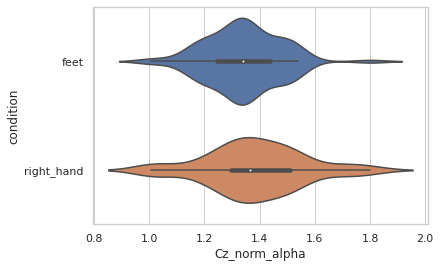

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")
df = pd.concat([treino,treinoy], axis=1)
ax = sns.violinplot(x='Cz_norm_alpha', y='condition', data=df)

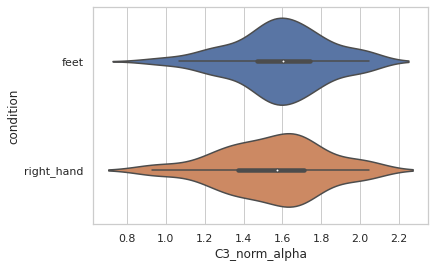

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='C3_norm_alpha', y='condition', data=df)

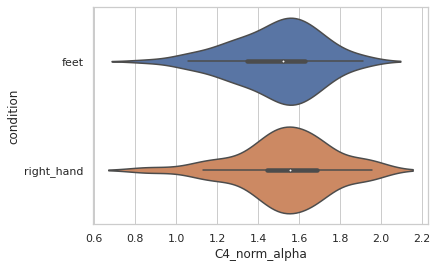

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='C4_norm_alpha', y='condition', data=df)

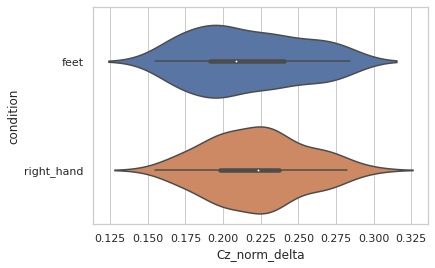

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='Cz_norm_delta', y='condition', data=df)

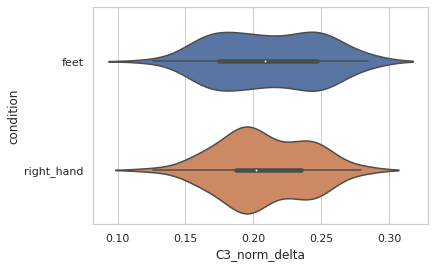

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='C3_norm_delta', y='condition', data=df)

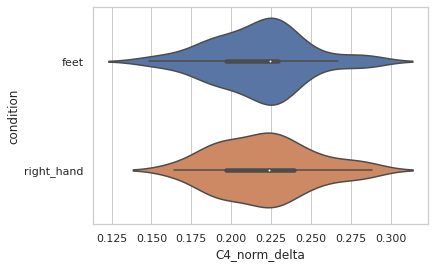

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='C4_norm_delta', y='condition', data=df)

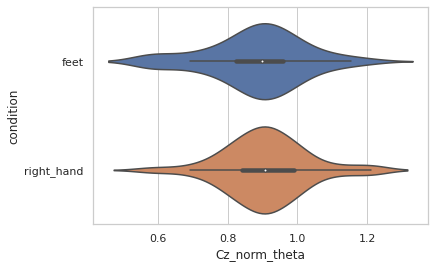

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='Cz_norm_theta', y='condition', data=df)

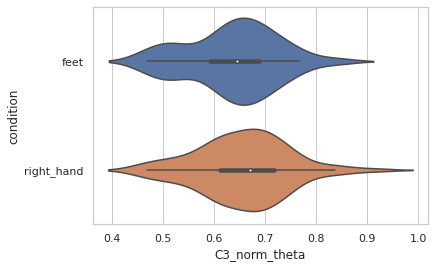

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='C3_norm_theta', y='condition', data=df)

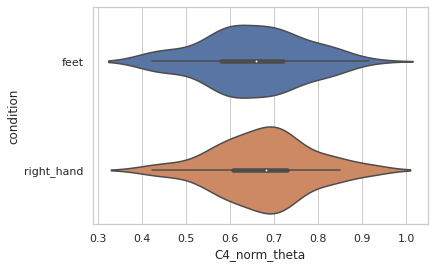

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='C4_norm_theta', y='condition', data=df)

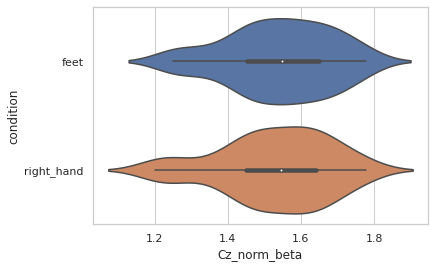

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='Cz_norm_beta', y='condition', data=df)

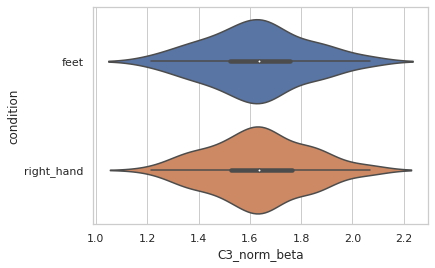

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='C3_norm_beta', y='condition', data=df)

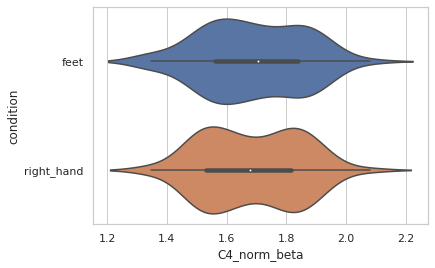

In [ ]:
sns.set_theme(style="whitegrid")
ax = sns.violinplot(x='C4_norm_beta', y='condition', data=df)

# Histograma

In [ ]:
import plotly.express as px
df=pd.concat([treino,treinoy], axis=1)
px.histogram(df, x=bands,template='ggplot2', width=800)

In [ ]:
# Plotting the histogram.

for i in bands:
  fig = px.histogram(df[i], histnorm='probability density',width=500,height=400)
  fig.show()

# Passando os modelos interpretáveis


não deu detalhes do processamento e do significado dos atributos após processamento. Quantos atributos teremos ao final? Todos contínuos?

Para as próximas etapas pode ser importante fazer uma exploração da base: histograma de distribuição e scatter plot dos valores do atributo contra a variável-alvo.

Utilize uma formatação de artigo científico.



#Definindo conjuntos de treino e de teste para os modelos


In [ ]:
X_train_df = treino
y_train_df = treinoy

X_test_df = teste
y_test_df = testey

In [ ]:
X_train_list = treino.to_numpy()
y_train_list = treinoy.astype('category').cat.codes.to_numpy()

X_test_list = teste.to_numpy()
y_test_list = testey.astype('category').cat.codes.to_numpy()

In [ ]:
X_alpha_train = alpha_values_train[sensores_alpha]
X_delta_train = delta_values_train[sensores_delta]
X_theta_train = theta_values_train[sensores_theta]
X_beta_train = beta_values_train[sensores_beta]

y_alpha_train = alpha_values_train['condition'].astype('category').cat.codes
y_delta_train = delta_values_train['condition'].astype('category').cat.codes
y_theta_train = theta_values_train['condition'].astype('category').cat.codes
y_beta_train = beta_values_train['condition'].astype('category').cat.codes

In [ ]:
X_alpha_test = alpha_values_test[sensores_alpha]
X_delta_test = delta_values_test[sensores_delta]
X_theta_test = theta_values_test[sensores_theta]
X_beta_test = beta_values_test[sensores_beta]

y_alpha_test = alpha_values_train['condition'].astype('category').cat.codes
y_delta_test = delta_values_train['condition'].astype('category').cat.codes
y_theta_test = theta_values_train['condition'].astype('category').cat.codes
y_beta_test = beta_values_train['condition'].astype('category').cat.codes

## Grid Search


In [ ]:
from sklearn import svm, datasets
from sklearn.model_selection import GridSearchCV

parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10]}
svc = svm.SVC()
clf = GridSearchCV(svc, parameters)
clf.fit(X_train_df, y_train_df)
#GridSearchCV(estimator=svc,param_grid={'C': [1, 10], 'kernel': ('linear', 'rbf')})
#achar 
clf.best_params_

{'C': 10, 'kernel': 'linear'}

# Regressão

Logística, Poisson ou Multinomial

### Logística


In [ ]:
#Logística
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}

logreg = LogisticRegression()
clf_logreg_df = GridSearchCV(logreg,grid,cv=10)

clf_logreg_df.fit(X_train_df, y_train_df)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.7/dist-packages/sklearn/lin

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2']})

In [ ]:
print("tuned hpyerparameters :(best parameters) ",clf_logreg_df.best_params_)
print("accuracy :",clf_logreg_df.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2'}
accuracy : 0.5309523809523811


In [ ]:
clf_logreg_df.score(X_test_df, y_test_df)

0.5208333333333334

In [ ]:
clf_logreg_df.score(X_train_df, y_train_df)

0.5833333333333334

In [ ]:
logreg.fit(X_train_df, y_train_df)
logreg.score(X_test_df, y_test_df)

0.5208333333333334

In [ ]:
logreg1 = LogisticRegression()
logreg2 = LogisticRegression()
logreg3 = LogisticRegression()
logreg4 = LogisticRegression()

logreg1.fit(X_alpha_train, y_alpha_train)
logreg2.fit(X_delta_train, y_delta_train)
logreg3.fit(X_theta_train, y_theta_train)
logreg4.fit(X_beta_train, y_beta_train)

LogisticRegression()

In [ ]:
logreg1.score(X_alpha_test, y_alpha_test)

0.4791666666666667

In [ ]:
logreg2.score(X_delta_test, y_delta_test)

0.4861111111111111

In [ ]:
logreg3.score(X_theta_test, y_theta_test)

0.5

In [ ]:
logreg4.score(X_beta_test, y_beta_test)

0.4791666666666667

### PDP

In [ ]:
X_train_df.columns

Index(['C3_norm_alpha', 'Cz_norm_alpha', 'C4_norm_alpha', 'C3_norm_delta',
       'Cz_norm_delta', 'C4_norm_delta', 'C3_norm_theta', 'Cz_norm_theta',
       'C4_norm_theta', 'C3_norm_beta', 'Cz_norm_beta', 'C4_norm_beta'],
      dtype='object')

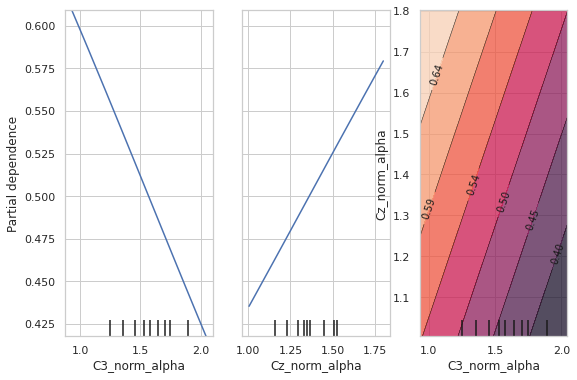

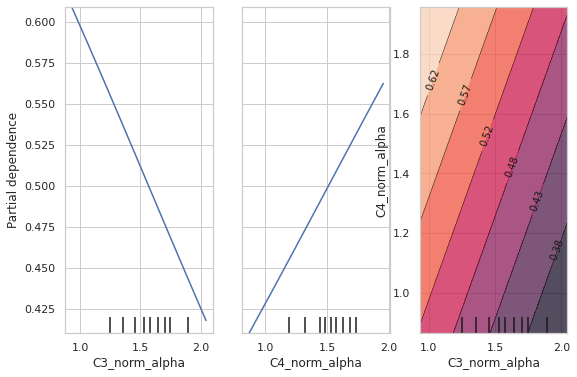

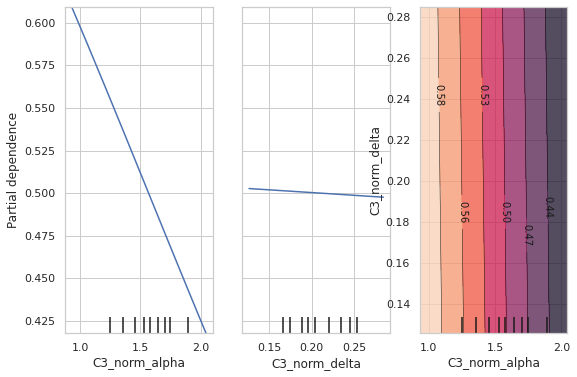

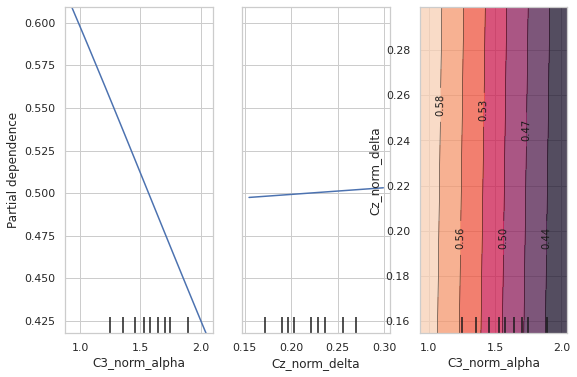

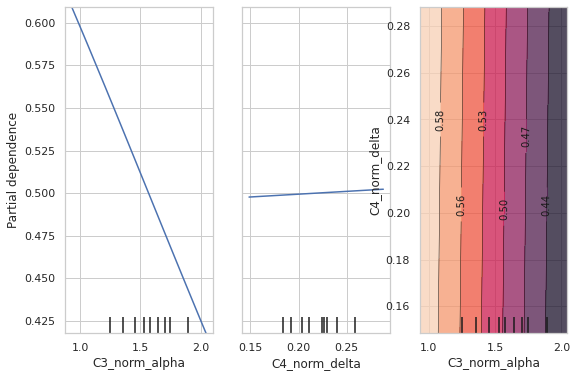

...

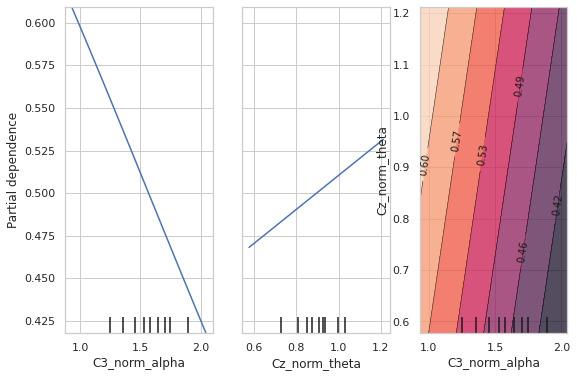

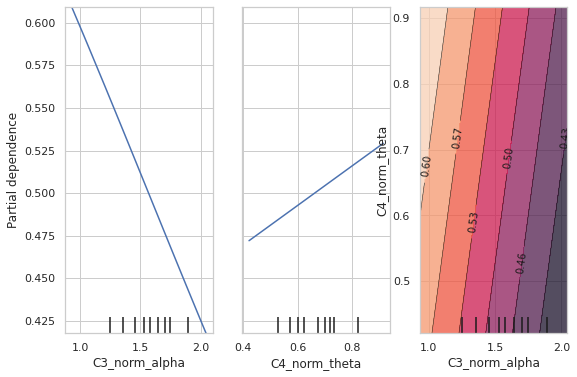

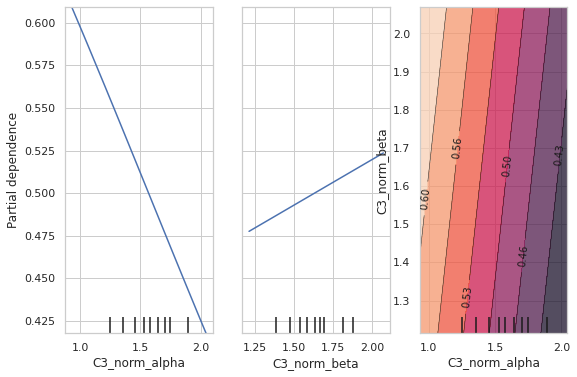

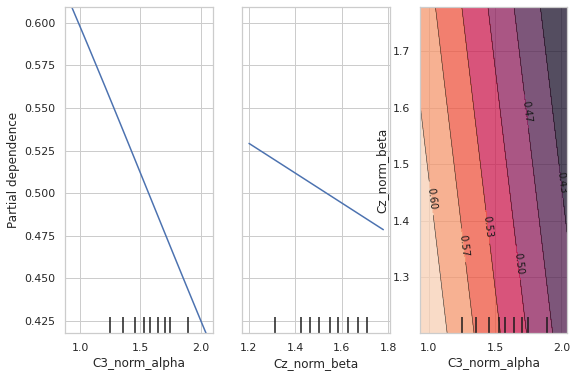

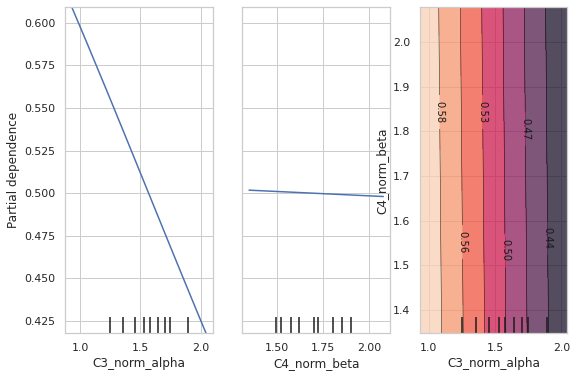

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=0
for i in range(1,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

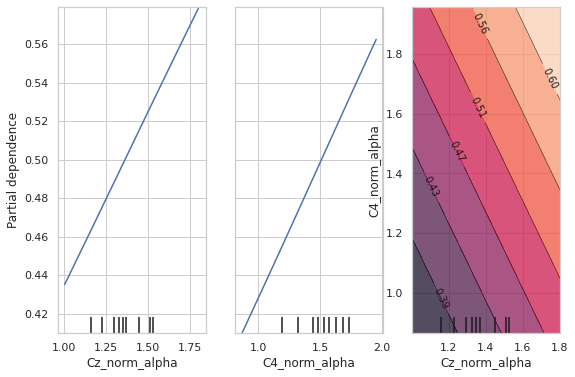

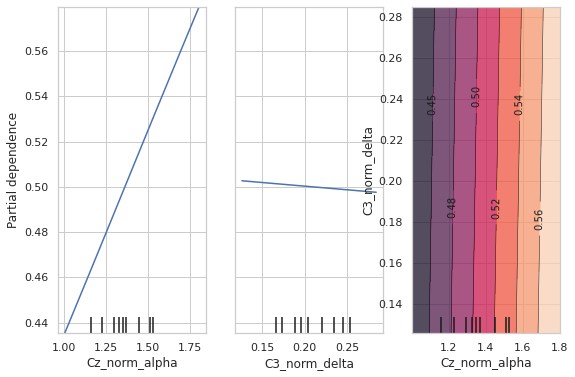

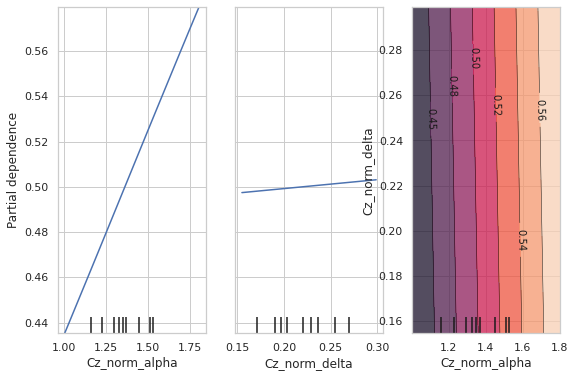

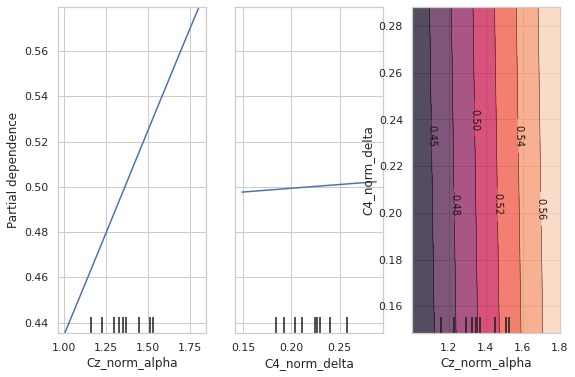

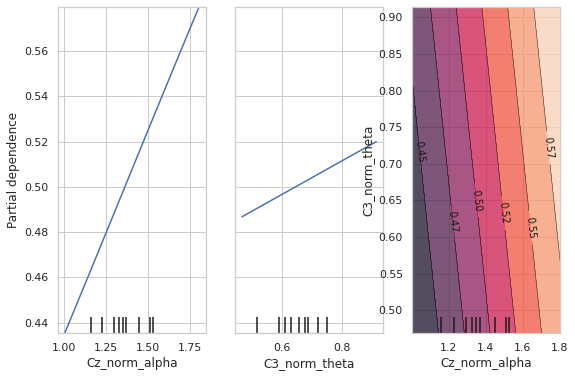

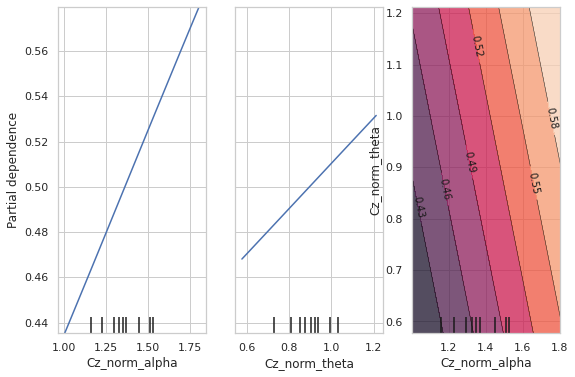

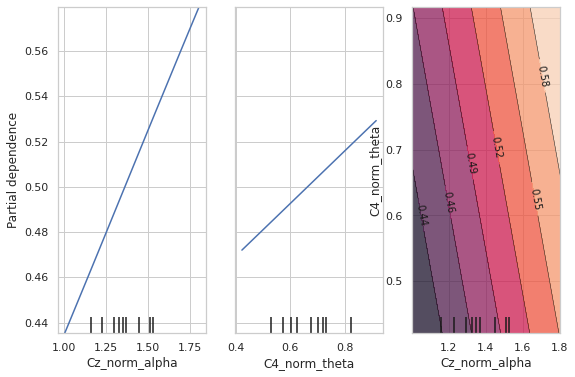

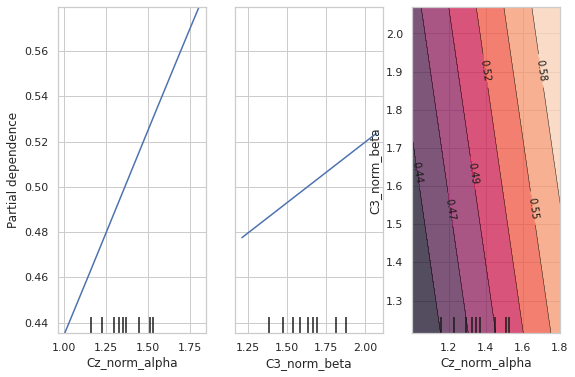

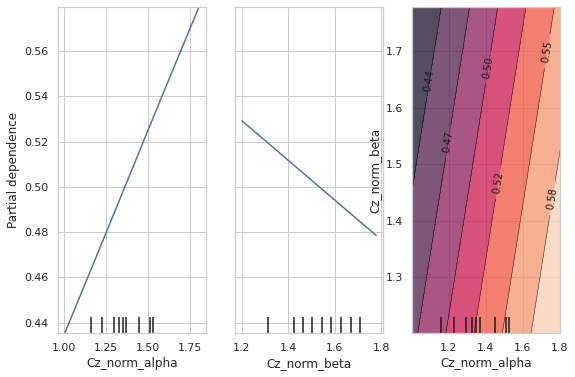

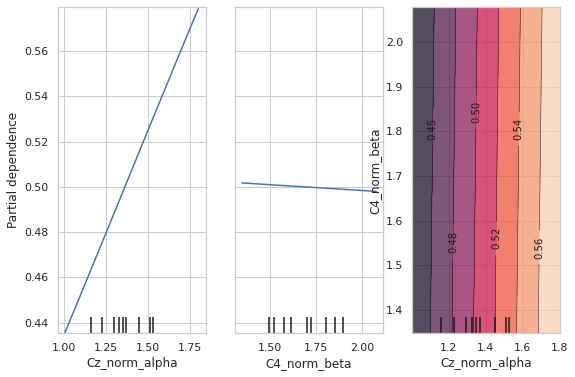

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=1
for i in range(2,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

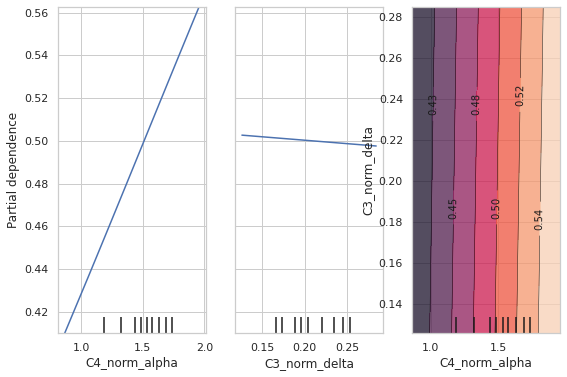

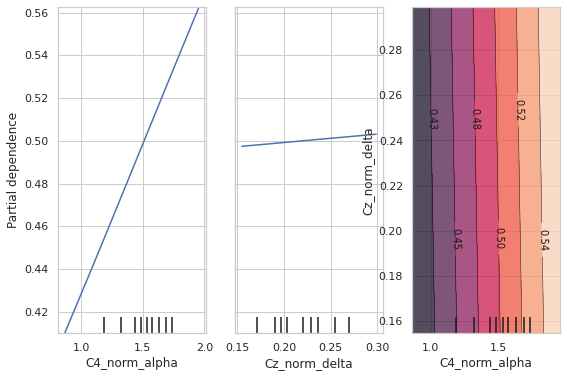

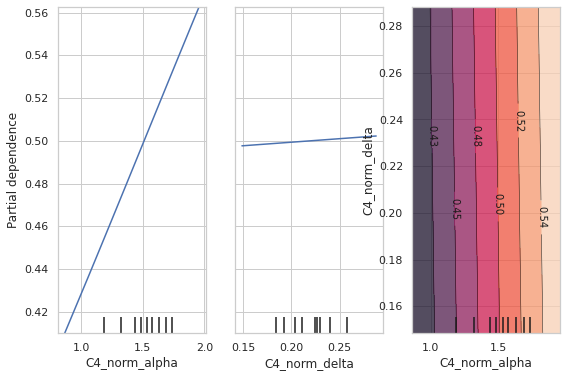

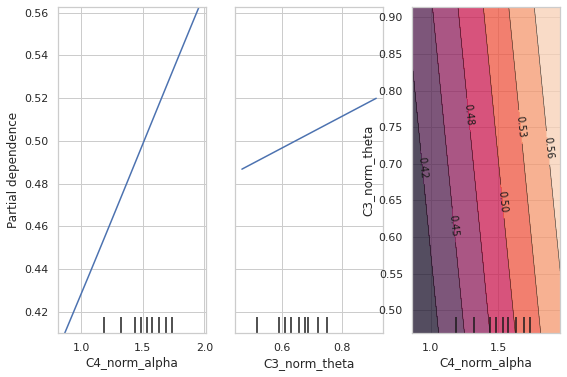

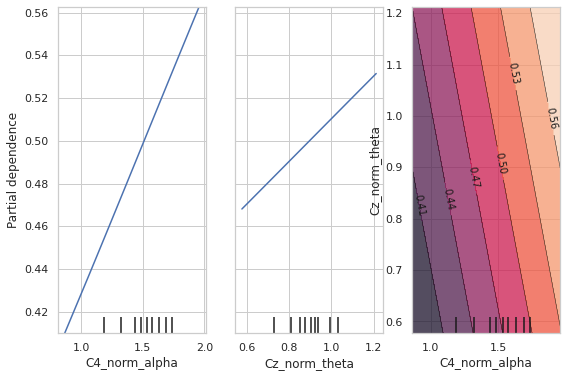

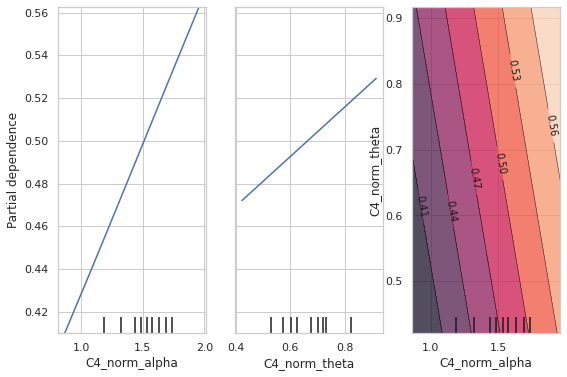

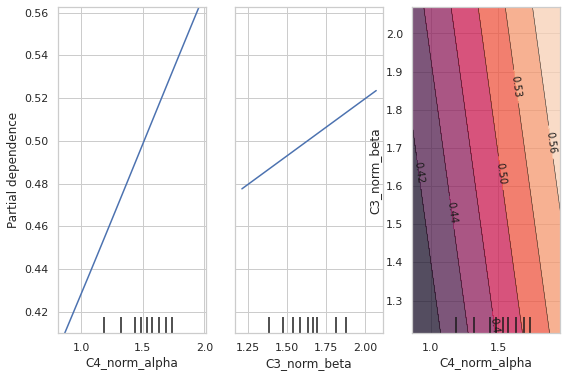

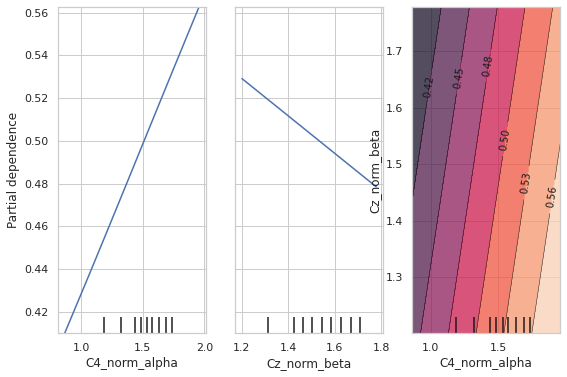

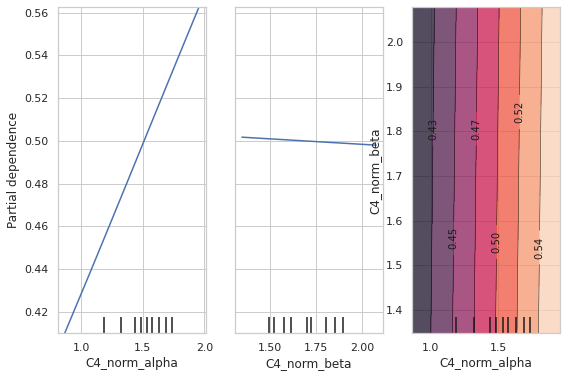

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=2
for i in range(3,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

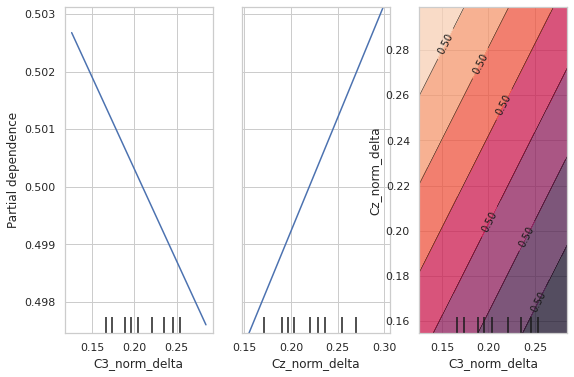

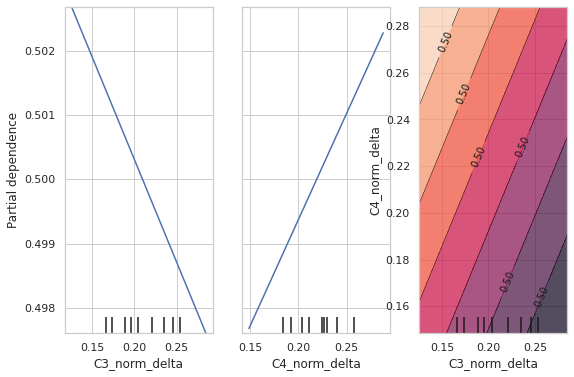

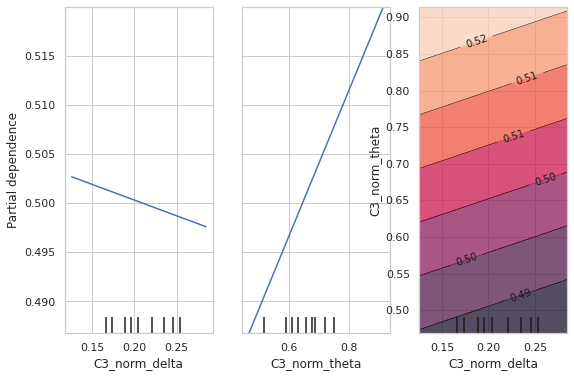

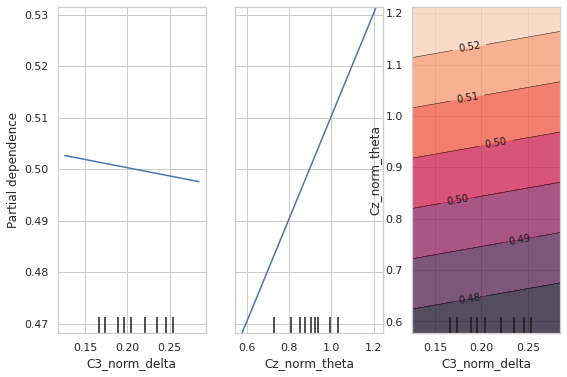

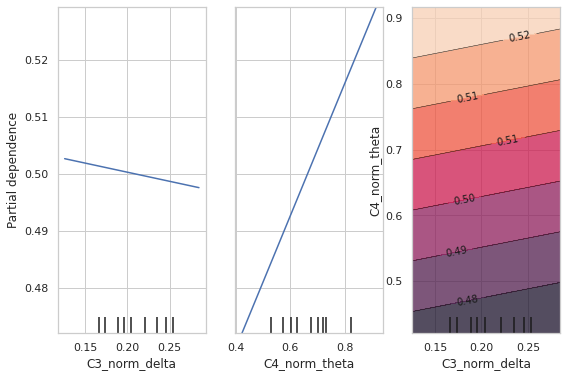

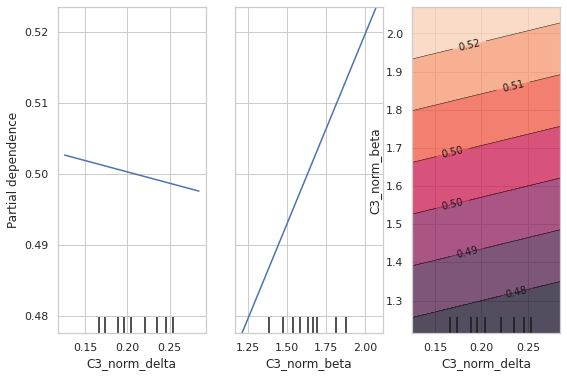

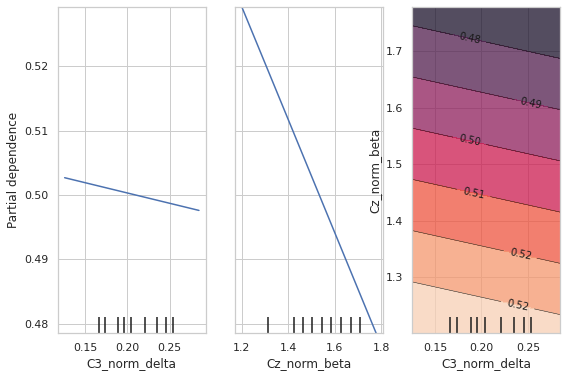

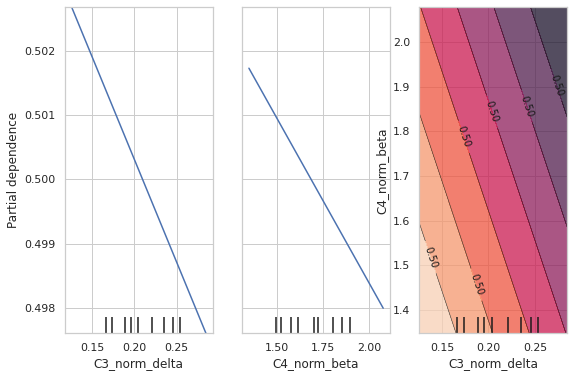

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=3
for i in range(4,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

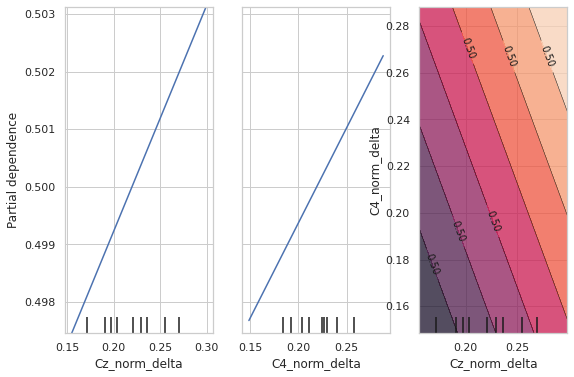

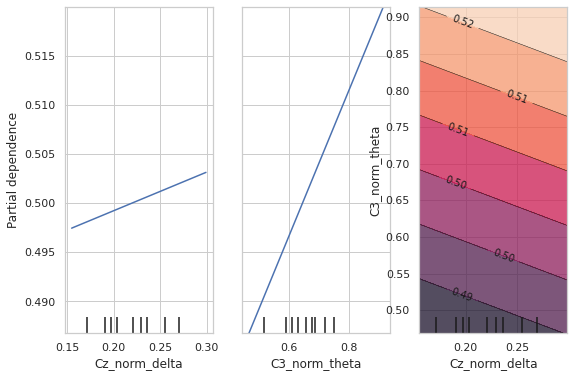

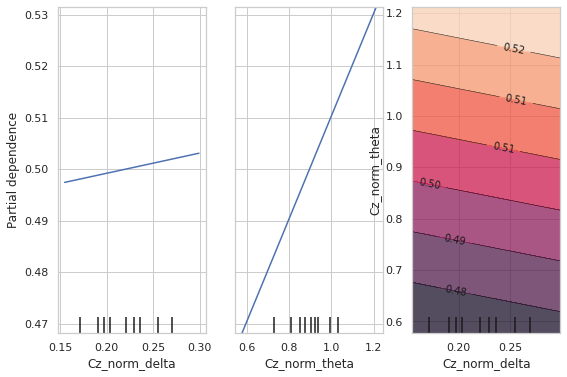

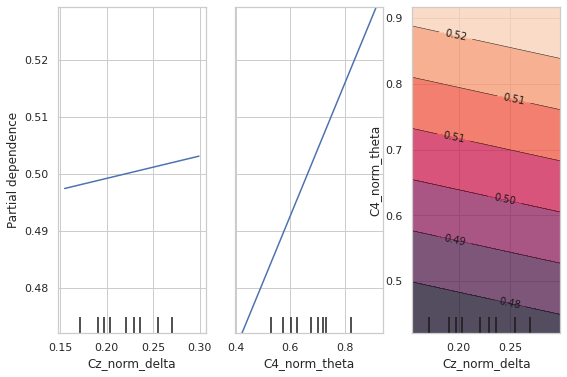

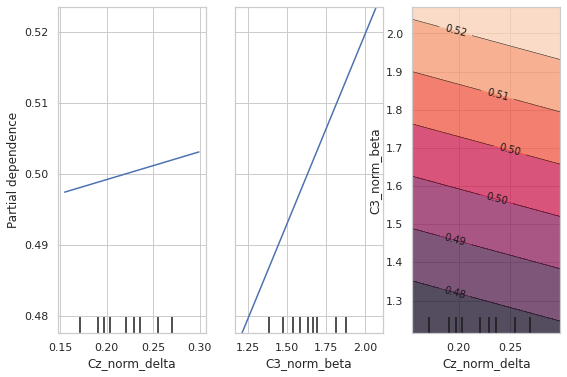

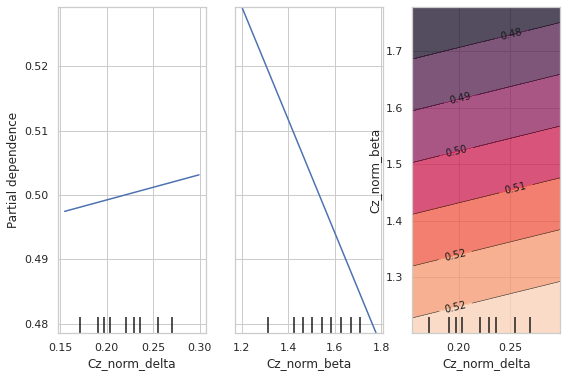

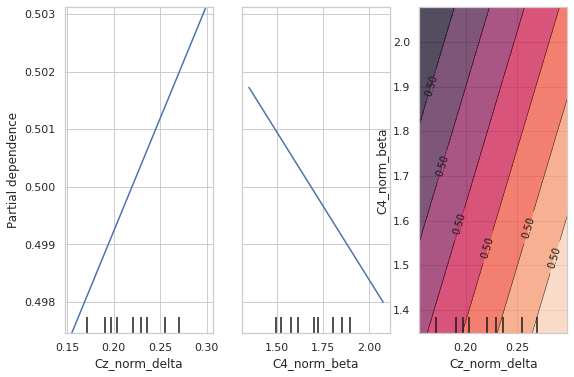

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=4
for i in range(5,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

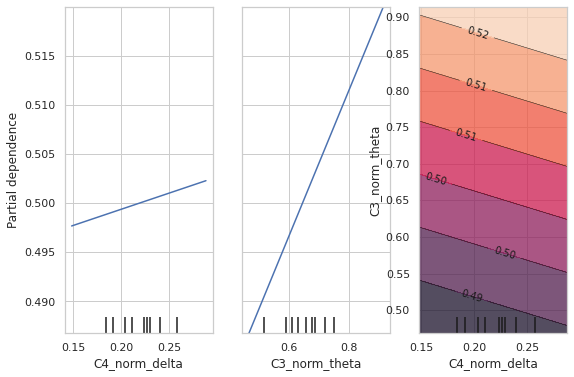

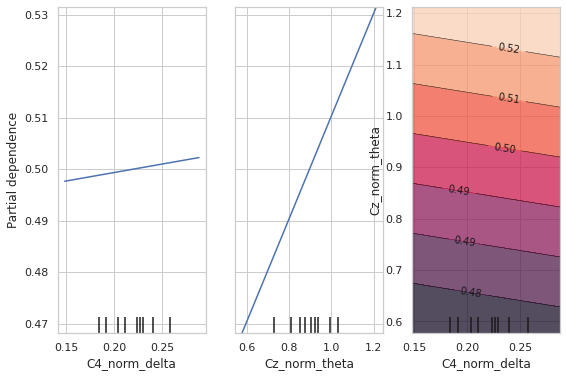

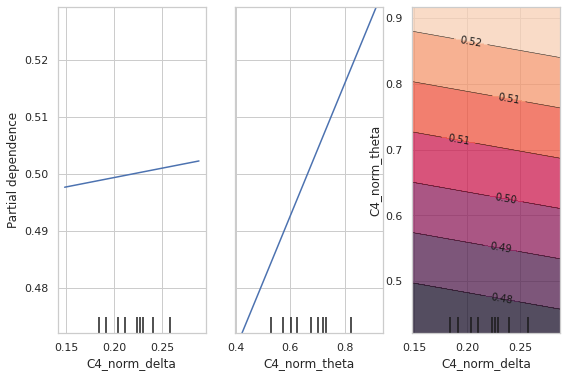

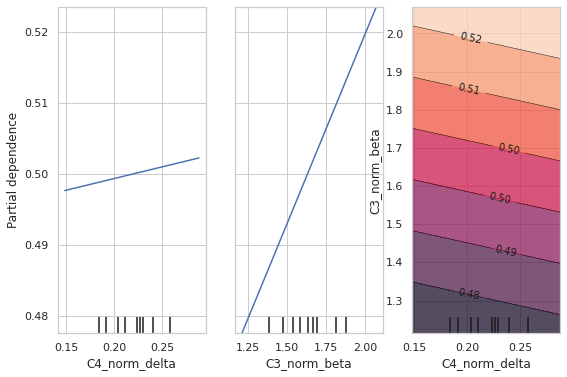

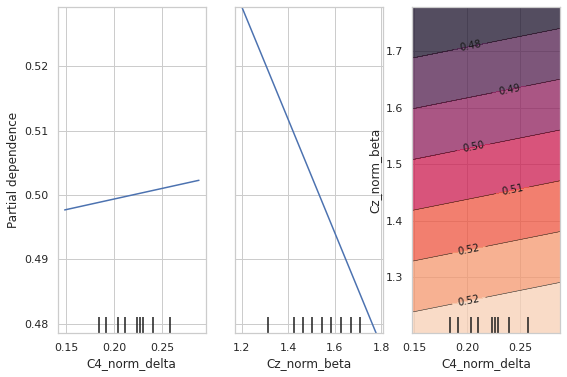

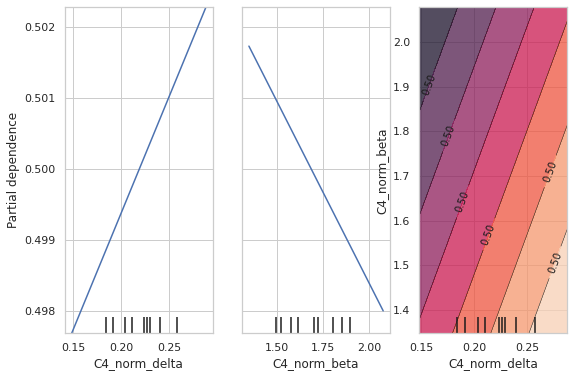

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=5
for i in range(6,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

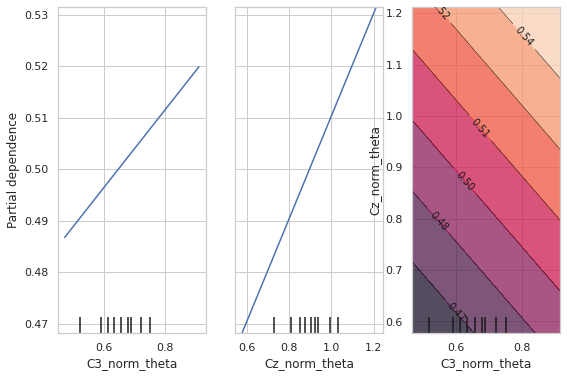

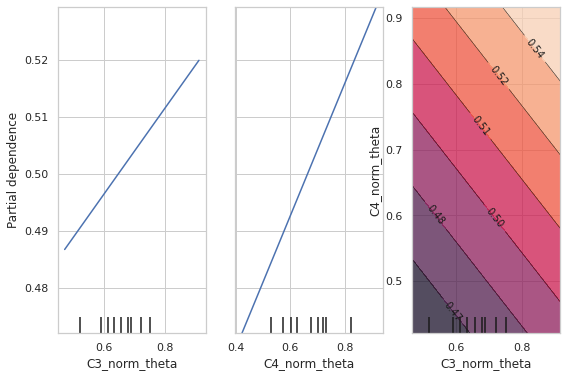

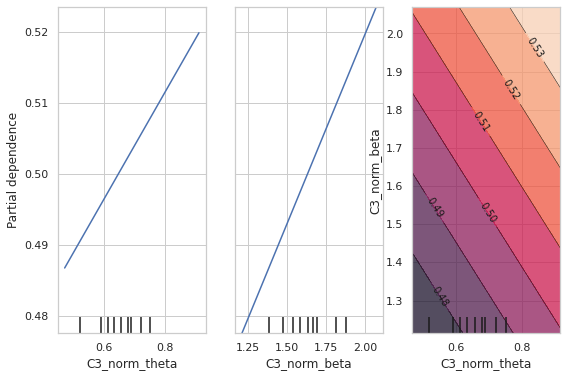

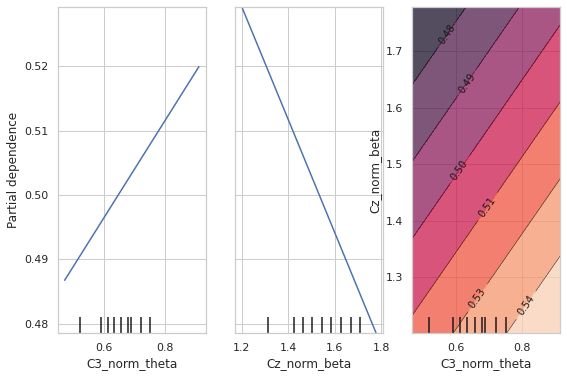

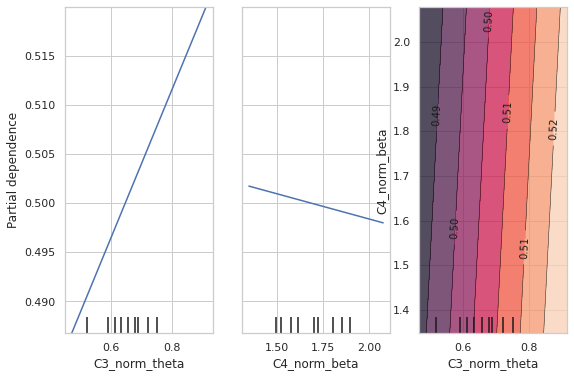

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=6
for i in range(7,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

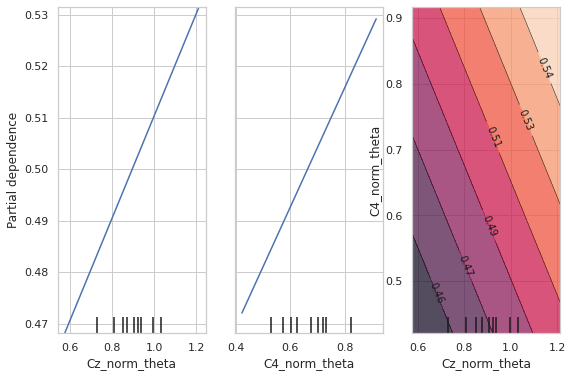

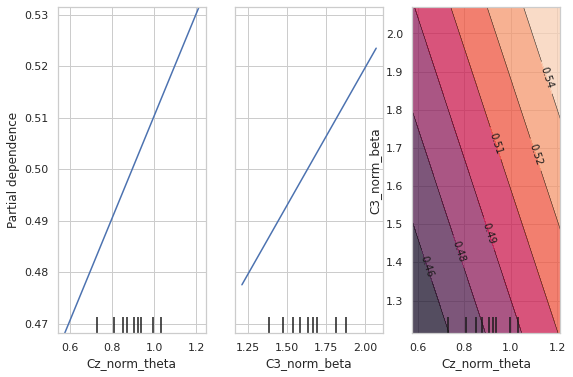

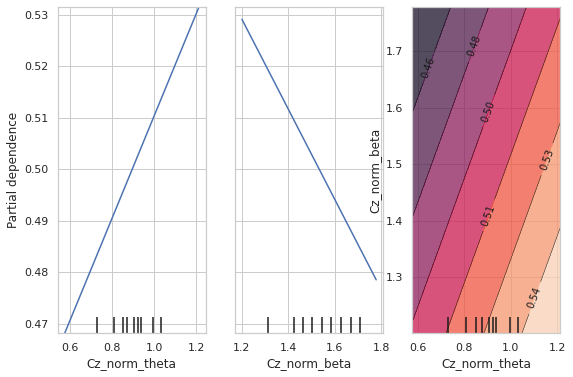

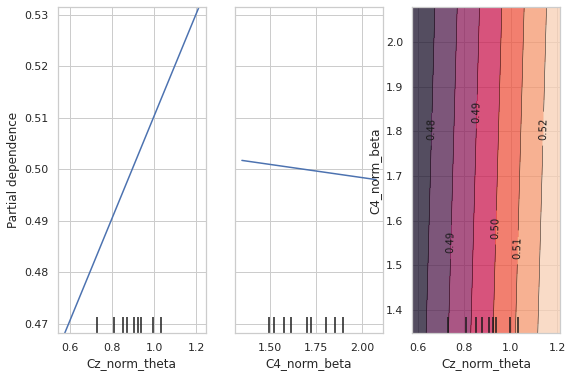

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=7
for i in range(8,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

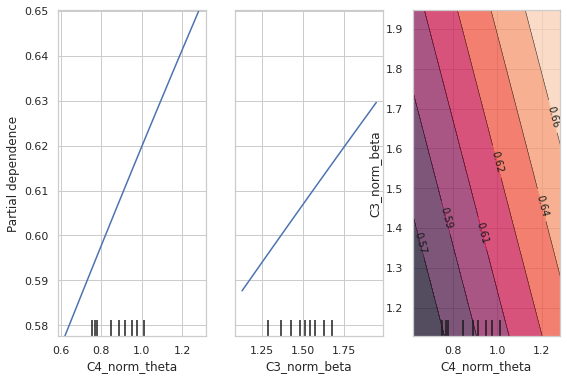

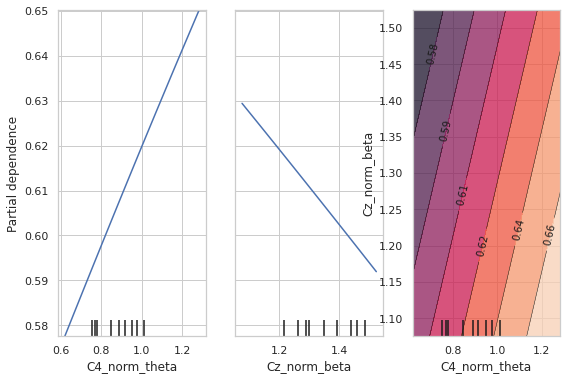

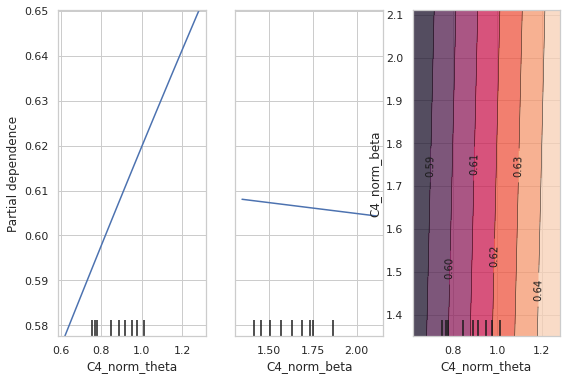

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=8
for i in range(9,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

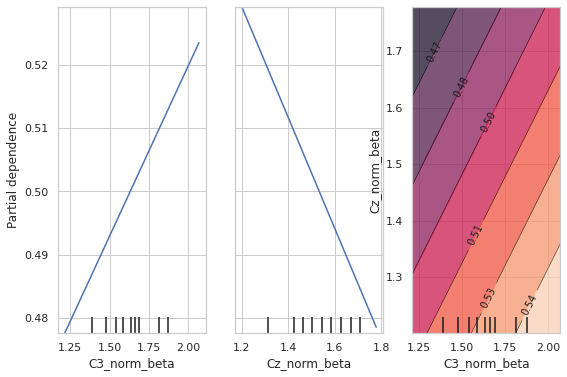

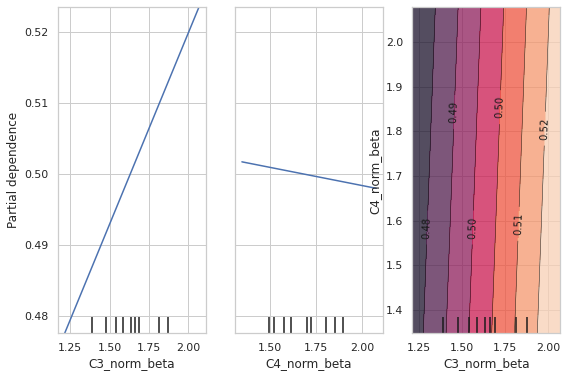

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=9
for i in range(10,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

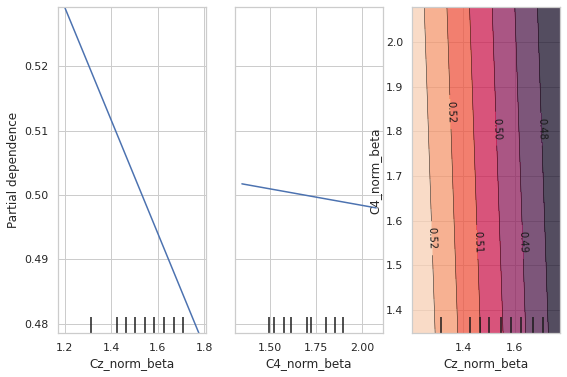

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=10
i=11
features = [j,i, (j,i)]
PartialDependenceDisplay.from_estimator(clf_logreg_df, X_train_df, features)

Permutation Feature Importance

In [ ]:
X_train_df.columns

Index(['C3_norm_alpha', 'Cz_norm_alpha', 'C4_norm_alpha', 'C3_norm_delta',
       'Cz_norm_delta', 'C4_norm_delta', 'C3_norm_theta', 'Cz_norm_theta',
       'C4_norm_theta', 'C3_norm_beta', 'Cz_norm_beta', 'C4_norm_beta'],
      dtype='object')

In [ ]:
from sklearn.inspection import permutation_importance
r = permutation_importance(clf_logreg_df, X_train_df, y_train_df,
                           n_repeats=30,
                           random_state=0)
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{X_train_df.columns[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")


### ICE

In [ ]:
x1=X_train_df[0:48]
x2=X_train_df[48:96]
x3=X_train_df[96:]

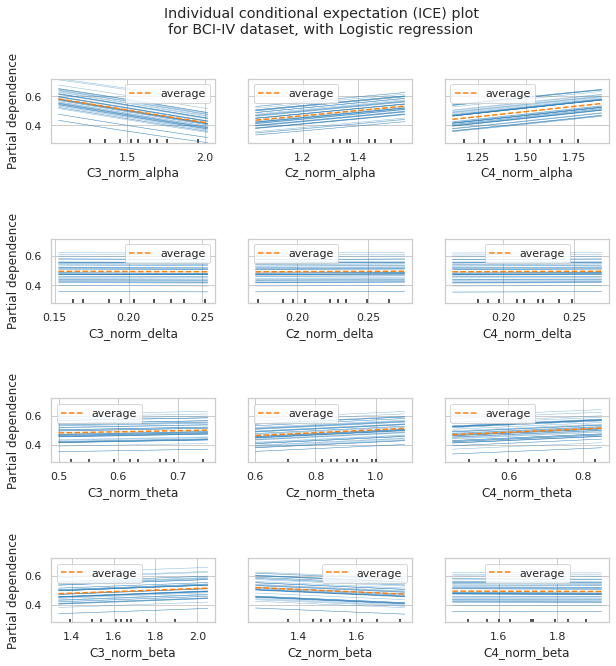

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_logreg_df,
    x1,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Logistic regression"
)
display.figure_.subplots_adjust(hspace=1.5)

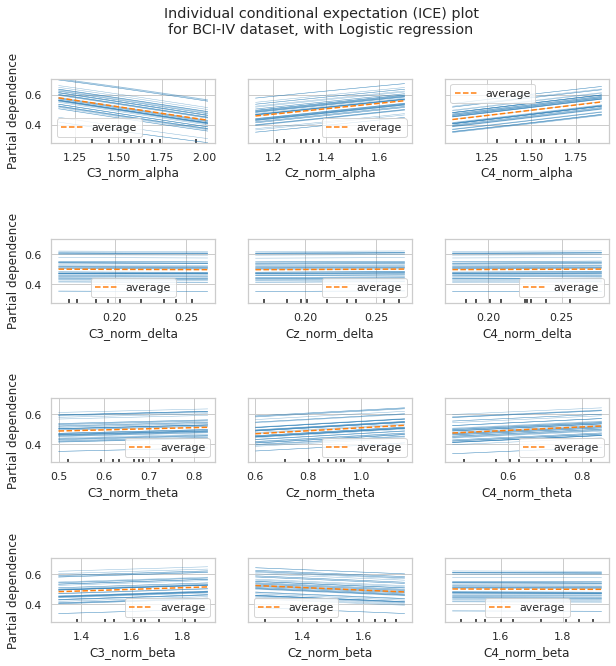

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_logreg_df,
    x2,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Logistic regression"
)
display.figure_.subplots_adjust(hspace=1.5)

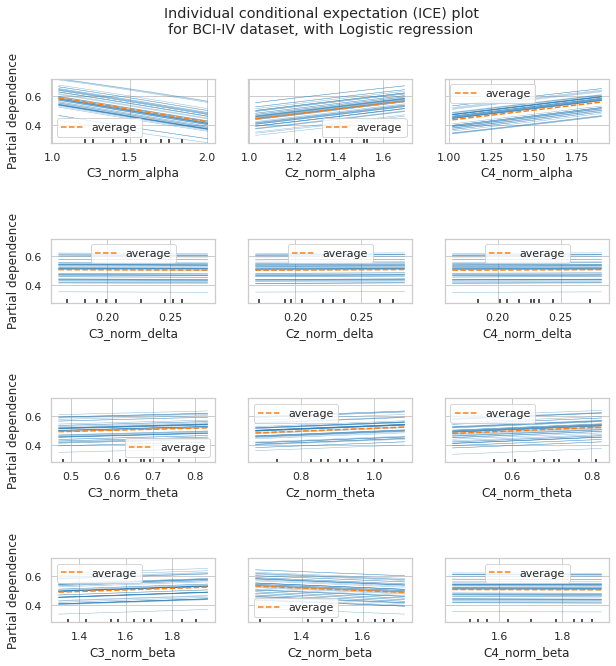

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_logreg_df,
    x3,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Logistic regression"
)
display.figure_.subplots_adjust(hspace=1.5)

### Multinomial


In [ ]:
#Multinomial

# evaluate multinomial logistic regression model
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression

# define the multinomial logistic regression model
modelo = LogisticRegression(multi_class='multinomial', solver='lbfgs')
# define the model evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate the model and collect the scores
n_scores = cross_val_score(modelo, X_train_df, y_train_df, scoring='accuracy', cv=cv, n_jobs=-1)
# report the model performance
print('Mean Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))
modelo.fit(X_train_df,y_train_df)

Mean Accuracy: 0.521 (0.103)


LogisticRegression(multi_class='multinomial')

In [ ]:
modelo.score(X_test_df,y_test_df)

0.5208333333333334

In [ ]:
modelo.score(X_train_df,y_train_df)

0.5833333333333334

In [ ]:
clf_modelo = GridSearchCV(modelo,grid,cv=10)

clf_modelo.fit(X_train_df, y_train_df)

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the doc

GridSearchCV(cv=10, estimator=LogisticRegression(multi_class='multinomial'),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2']})

In [ ]:
print("tuned hpyerparameters :(best parameters) ",clf_modelo.best_params_)
print("accuracy :",clf_modelo.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 1.0, 'penalty': 'l2'}
accuracy : 0.5385714285714285


In [ ]:
clf_modelo.score(X_test_df,y_test_df)

0.5208333333333334

###PDP

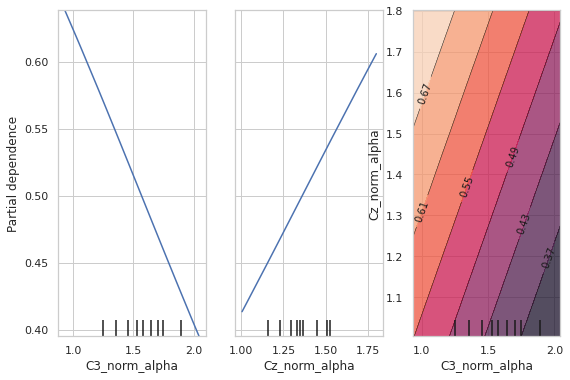

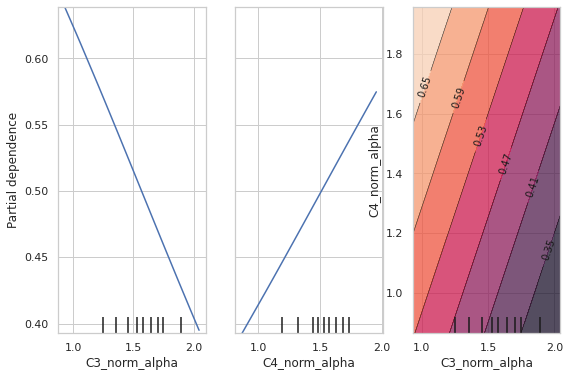

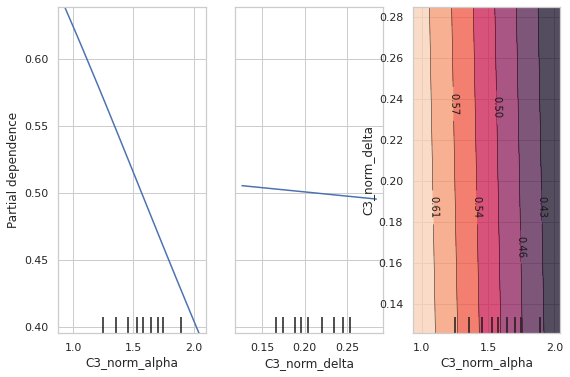

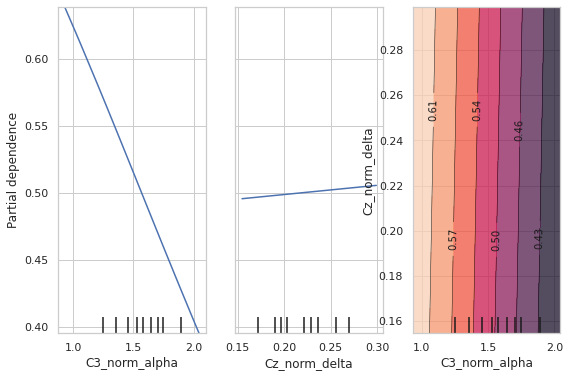

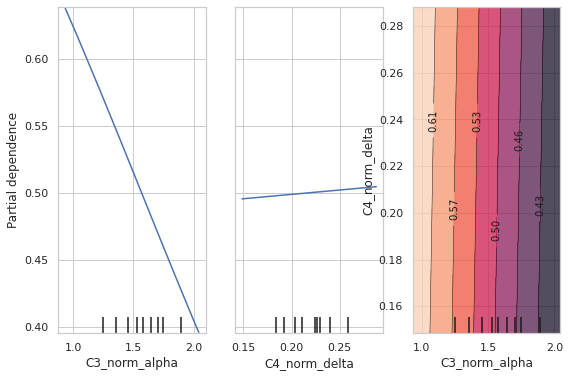

...

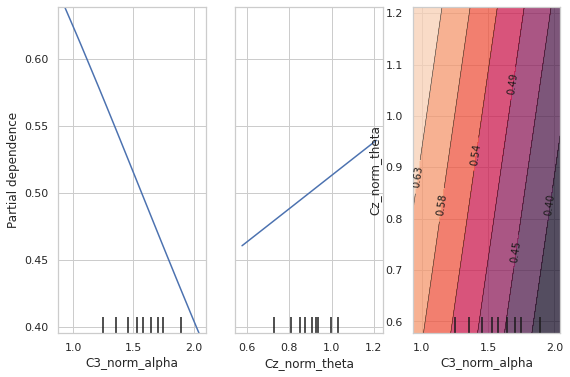

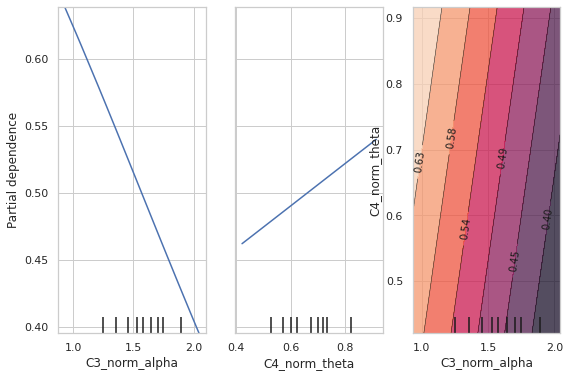

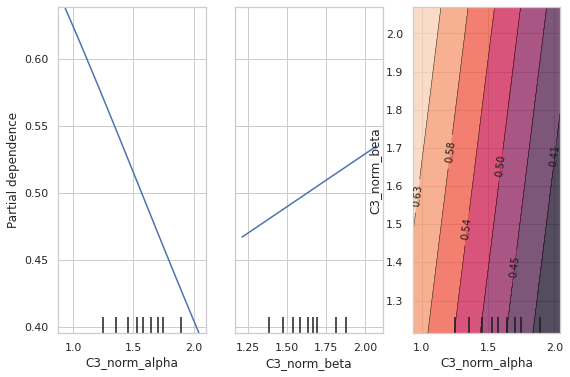

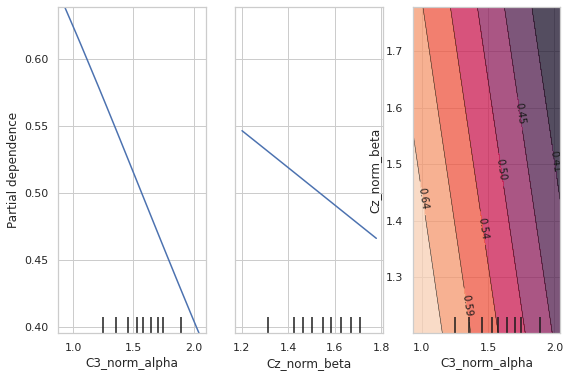

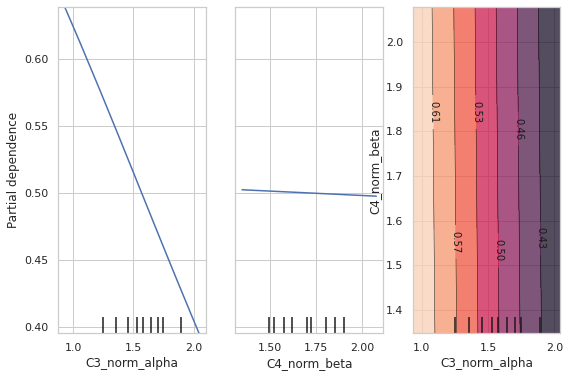

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=0
for i in range(1,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

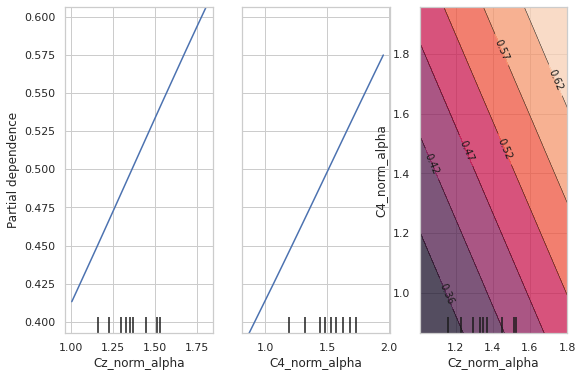

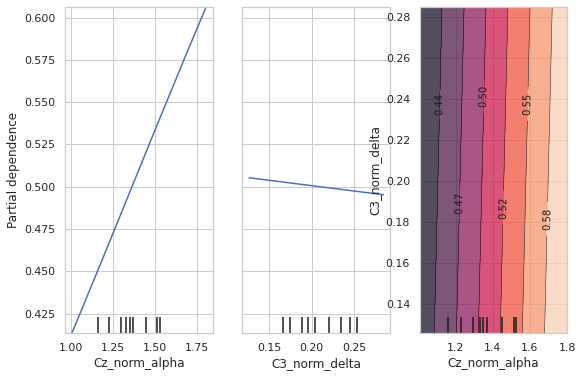

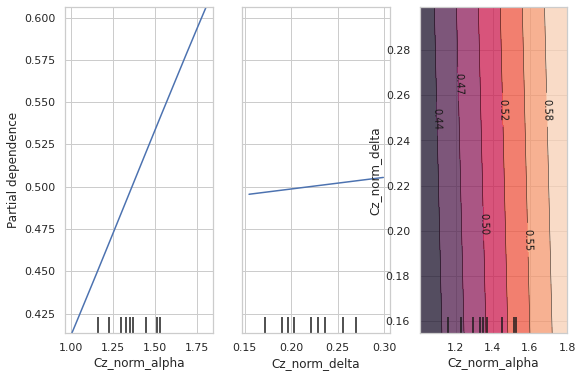

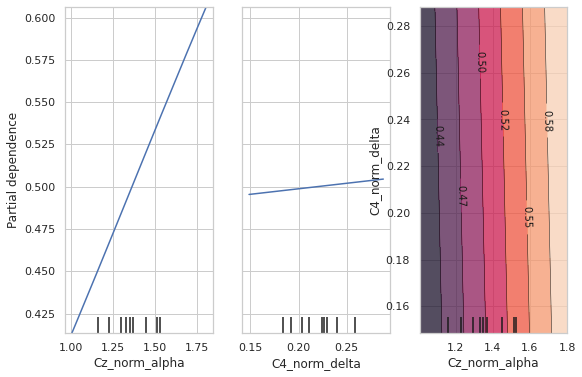

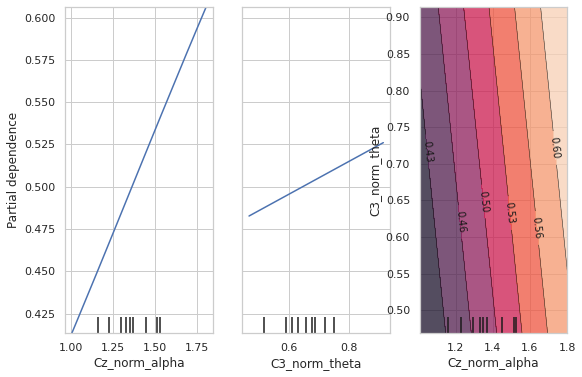

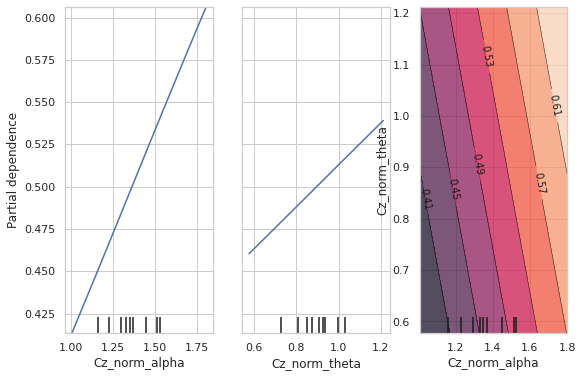

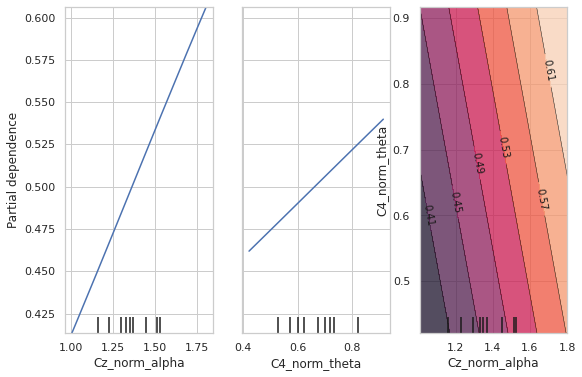

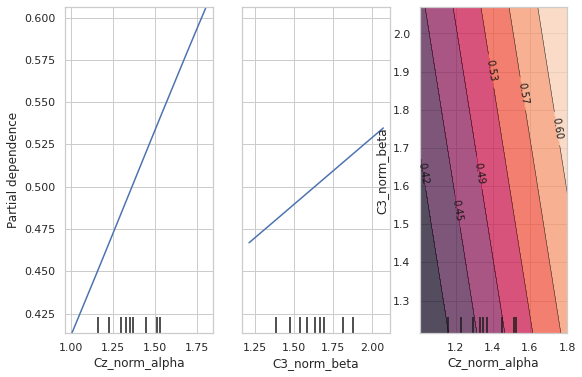

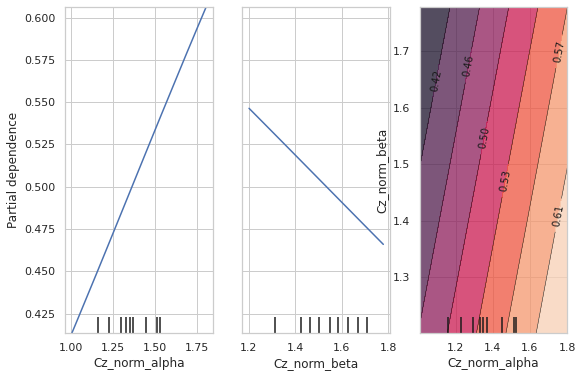

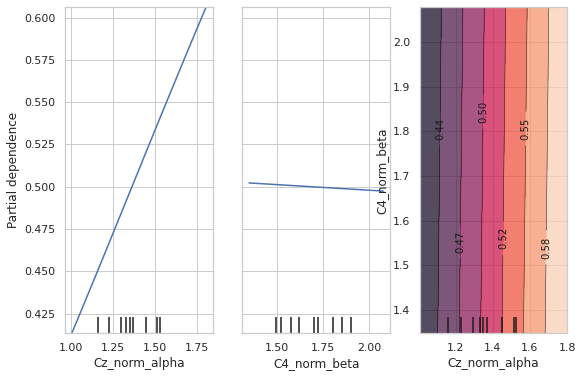

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=1
for i in range(2,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

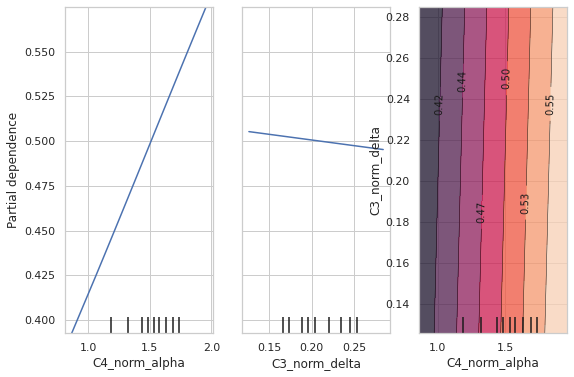

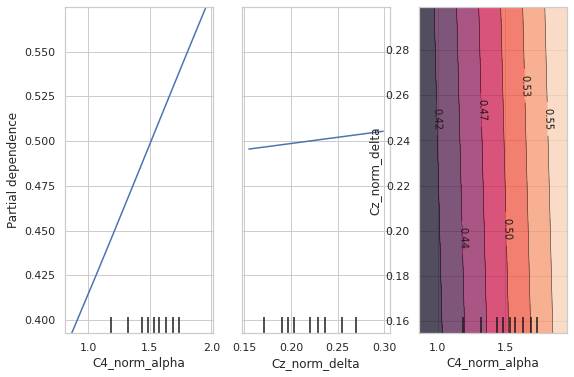

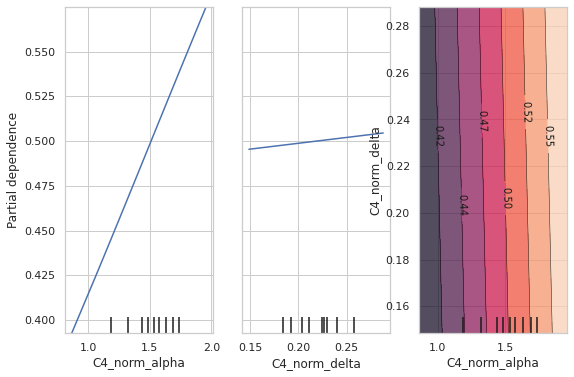

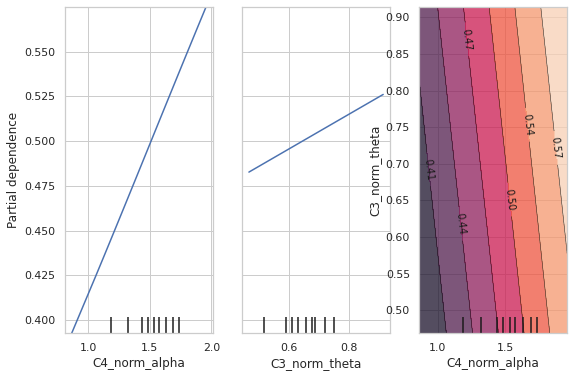

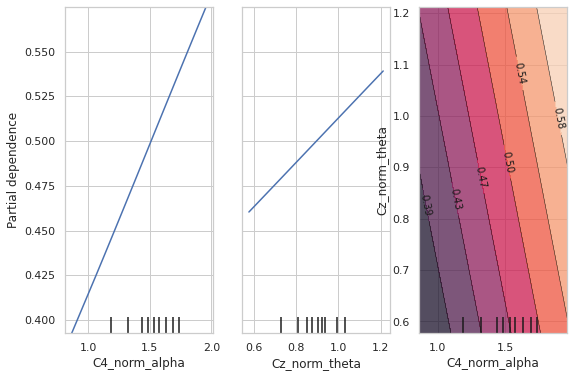

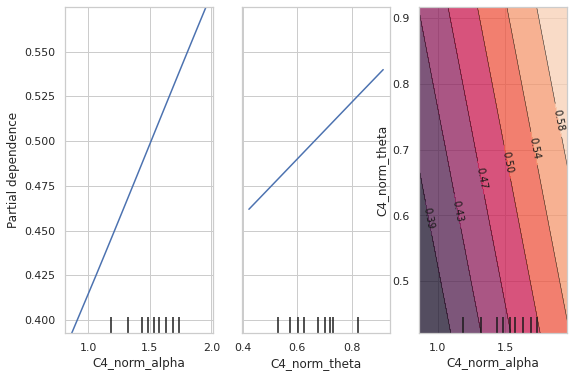

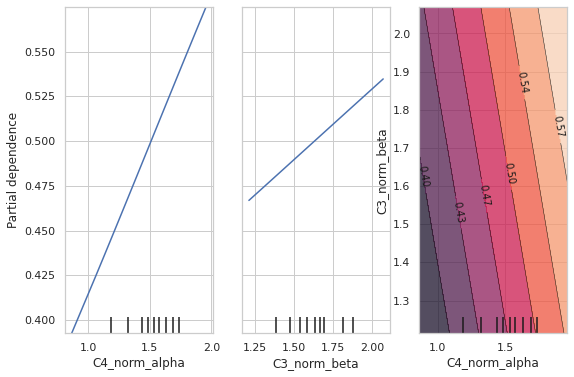

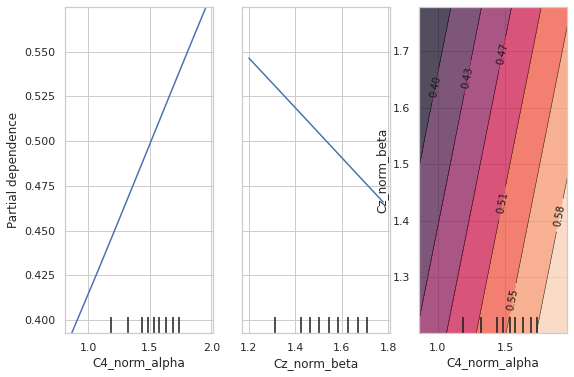

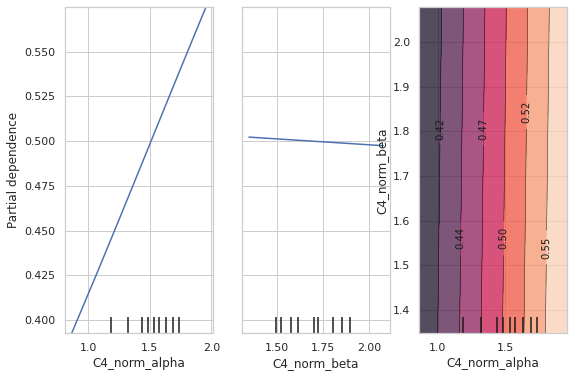

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=2
for i in range(3,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

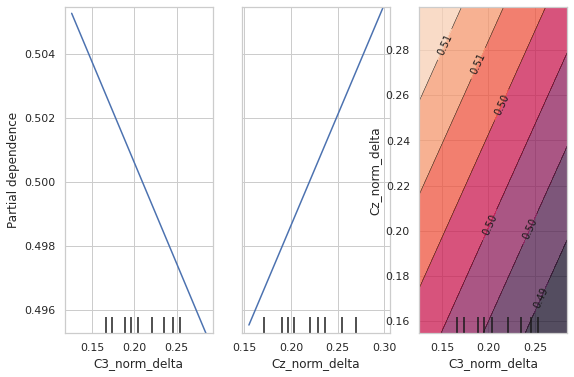

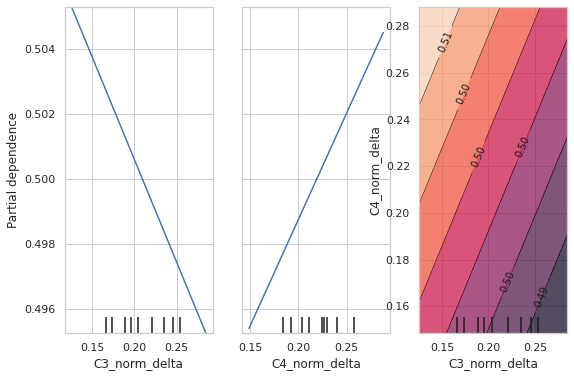

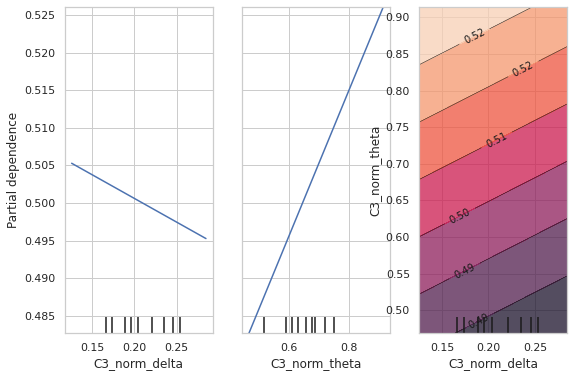

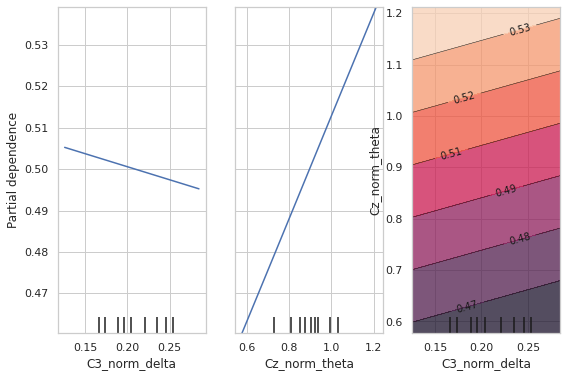

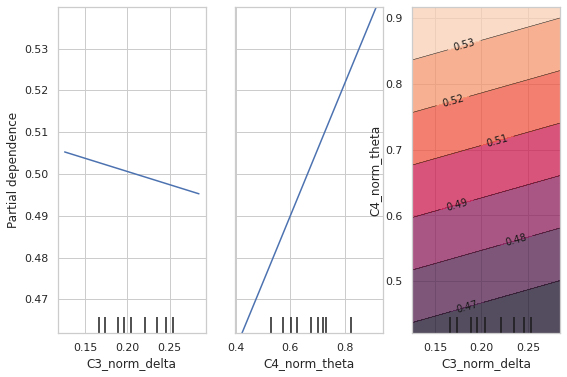

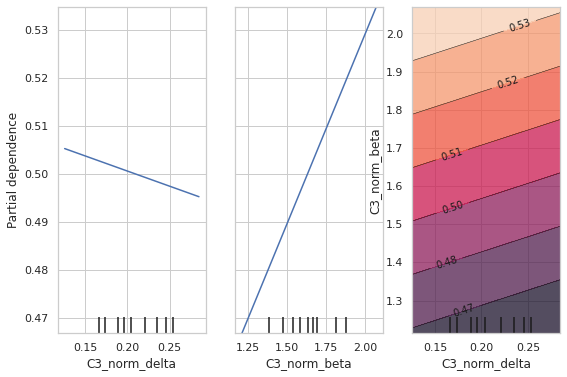

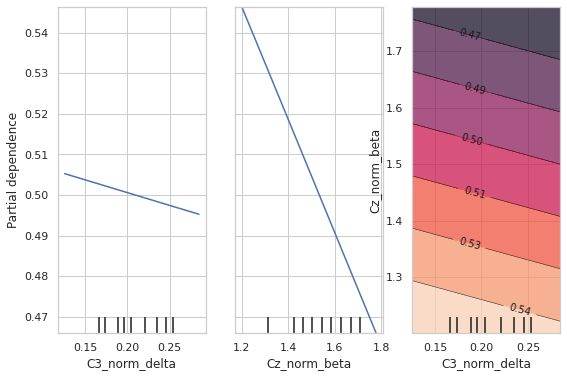

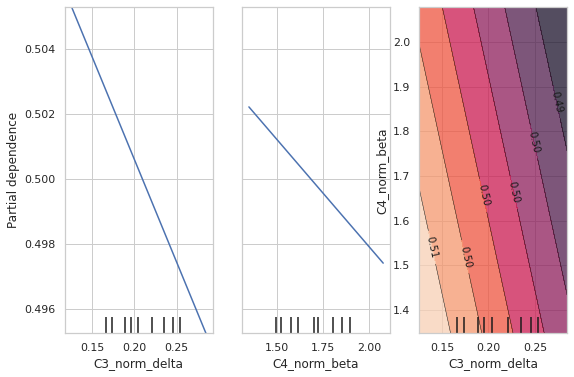

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=3
for i in range(4,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

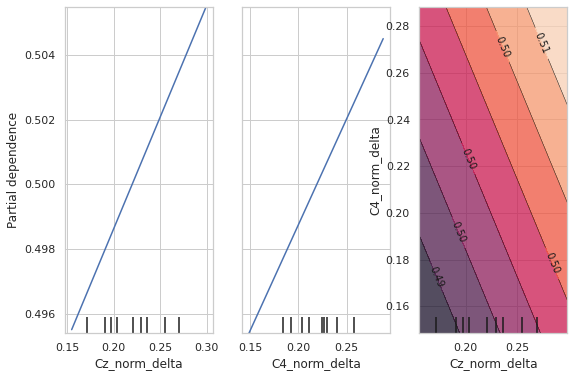

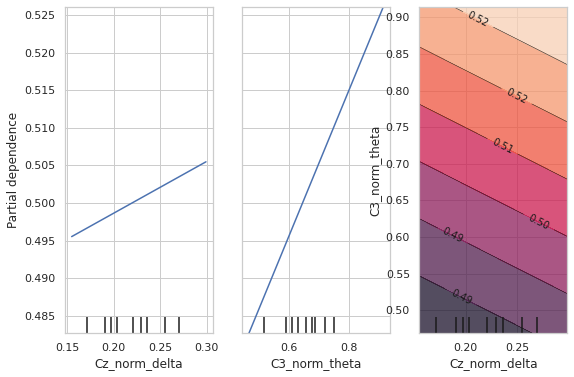

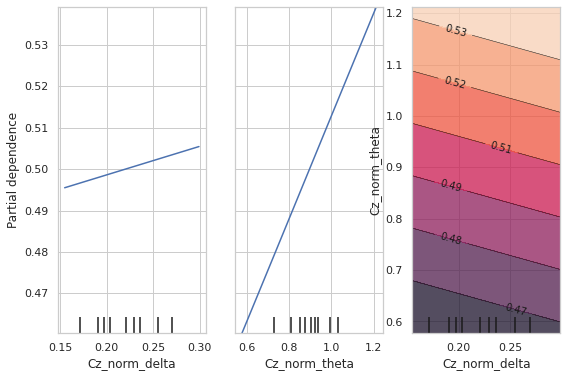

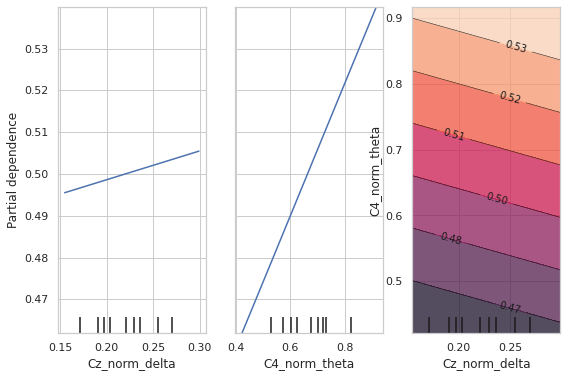

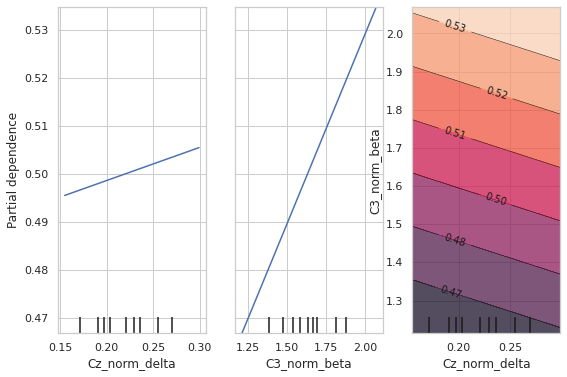

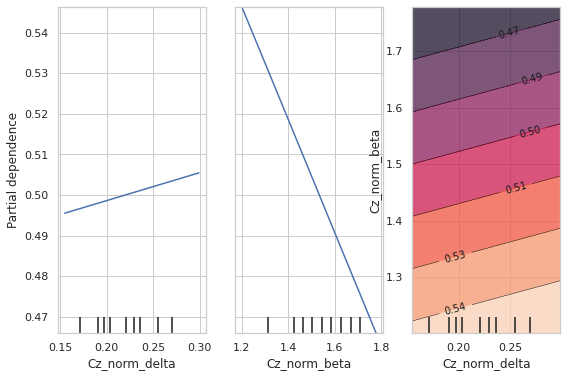

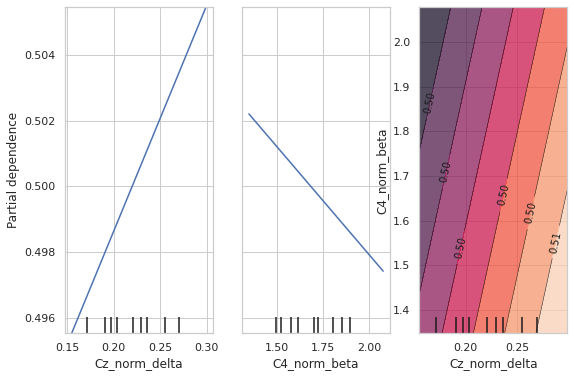

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=4
for i in range(5,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

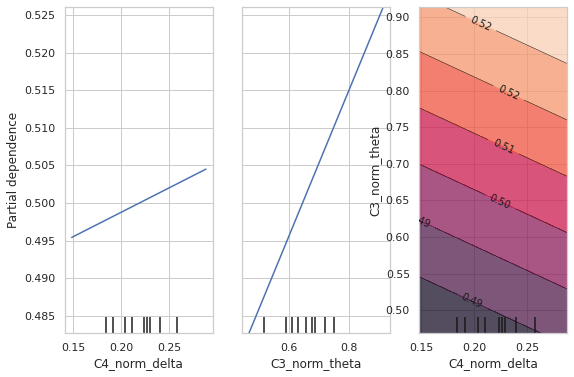

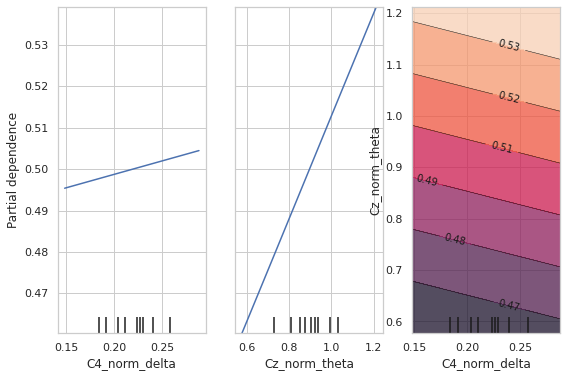

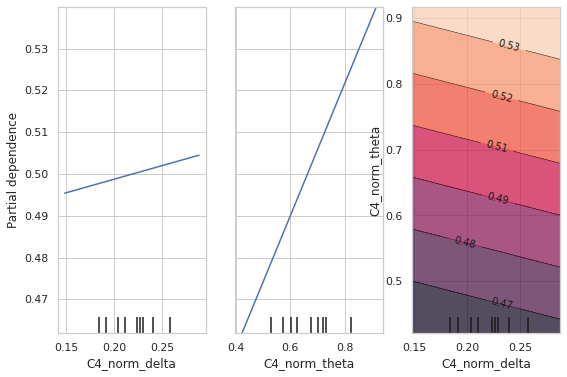

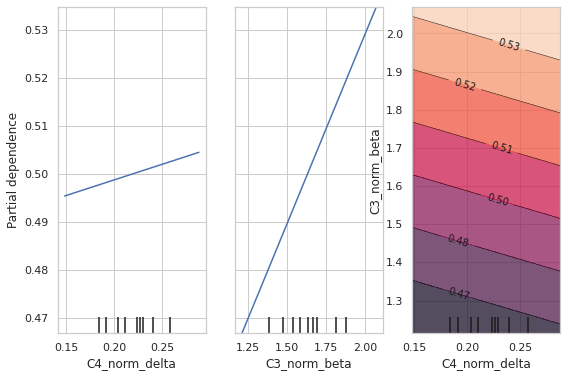

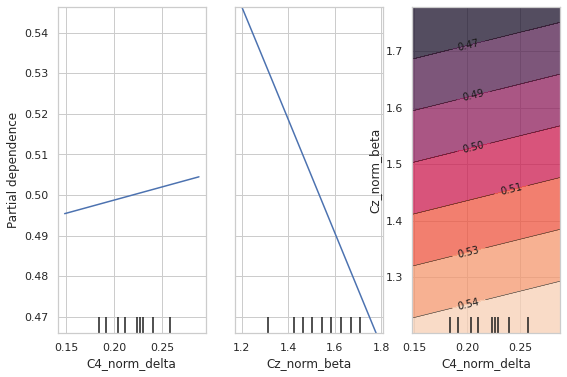

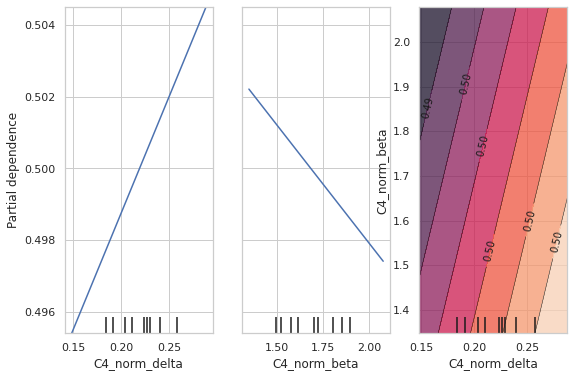

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=5
for i in range(6,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

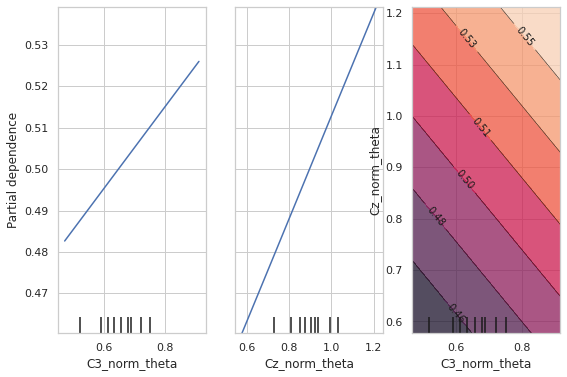

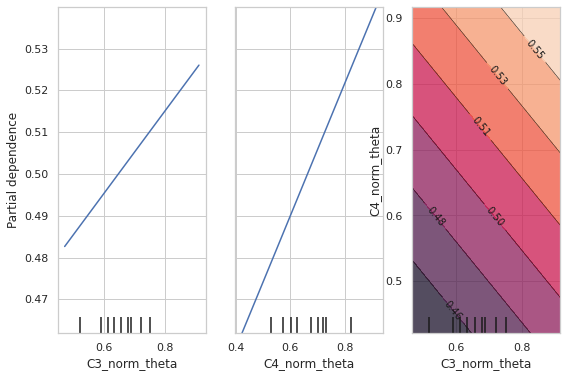

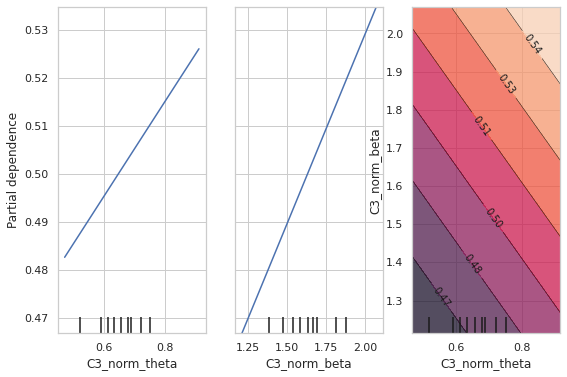

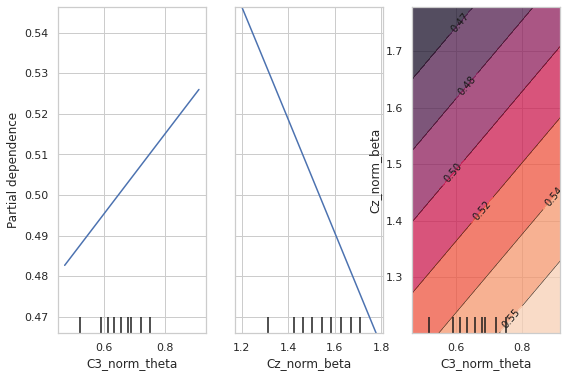

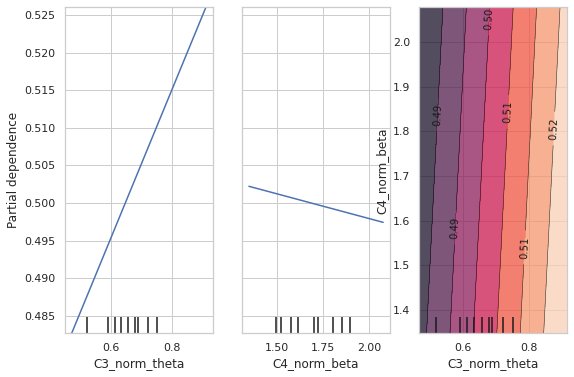

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=6
for i in range(7,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

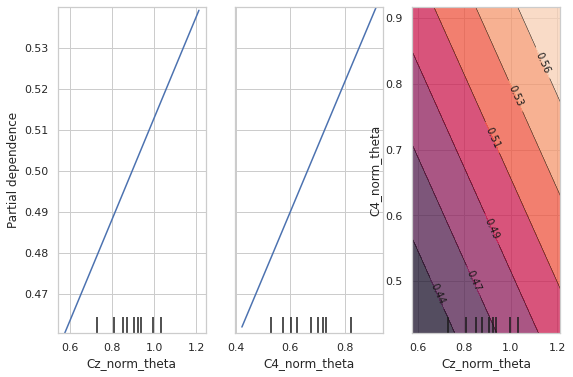

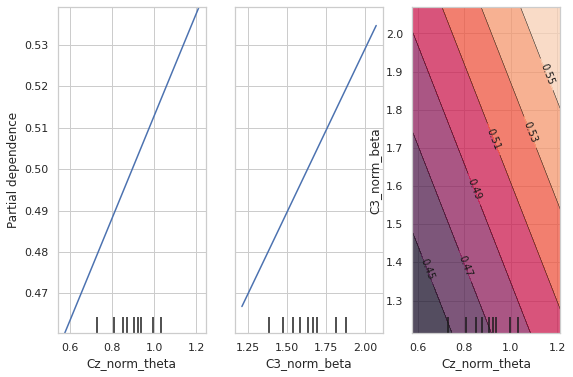

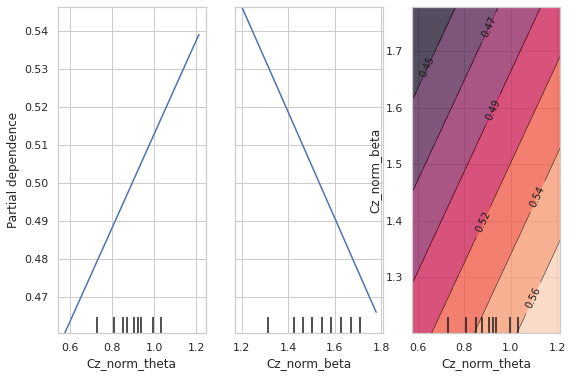

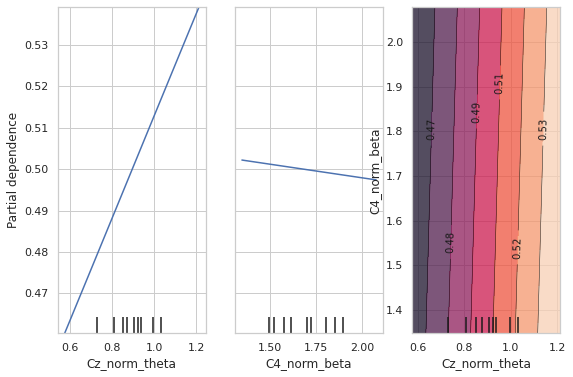

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=7
for i in range(8,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

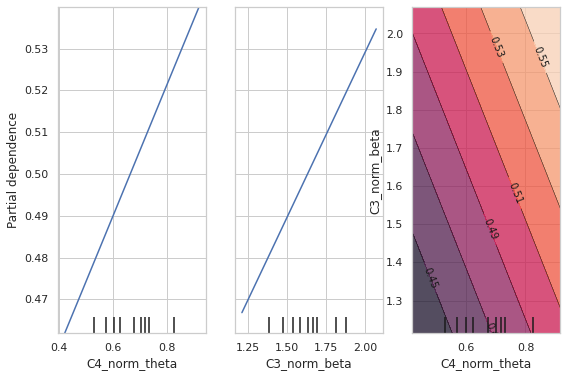

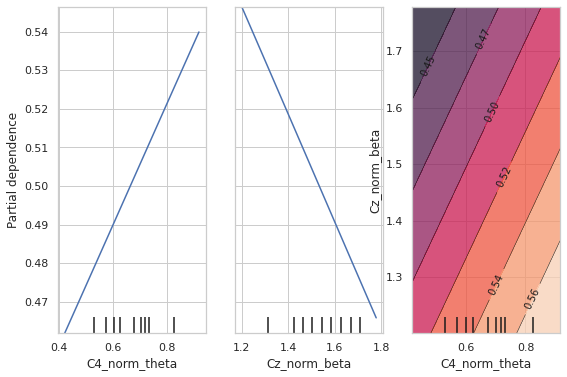

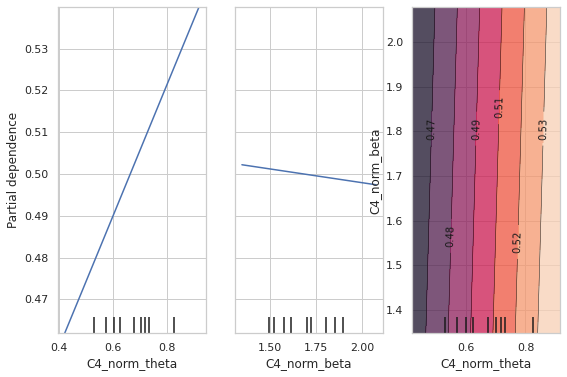

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=8
for i in range(9,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

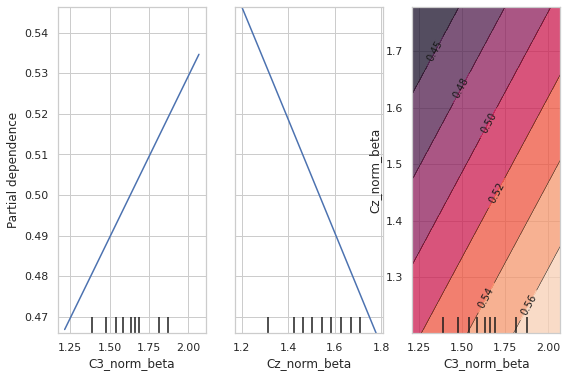

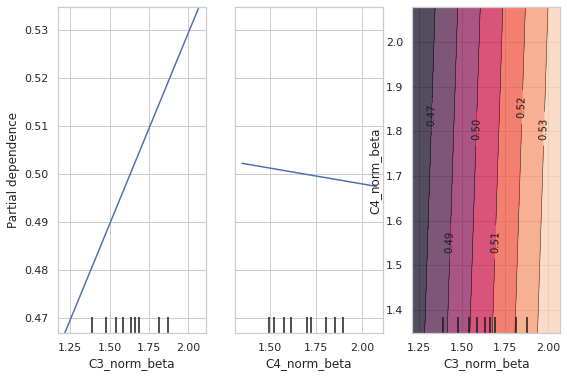

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=9
for i in range(10,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

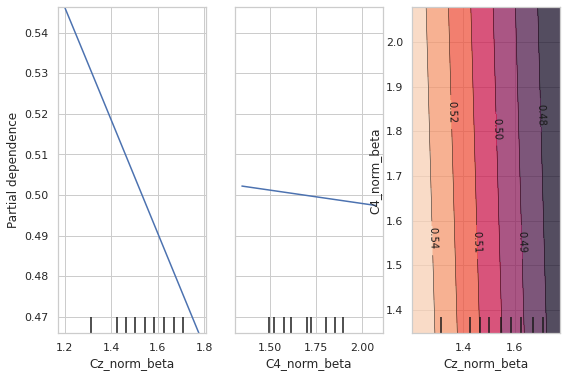

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

j=10
for i in range(11,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(clf_modelo, X_train_df, features)

###Permutation Feature Importance

In [ ]:
from sklearn.inspection import permutation_importance
r = permutation_importance(clf_modelo, X_train_df, y_train_df,
                           n_repeats=30,
                           random_state=0)
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{X_train_df.columns[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")

In [ ]:
r.importances_mean.argsort()[::-1]

array([ 0,  1,  4,  8,  9, 10,  6,  5,  7, 11,  3,  2])

###ICE

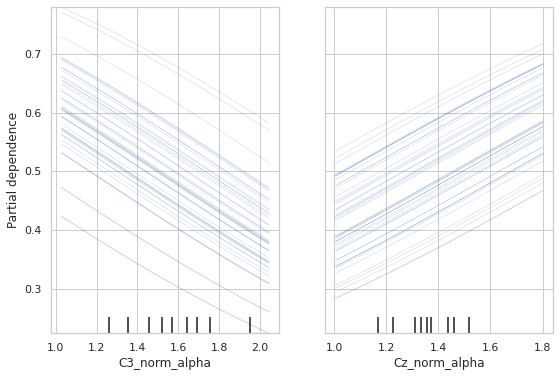

In [ ]:
features = [0, 1]
PartialDependenceDisplay.from_estimator(clf_modelo, x1, features,
    kind='individual')

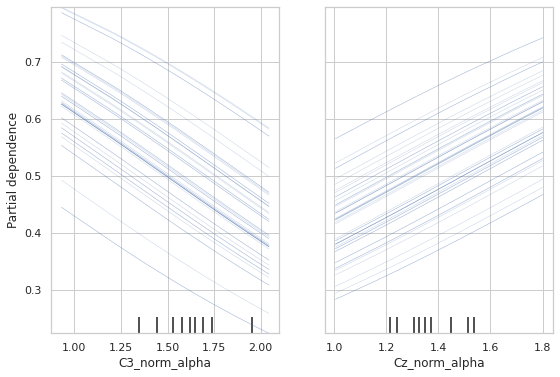

In [ ]:
PartialDependenceDisplay.from_estimator(clf_modelo, x2, features,
    kind='individual')

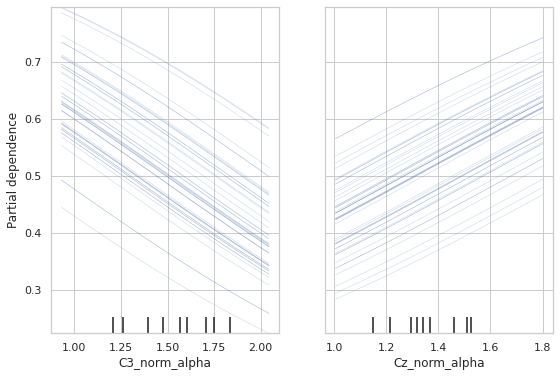

In [ ]:
PartialDependenceDisplay.from_estimator(clf_modelo, x3, features,
    kind='individual')

# Árvore de decisão

In [580]:
#Arvore com algumas especificações
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

#X, y = treino2[sensores], treino2['condition']

#X_test, y_test= teste2[sensores], teste2['condition']

decision_tree = DecisionTreeClassifier(random_state=0, max_depth=2)
decision_tree = decision_tree.fit(X_train_df, y_train_df)
decision_tree.score(X_test_df,y_test_df)

0.5416666666666666

In [581]:
#create a dictionary of all values we want to test
decision_tree = DecisionTreeClassifier()
param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(3, 15)}
# decision tree model = decision_tree
#use gridsearch to test all values
clf_decision_tree = GridSearchCV(decision_tree, param_grid, cv=3)
#fit model to data
clf_decision_tree.fit(X_train_df, y_train_df)
clf_decision_tree.best_params_

{'criterion': 'gini', 'max_depth': 3}

In [582]:
print("tuned hpyerparameters :(best parameters) ",clf_decision_tree.best_params_)
print("accuracy :", clf_decision_tree.best_score_)

tuned hpyerparameters :(best parameters)  {'criterion': 'gini', 'max_depth': 3}
accuracy : 0.5486111111111112


In [583]:
clf_decision_tree.score(X_test_df,y_test_df)

0.5416666666666666

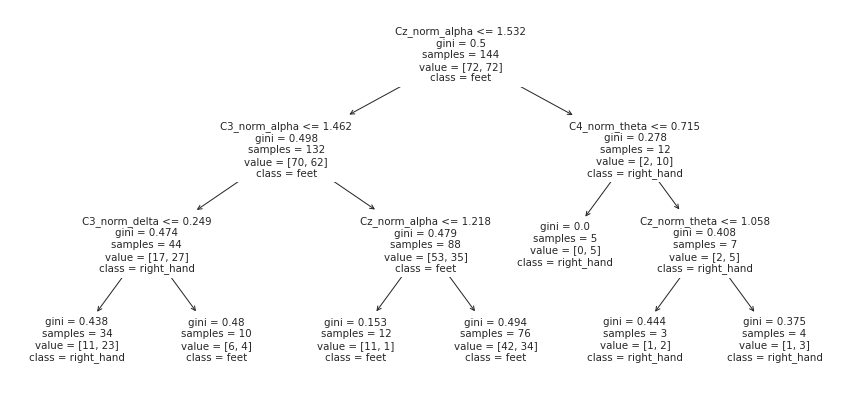

In [584]:
import matplotlib.pyplot as plt
from sklearn import tree

#bands=['alpha','delta','theta','beta']

fig,ax = plt.subplots(1, figsize=(15,7))

tree.plot_tree(clf_decision_tree.best_estimator_,feature_names=bands,class_names=['feet','right_hand'])
plt.show()


###Permutation Feature Importance

In [ ]:
from sklearn.inspection import permutation_importance
r = permutation_importance(clf_decision_tree.best_estimator_, X_train_df, y_train_df,
                           n_repeats=30,
                           random_state=0)
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{X_train_df.columns[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")

C3_norm_alpha0.082 +/- 0.032
Cz_norm_alpha0.061 +/- 0.018


###ICE

In [ ]:
x1=X_train_df[0:48]
x2=X_train_df[48:96]
x3=X_train_df[96:]

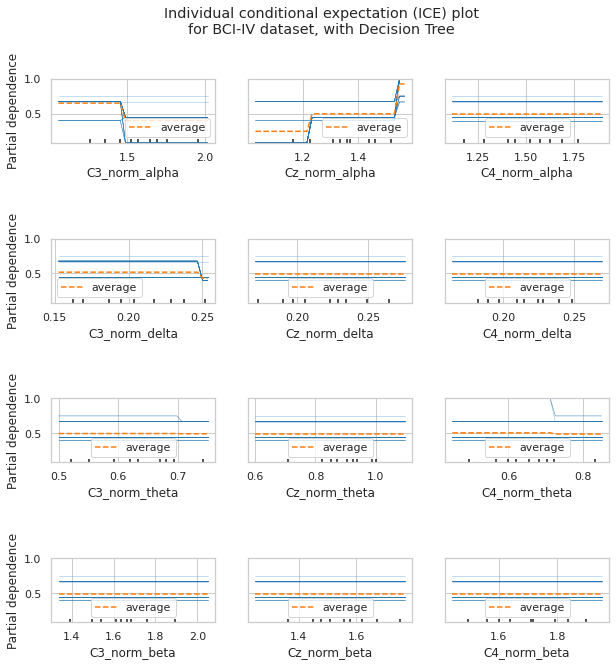

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_decision_tree,
    x1,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Decision Tree"
)
display.figure_.subplots_adjust(hspace=1.5)

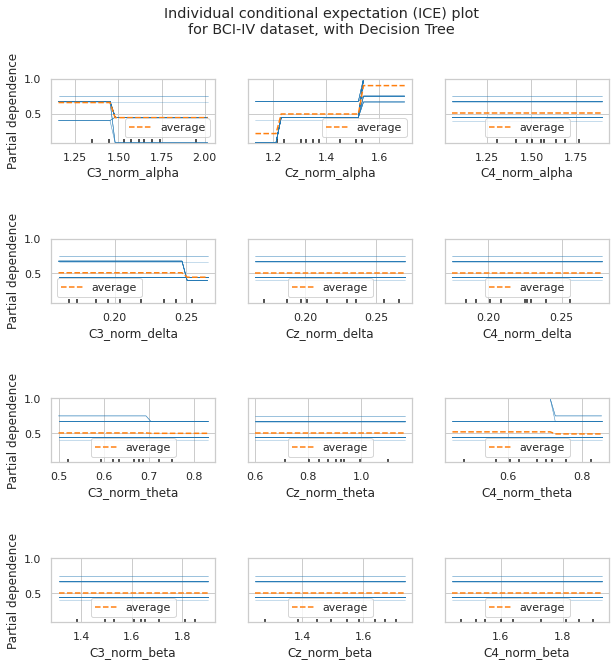

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_decision_tree,
    x2,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Decision Tree"
)
display.figure_.subplots_adjust(hspace=1.5)

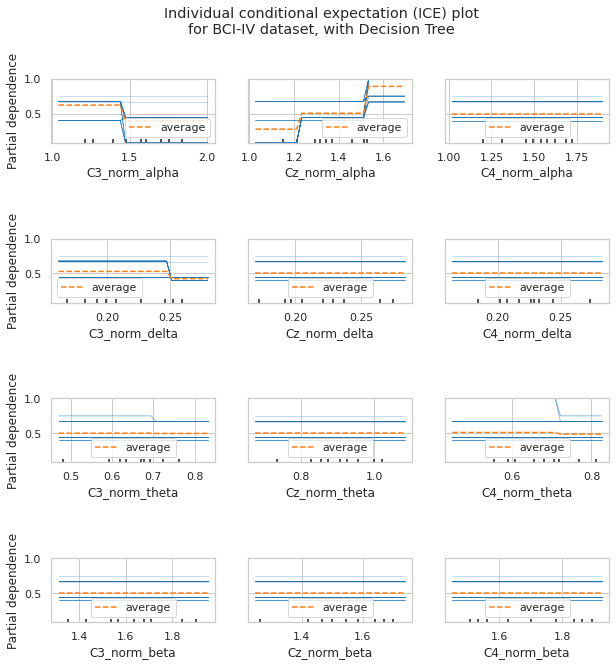

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_decision_tree,
    x3,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Decision Tree"
)
display.figure_.subplots_adjust(hspace=1.5)

# Regra de decisão

###OneR

In [ ]:
!pip install mlrose

In [ ]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
import mlrose

In [ ]:
!pip install mlxtend --upgrade --no-deps

     |████████████████████████████████| 1.3 MB 6.6 MB/s 
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.14.0
    Uninstalling mlxtend-0.14.0:
      Successfully uninstalled mlxtend-0.14.0


In [ ]:
from mlxtend.classifier import OneRClassifier

oner = OneRClassifier()

oner.fit(X_train_list, y_train_list)
oner.score(X_test_list,y_test_list)

0.5

In [ ]:
oner.score(X_train_list,y_train_list)

0.6875

PDP

Não tem classe (apenas array)

Permutation Feature Importance

In [ ]:
from sklearn.inspection import permutation_importance
r = permutation_importance(oner, X_train_list, y_train_list,
                           n_repeats=30,
                           random_state=0)
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{X_train_df.columns[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")

C3_norm_alpha0.182 +/- 0.043


ICE

### Boosted Rule List


In [ ]:
!pip install imodels

In [ ]:
from imodels import BoostedRulesClassifier, FIGSClassifier, SkopeRulesClassifier
from imodels import RuleFitRegressor, HSTreeRegressorCV, SLIMRegressor

model_rule = BoostedRulesClassifier()  # initialize a model
model_rule.fit(X_train_df, y_train_df.astype('category').cat.codes, feature_names=bands)   # fit model
preds = model_rule.predict(X_test_df) # predictions: shape is (n_test, 1)
preds_proba = model_rule.predict_proba(X_test_df) # predicted probabilities: shape is (n_test, n_classes)
print(model_rule) # print the rule-based model

BoostedRules:
Rule → predicted probability (final prediction is weighted sum of all predictions)
  If Cz_norm_alpha <= 1.53194 → 0.08 (weight: 0.11)
  If Cz_norm_alpha > 1.53194 → 0.88 (weight: 0.20)
  If C3_norm_delta <= 0.25302 → 0.72 (weight: 0.15)
  If C3_norm_delta > 0.25302 → 0.41 (weight: 0.20)
  If Cz_norm_delta <= 0.19669 → 0.03 (weight: 0.13)
  If Cz_norm_delta > 0.19669 → 0.78 (weight: 0.15)
  If Cz_norm_alpha <= 1.3673 → 0.27 (weight: 0.14)
  If Cz_norm_alpha > 1.3673 → 0.83 (weight: 0.14)
  If Cz_norm_beta <= 1.24152 → 0.03 (weight: 0.10)
  If Cz_norm_beta > 1.24152 → 0.94 (weight: 0.08)



In [551]:
model_rule.score(X_train_df,y_train_df.astype('category').cat.codes)

0.6527777777777778

In [550]:
model_rule.score(X_test_df,y_test_df.astype('category').cat.codes)

0.5208333333333334

###PDP

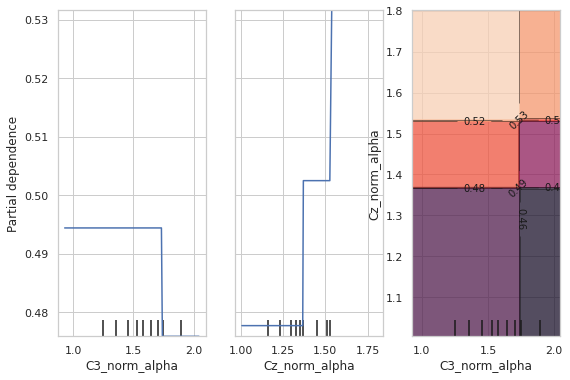

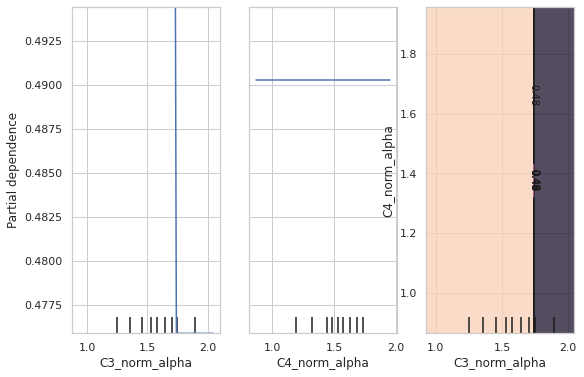

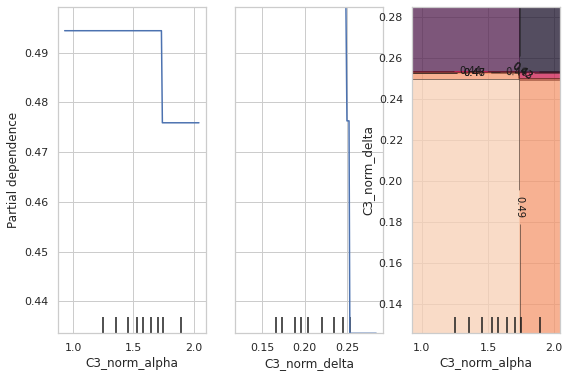

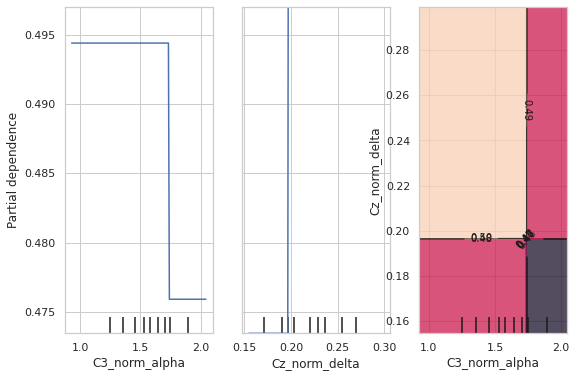

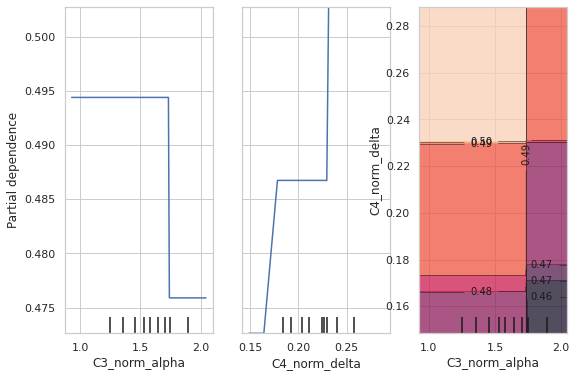

...

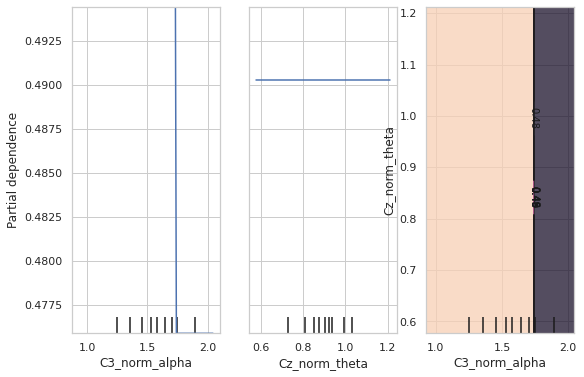

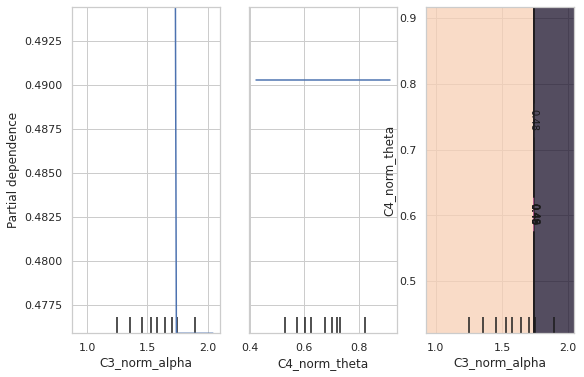

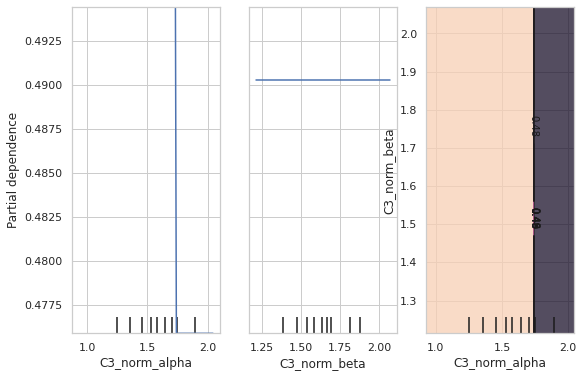

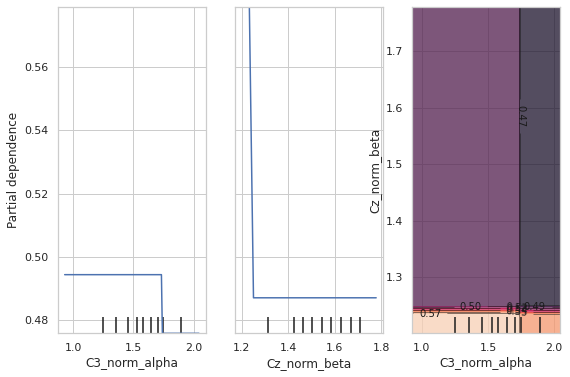

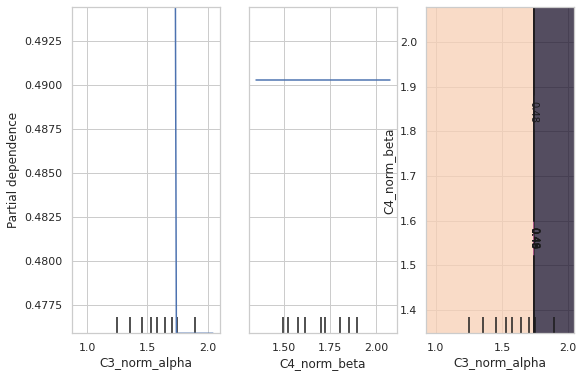

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=0
for i in range(1,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

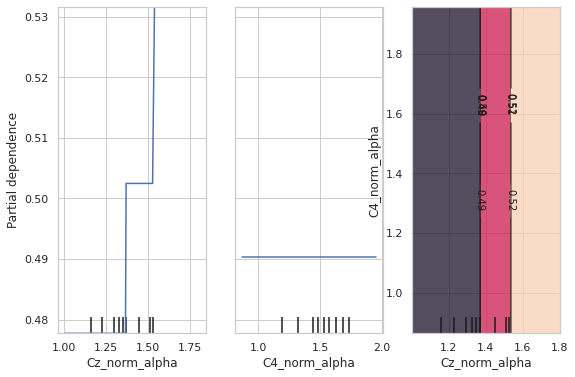

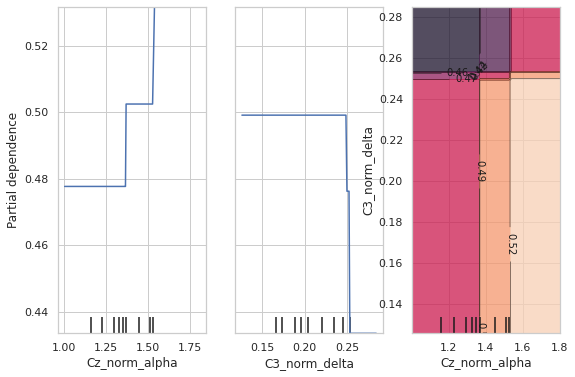

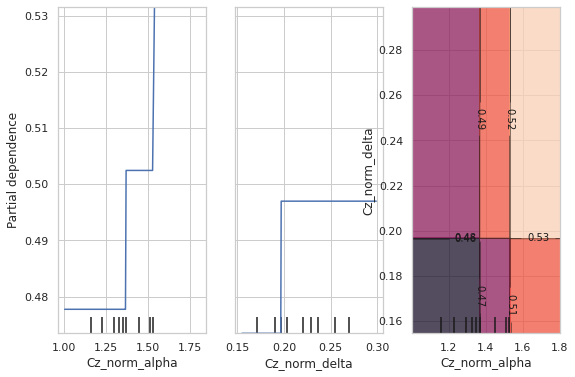

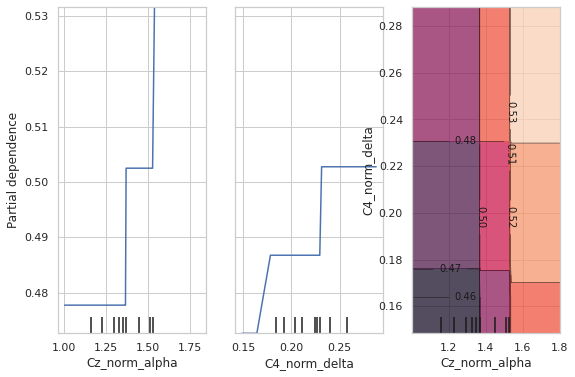

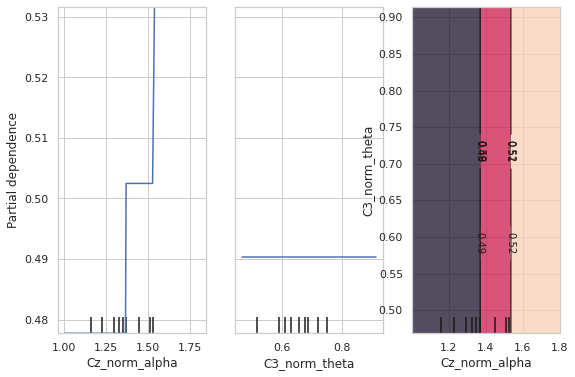

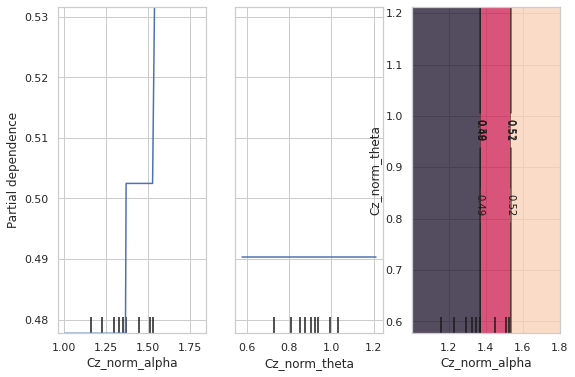

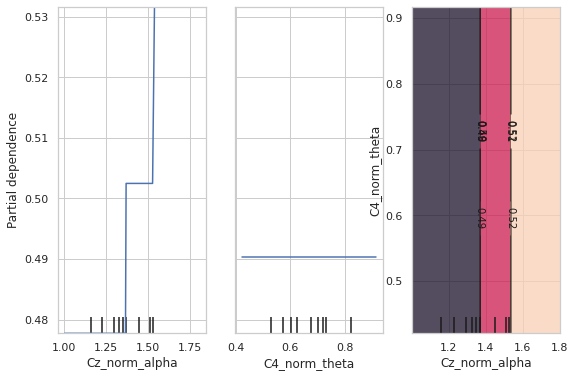

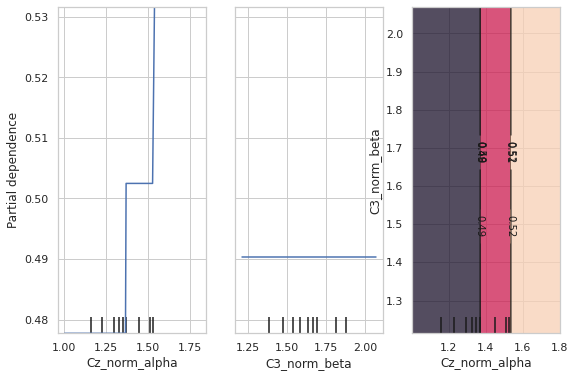

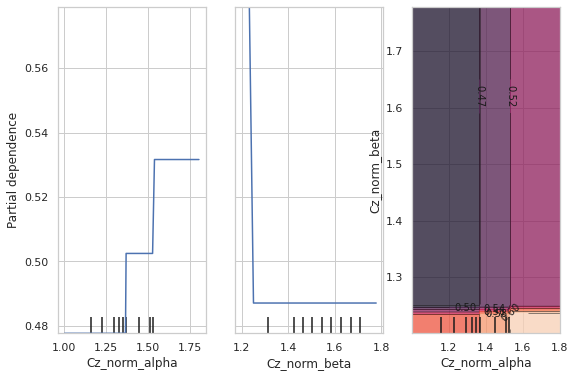

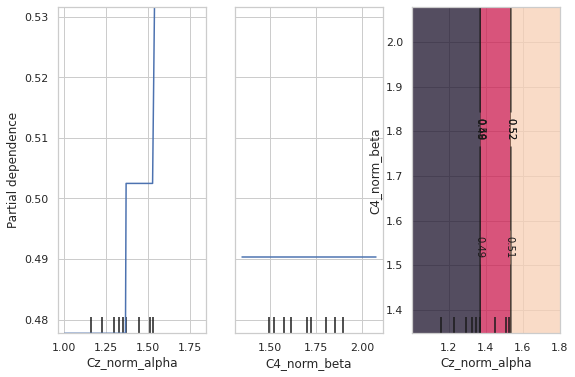

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=1
for i in range(2,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

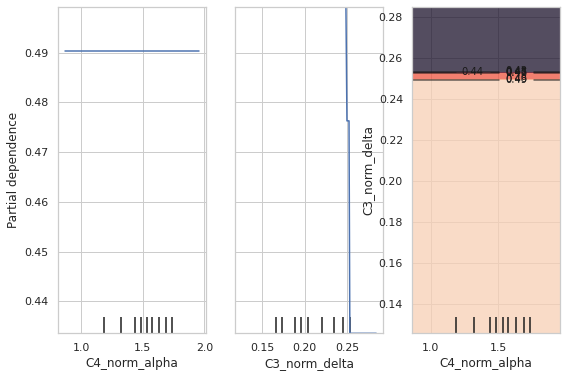

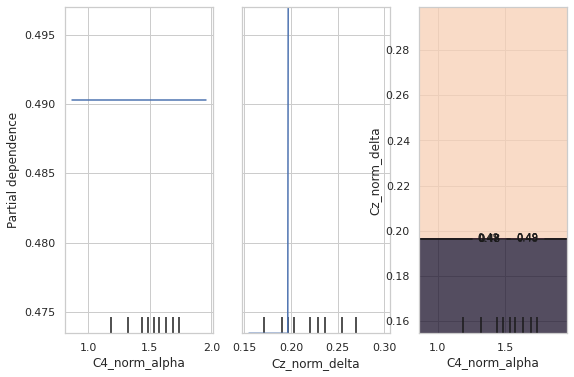

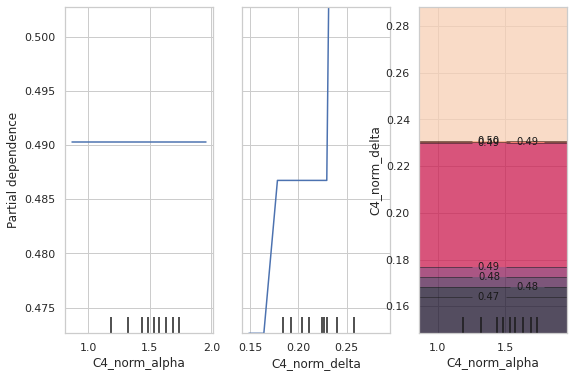

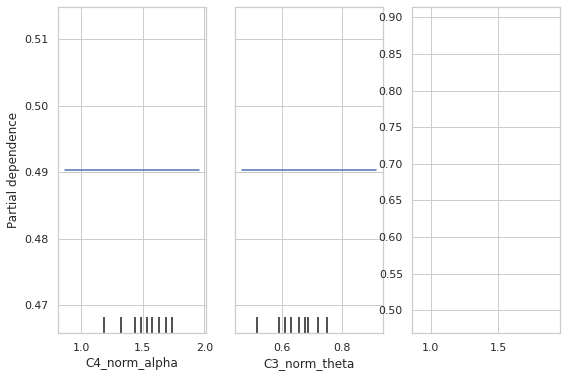

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=2
for i in range(3,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

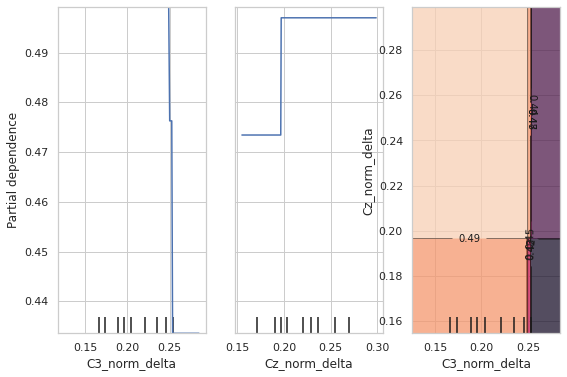

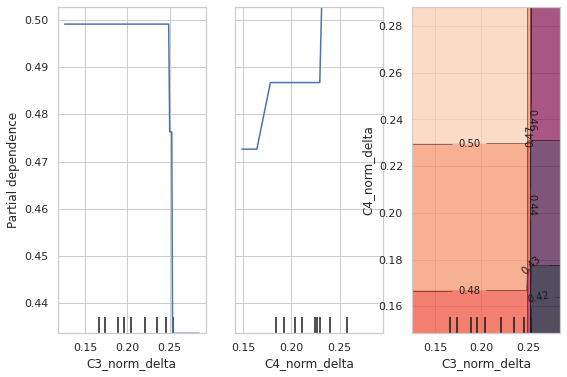

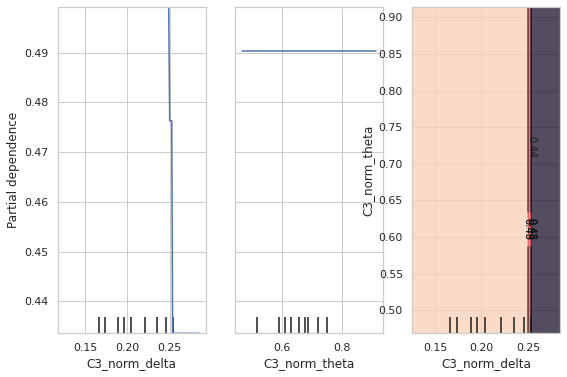

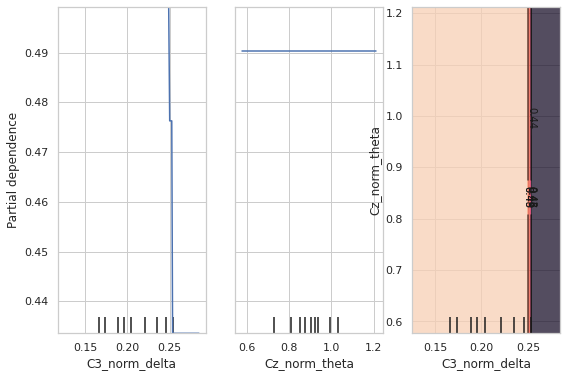

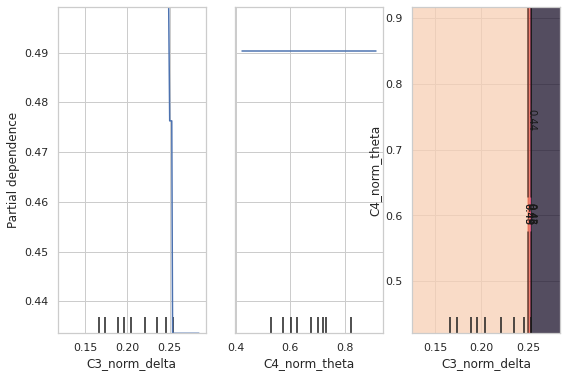

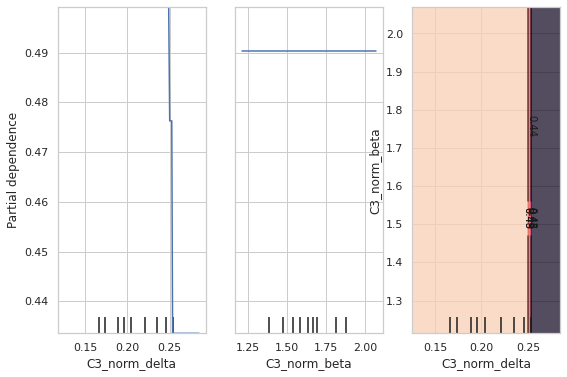

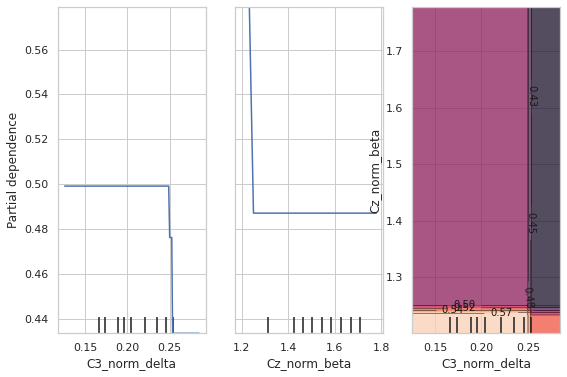

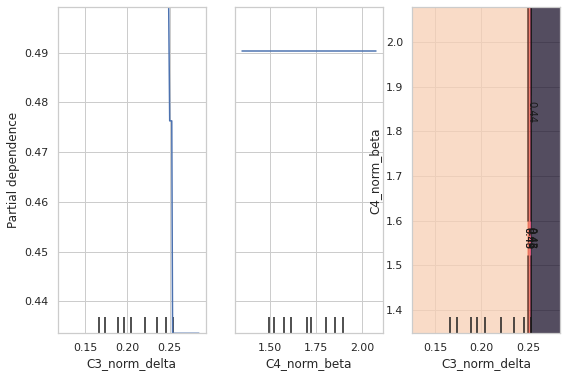

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=3
for i in range(4,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

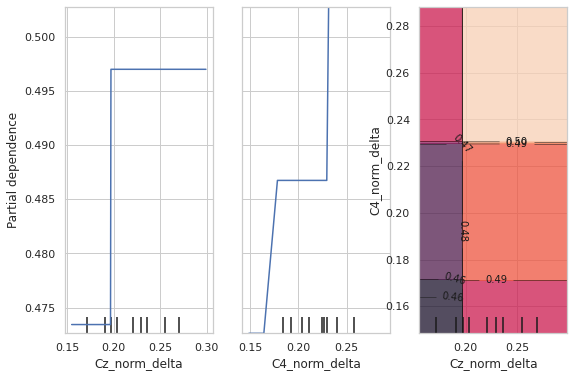

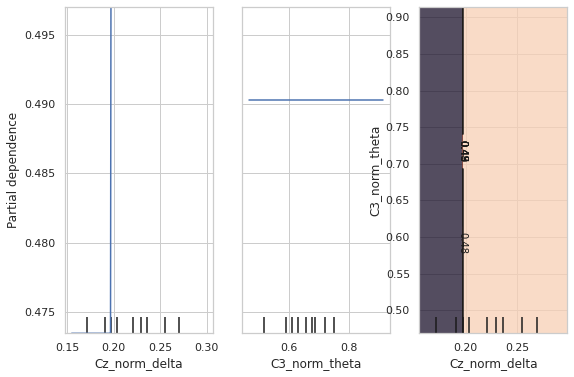

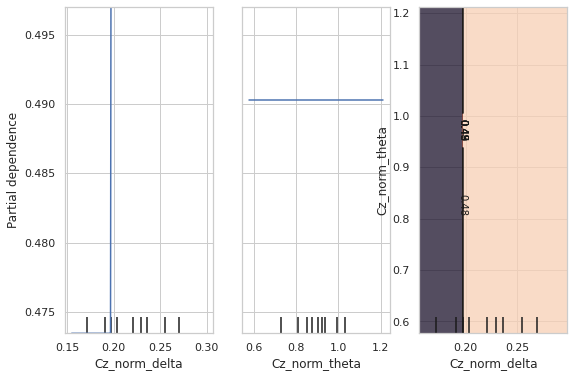

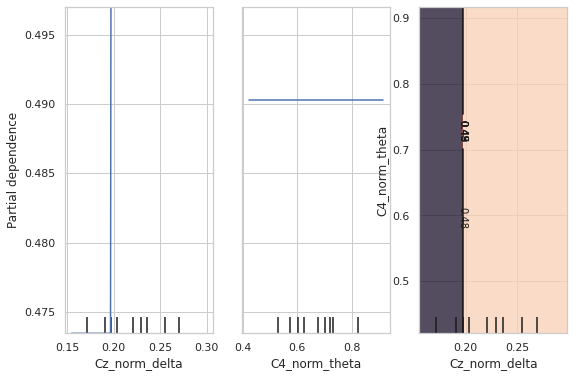

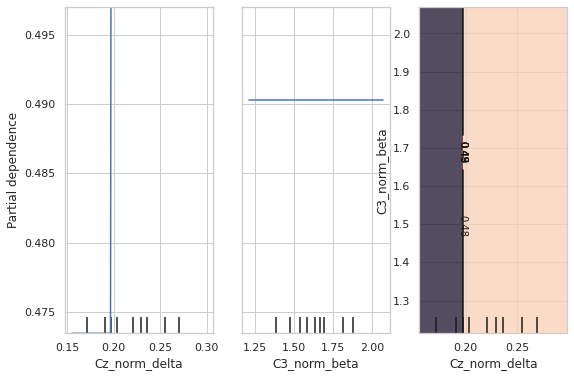

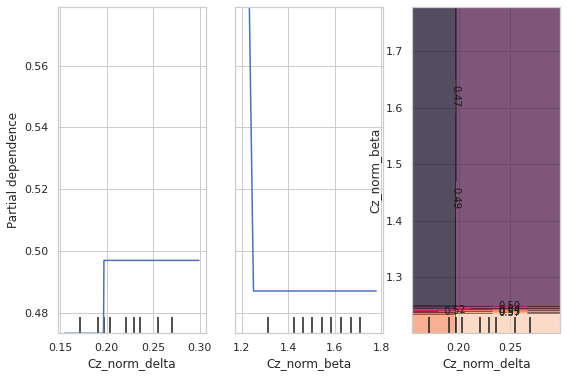

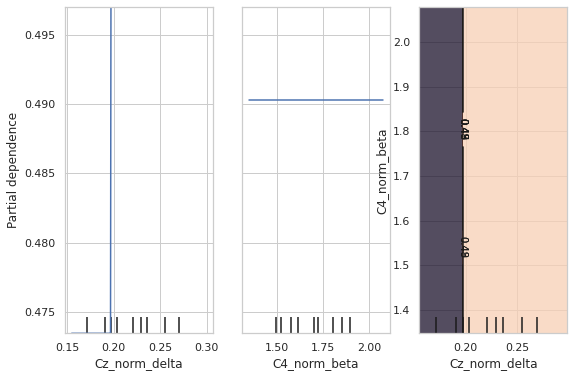

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=4
for i in range(5,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

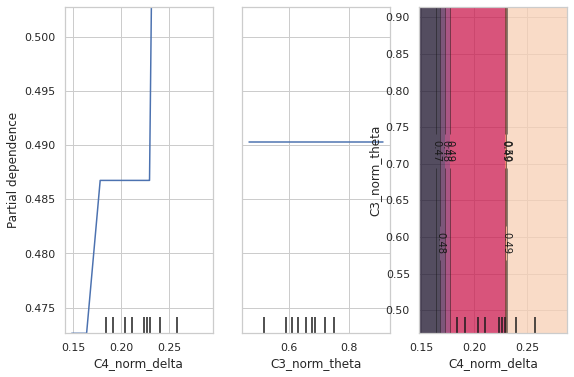

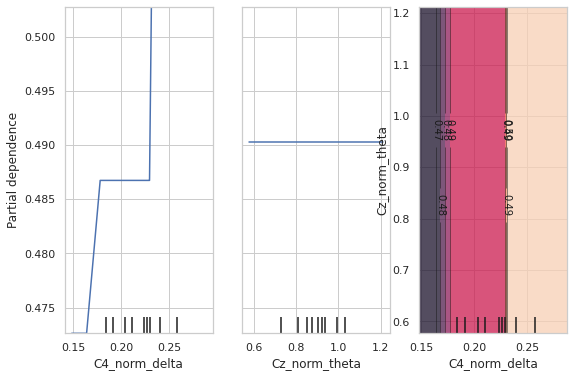

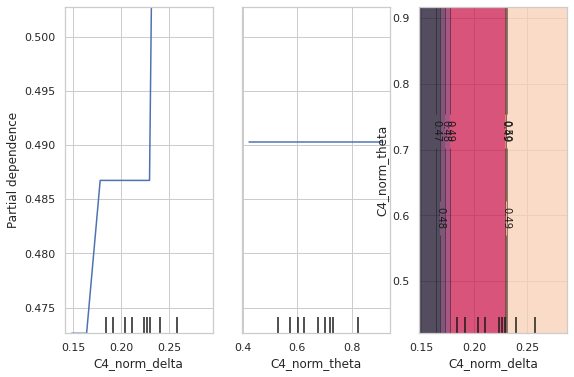

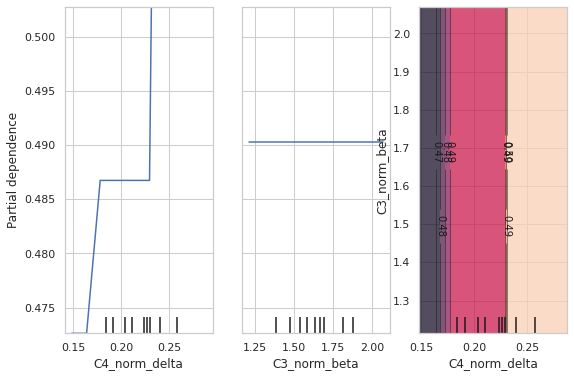

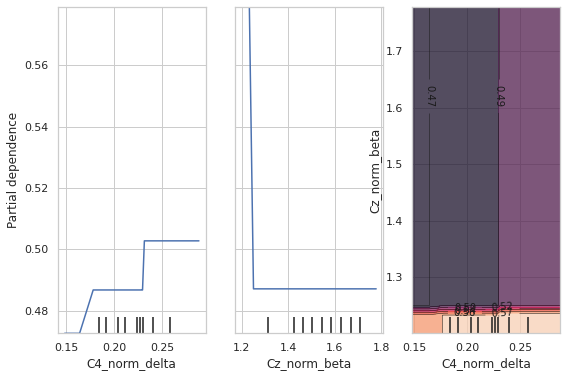

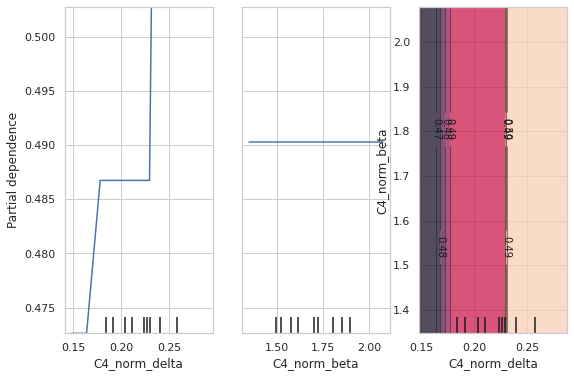

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=5
for i in range(6,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

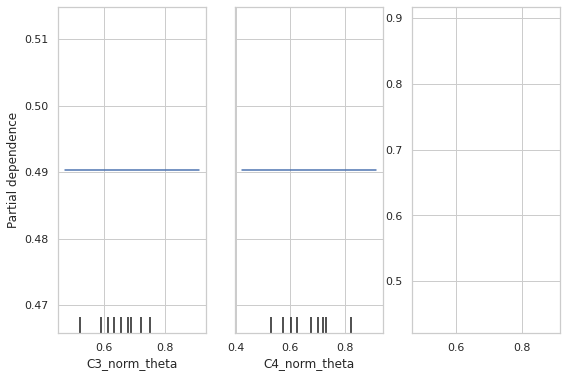

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=6
for i in range(8,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

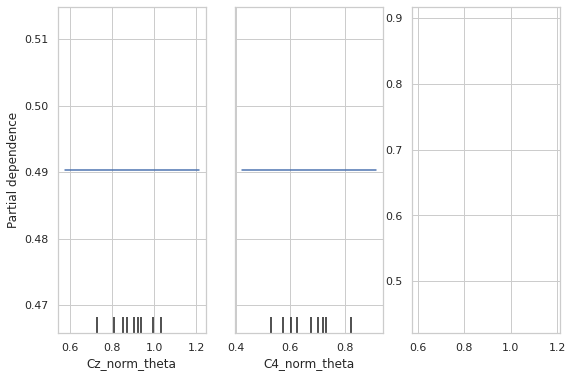

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=7
for i in range(8,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

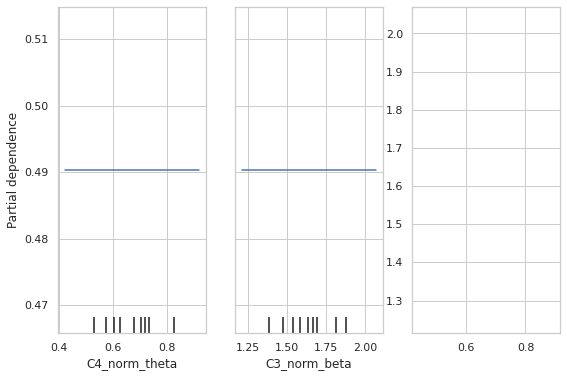

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=8
for i in range(9,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.49029818362607913 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

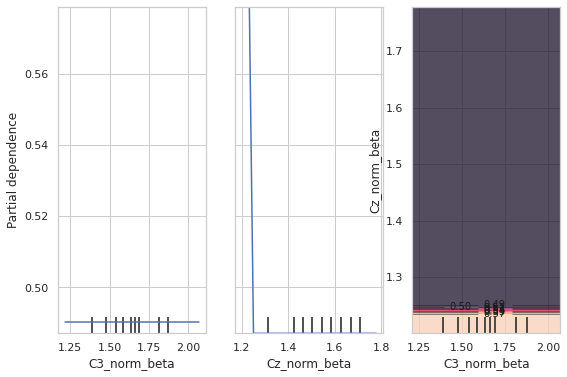

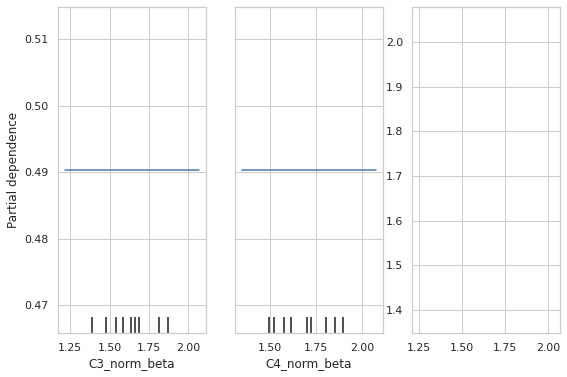

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=9
for i in range(10,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

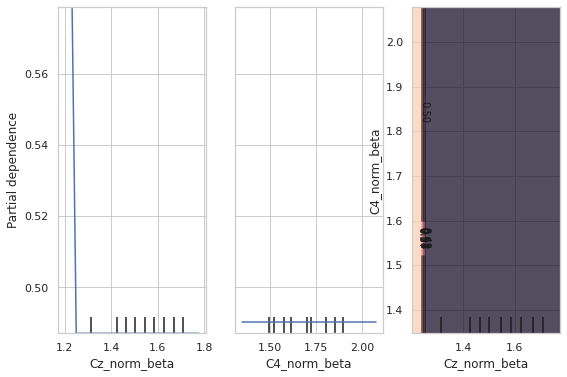

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=10
for i in range(11,12):
  features = [j,i, (j,i)]
  PartialDependenceDisplay.from_estimator(model_rule, X_train_df, features)

Permutation Feature Importance


In [ ]:
from sklearn.inspection import permutation_importance
r = permutation_importance(model_rule, X_train_df, y_train_df.astype('category').cat.codes,
                           n_repeats=30,
                           random_state=0)
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{X_train_df.columns[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")

###ICE


In [ ]:
x1=X_train_df[0:48]
x2=X_train_df[48:96]
x3=X_train_df[96:]

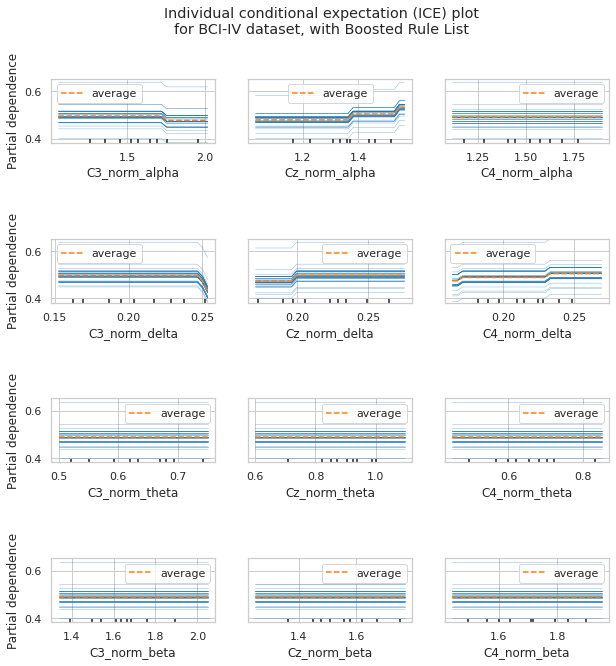

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    model_rule,
    x1,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Boosted Rule List"
)
display.figure_.subplots_adjust(hspace=1.5)

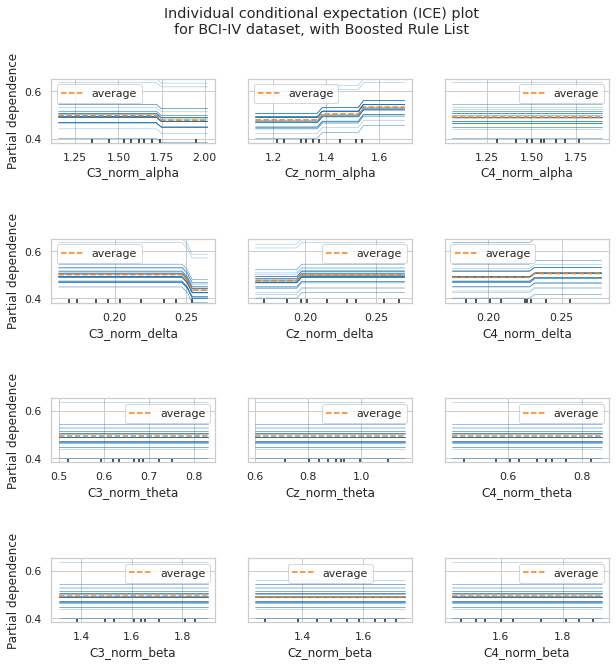

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    model_rule,
    x2,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Boosted Rule List"
)
display.figure_.subplots_adjust(hspace=1.5)

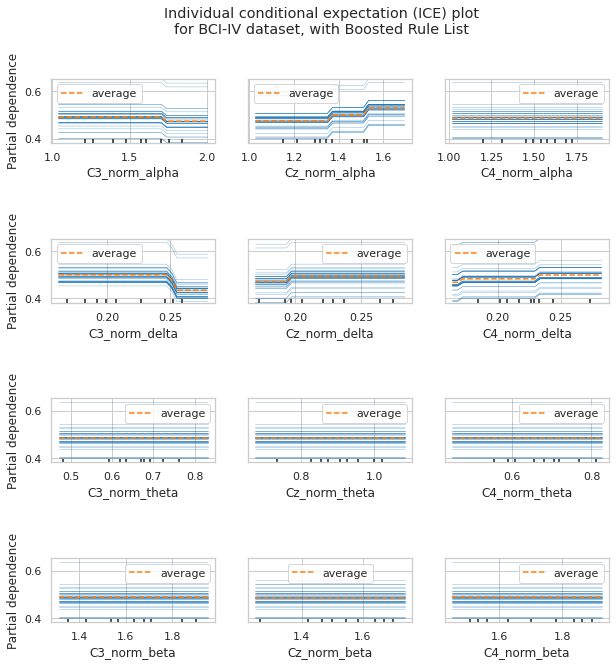

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    model_rule,
    x3,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Boosted Rule List"
)
display.figure_.subplots_adjust(hspace=1.5)

# Gradient Boosting


In [ ]:
# gradient boosting for classification in scikit-learn
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from matplotlib import pyplot

# evaluate the model
model = GradientBoostingClassifier()
cv = RepeatedStratifiedKFold(n_splits=18)
n_scores = cross_val_score(model, X_train_df, y_train_df, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))
# fit the model on the whole dataset
model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
    max_depth=1, random_state=0)
model.fit(X_train_df, y_train_df)
model.score(X_test_df,y_test_df)

Accuracy: 0.442 (0.154)


0.5555555555555556

In [ ]:
model.score(X_train_df,y_train_df)

0.6875

In [ ]:
parameters = {
    "loss":["deviance"],
    "learning_rate": [0.1, 0.15, 0.2],
    "min_samples_split": np.linspace(0.1, 0.5, 12),
    "min_samples_leaf": np.linspace(0.1, 0.5, 12),
    "max_depth":[3,5],
    "max_features":["log2","sqrt"],
    "criterion": ["friedman_mse",  "mae"],
    #"subsample":[0.5, 0.8, 0.85, 0.9, 1.0],
    "n_estimators":[10]
    }
clf_model = GridSearchCV(model, parameters, cv=10, n_jobs=-1)
clf_model.fit(X_train_df,y_train_df.astype('category').cat.codes)
print(clf_model.score(X_train_df,y_train_df.astype('category').cat.codes))
print(clf_model.best_params_)

0.5902777777777778
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 0.390909090909091, 'min_samples_split': 0.1, 'n_estimators': 10}


In [ ]:
print("tuned hpyerparameters :(best parameters) ",clf_model.best_params_)
print("accuracy :",clf_model.best_score_)

tuned hpyerparameters :(best parameters)  {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 0.390909090909091, 'min_samples_split': 0.1, 'n_estimators': 10}
accuracy : 0.5276190476190477


In [ ]:
print(clf_model.score(X_test_df,y_test_df.astype('category').cat.codes))

0.4583333333333333


Lista

In [ ]:
clf_model_list = GridSearchCV(model, parameters, cv=10, n_jobs=-1)
clf_model_list.fit(X_train_list,y_train_list)
print(clf_model_list.score(X_train_list,y_train_list))
print(clf_model_list.best_params_)

0.5902777777777778
{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 0.390909090909091, 'min_samples_split': 0.1, 'n_estimators': 10}


In [ ]:
print("tuned hpyerparameters :(best parameters) ",clf_model_list.best_params_)
print("accuracy :",clf_model_list.best_score_)

tuned hpyerparameters :(best parameters)  {'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'deviance', 'max_depth': 3, 'max_features': 'log2', 'min_samples_leaf': 0.390909090909091, 'min_samples_split': 0.1, 'n_estimators': 10}
accuracy : 0.5276190476190477


In [ ]:
print(clf_model_list.best_estimator_.score(X_test_list,y_test_list))

0.4583333333333333


###PDP

Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

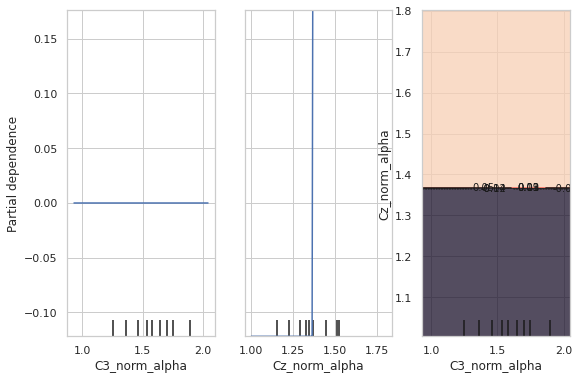

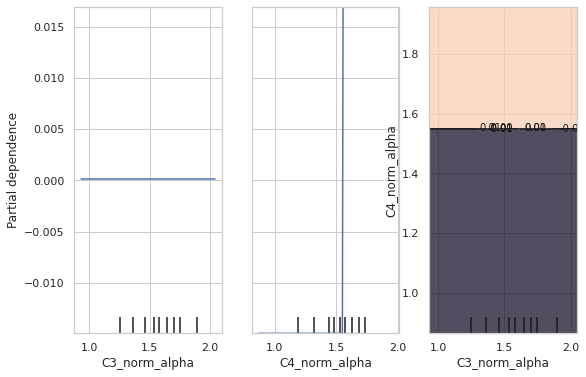

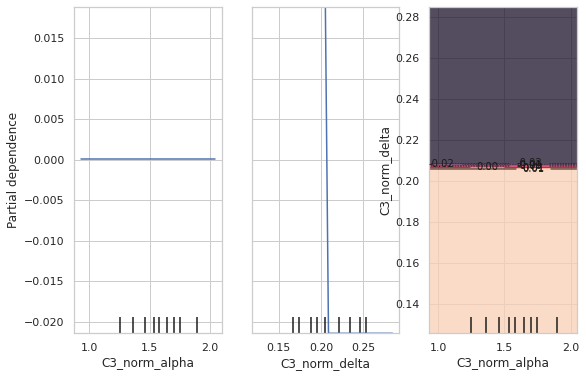

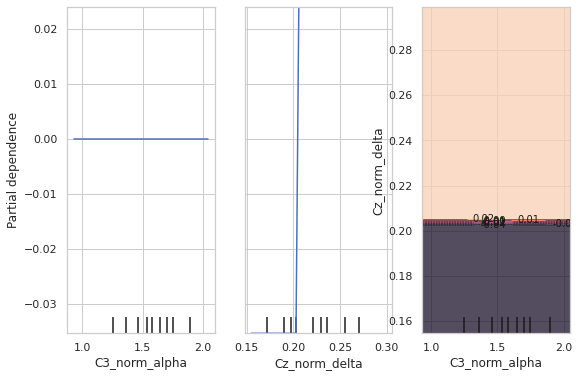

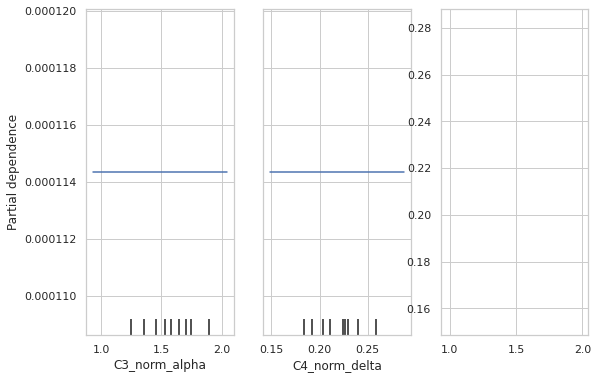

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=0
for i in range(1,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)


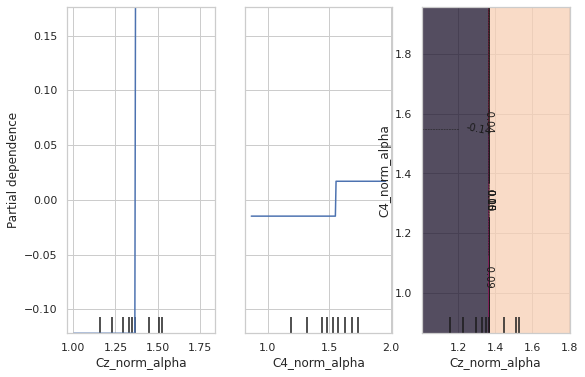

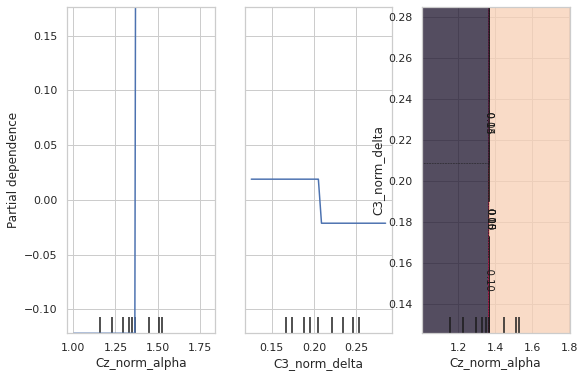

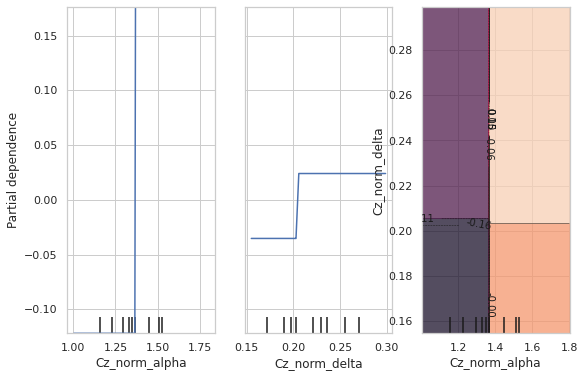

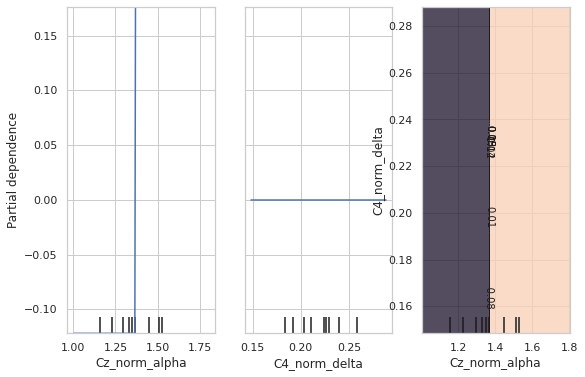

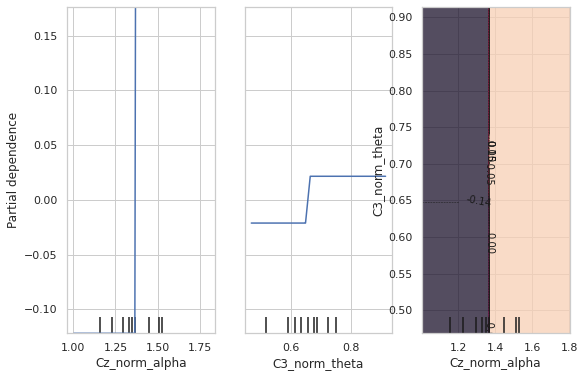

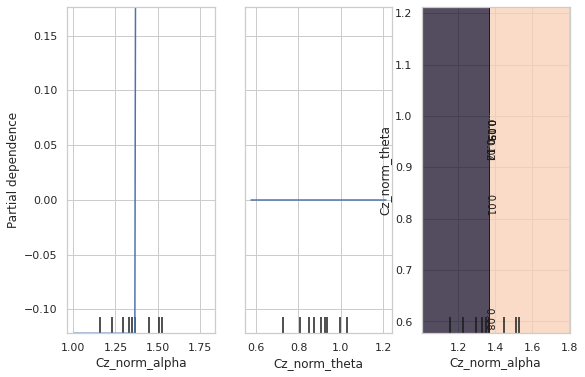

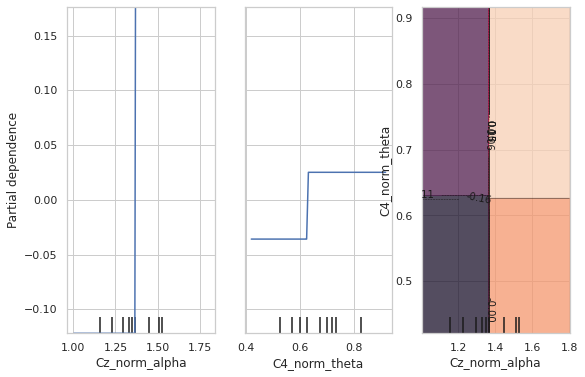

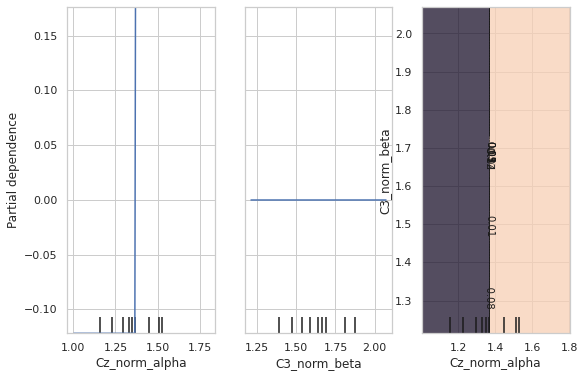

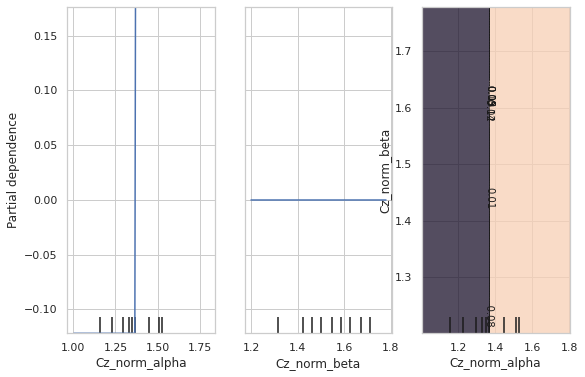

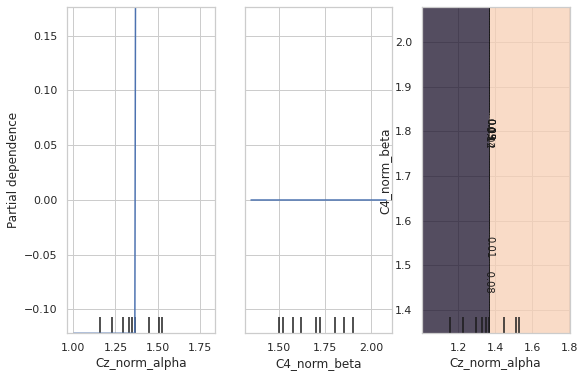

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=1
for i in range(2,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

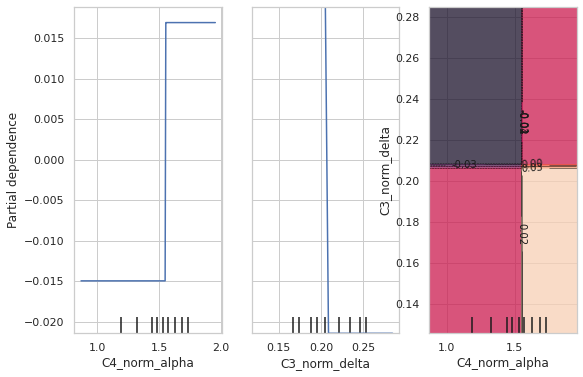

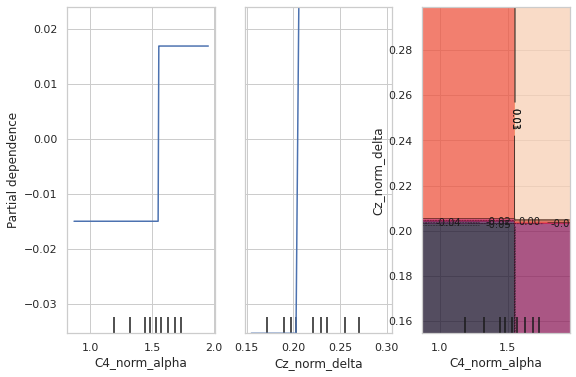

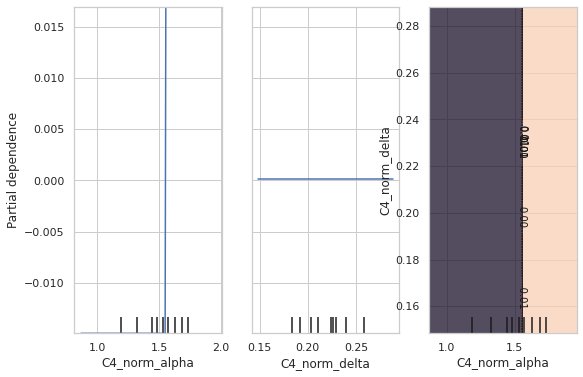

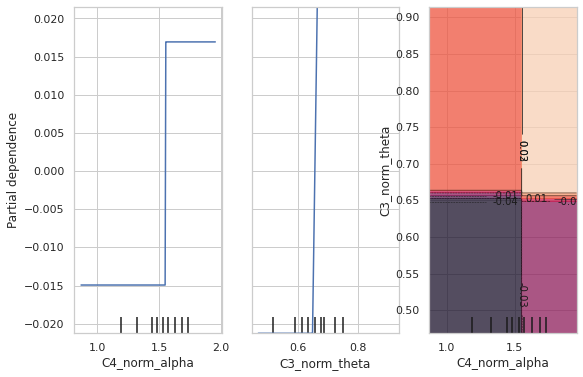

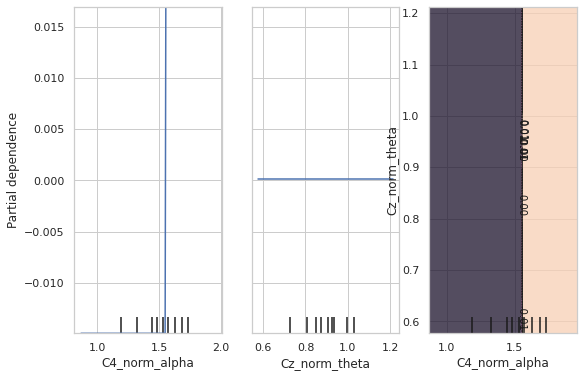

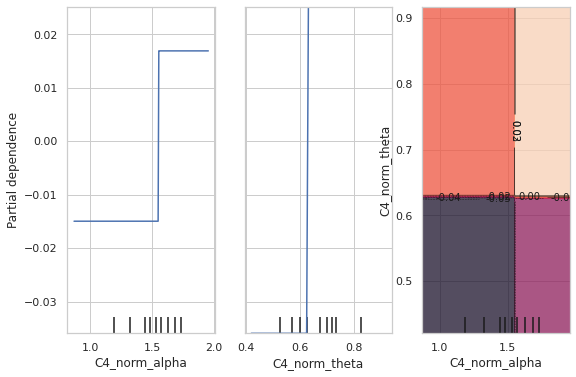

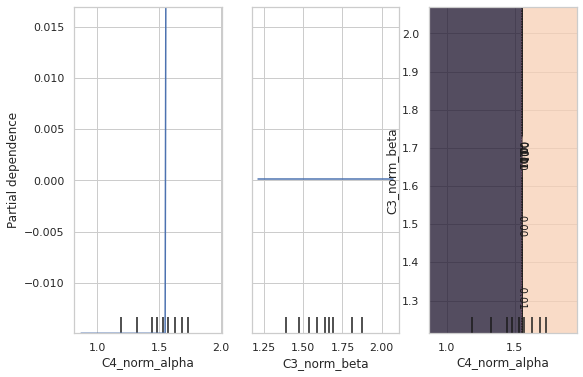

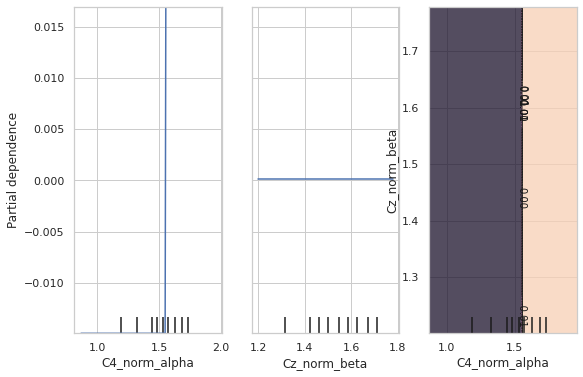

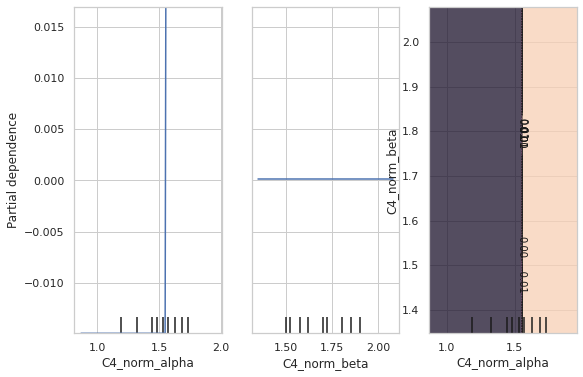

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=2
for i in range(3,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

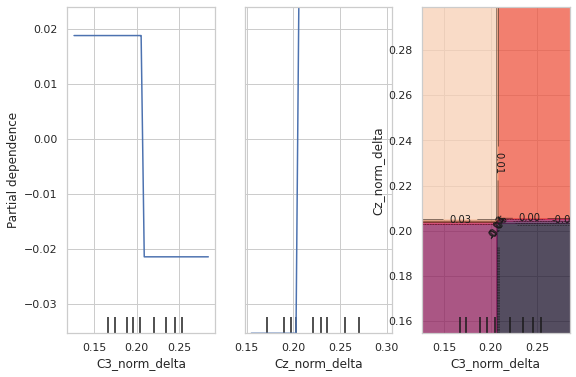

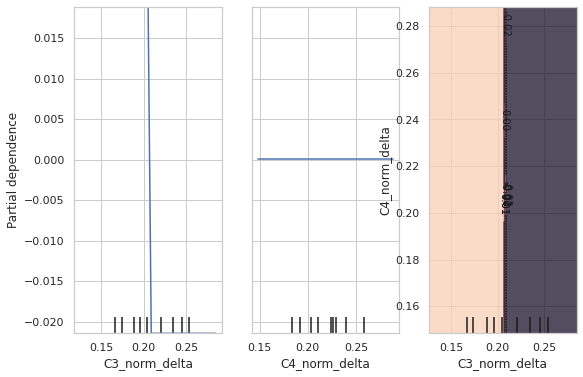

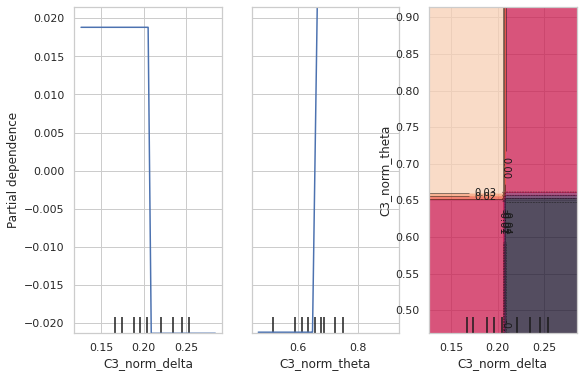

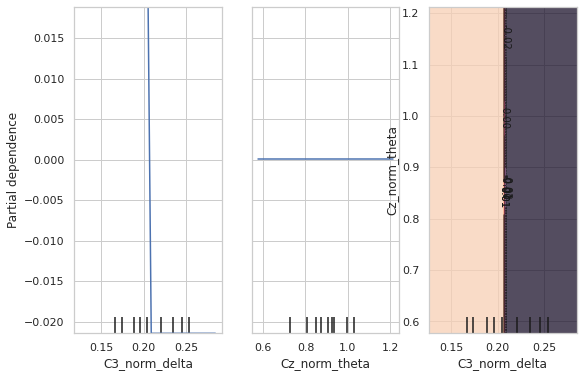

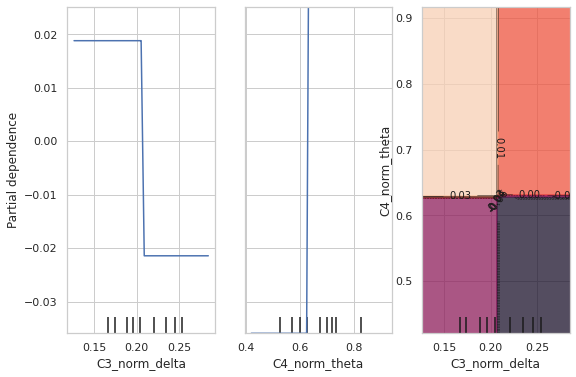

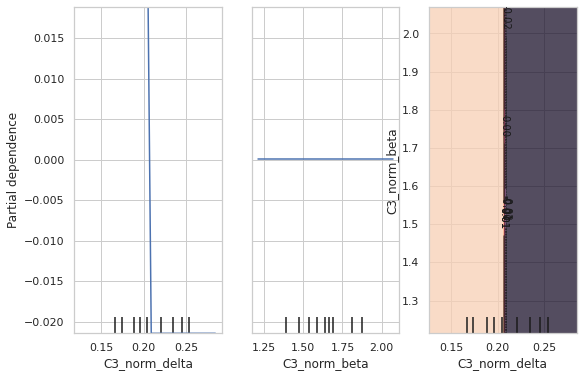

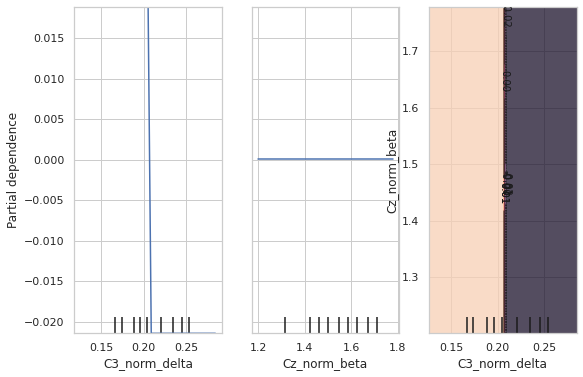

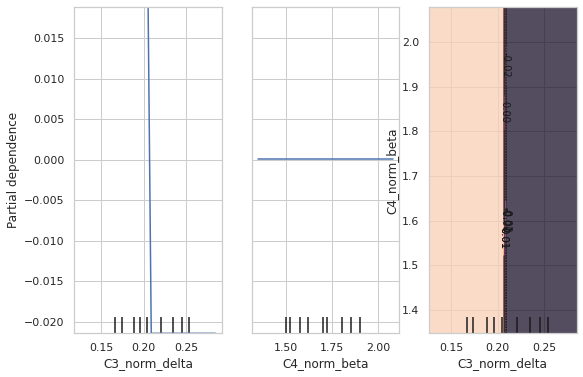

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=3
for i in range(4,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

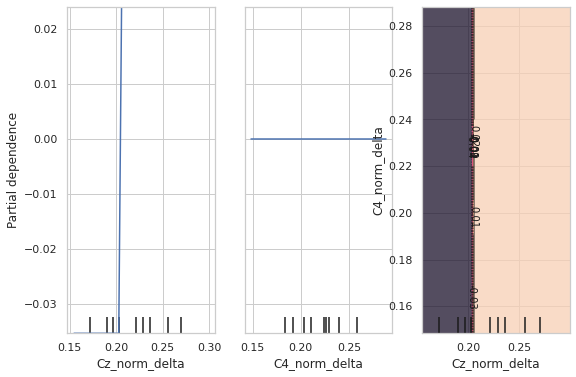

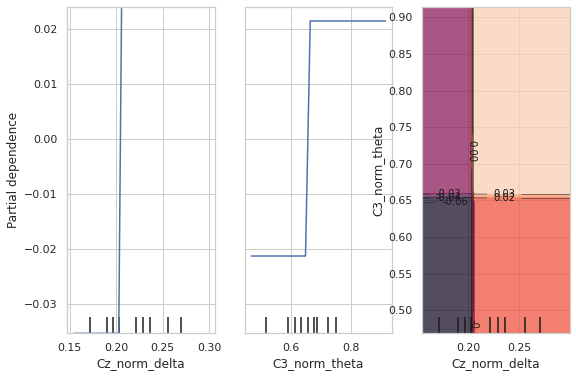

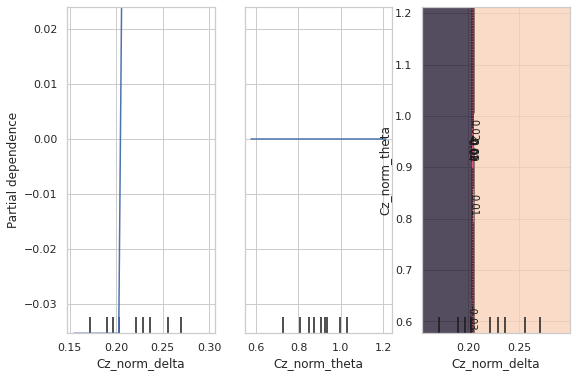

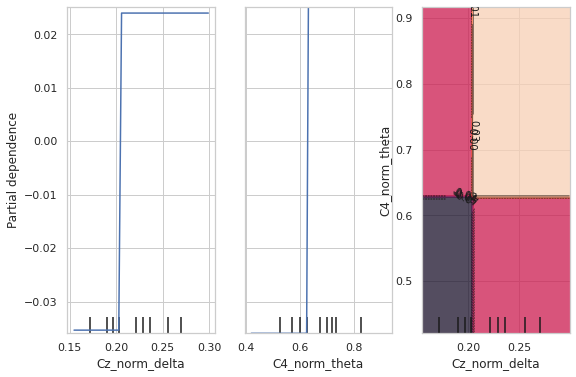

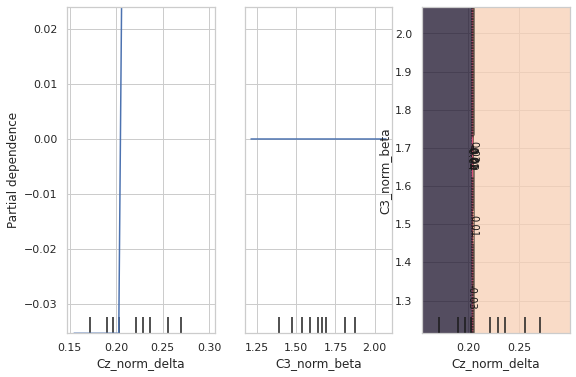

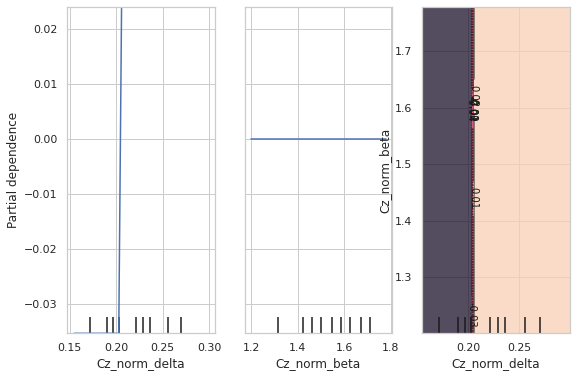

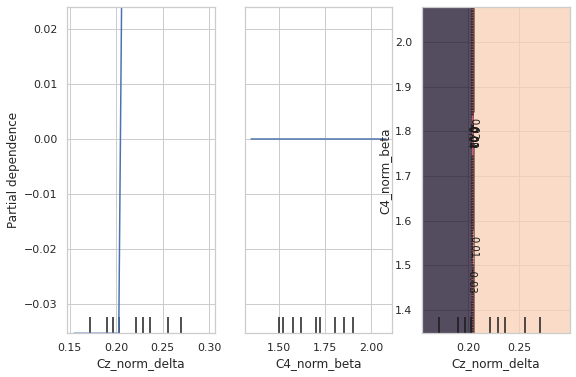

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=4
for i in range(5,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

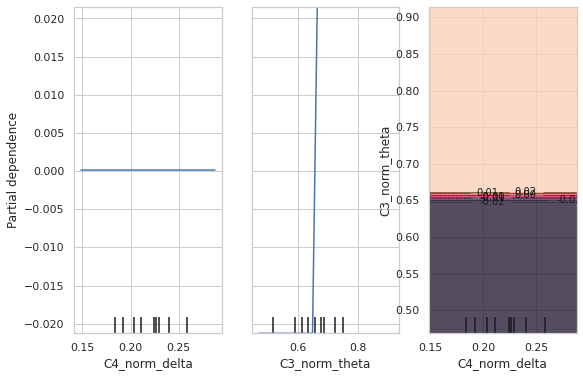

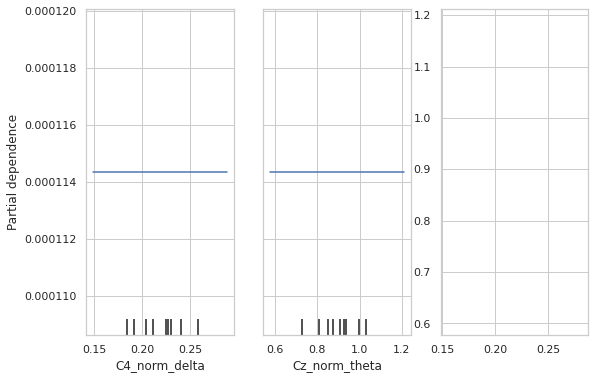

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=5
for i in range(6,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

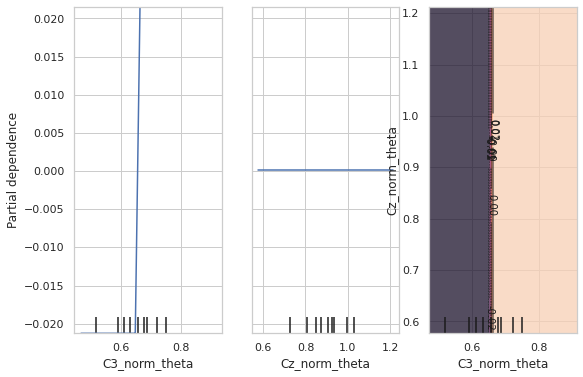

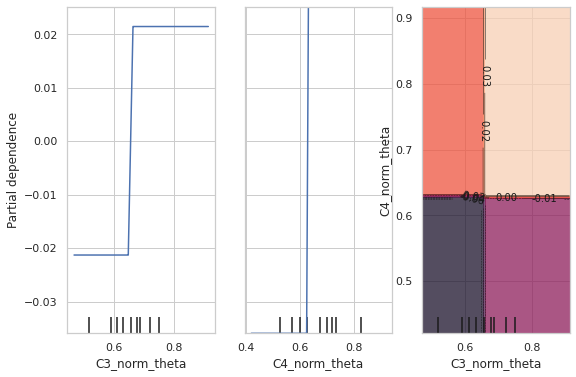

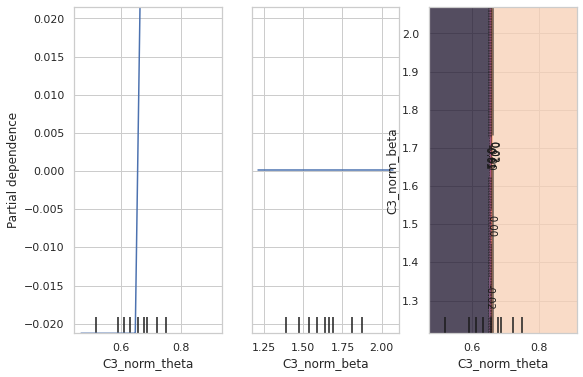

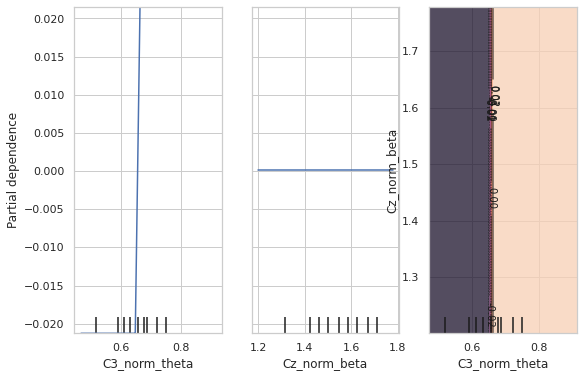

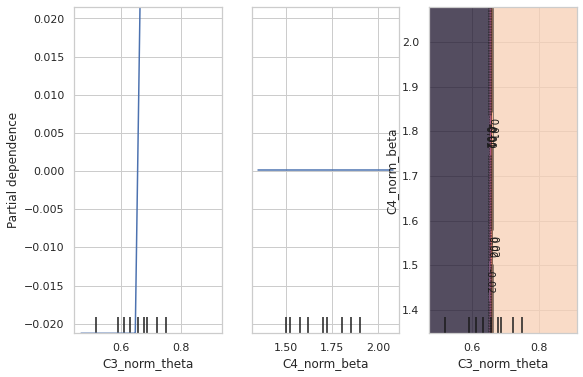

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=6
for i in range(7,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

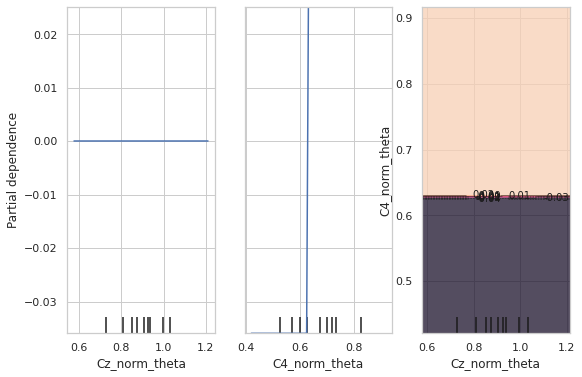

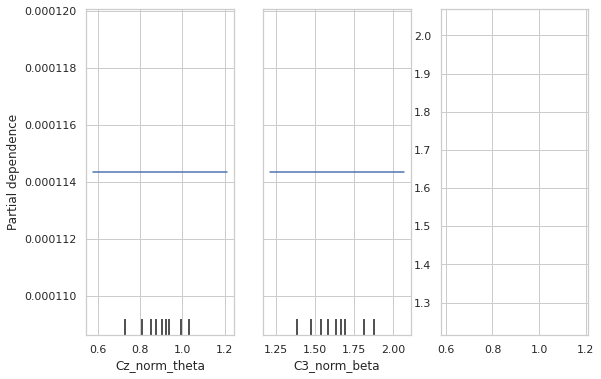

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=7
for i in range(8,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

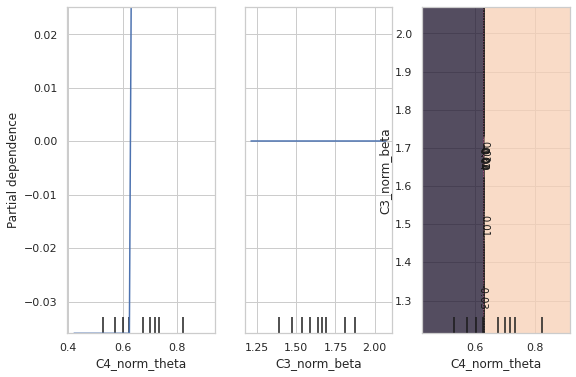

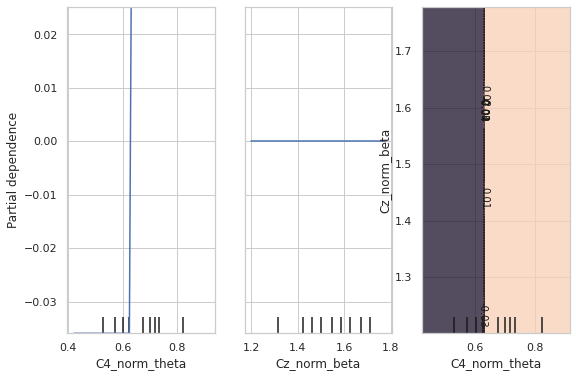

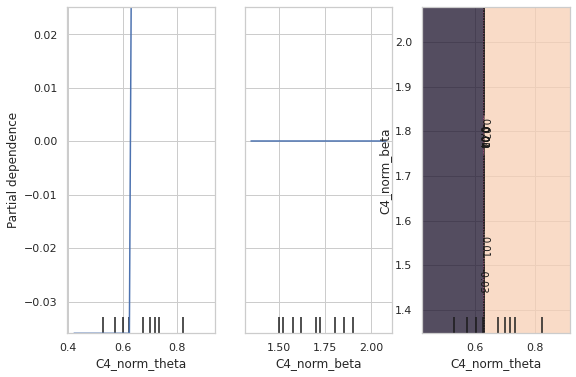

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=8
for i in range(9,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

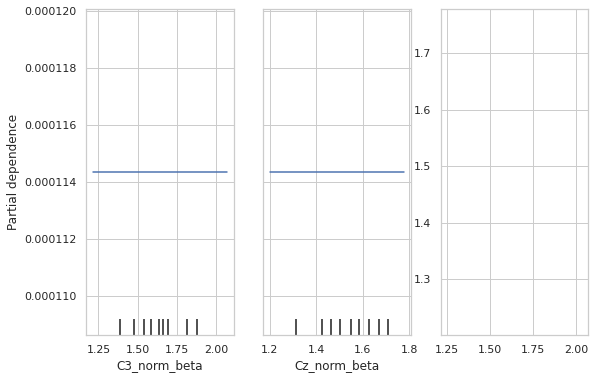

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=9
for i in range(10,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
Attempting to set identical bottom == top == 0.00011435026419865658 results in singular transformations; automatically expanding.
No contour levels were found within the data range.


ValueError: ignored

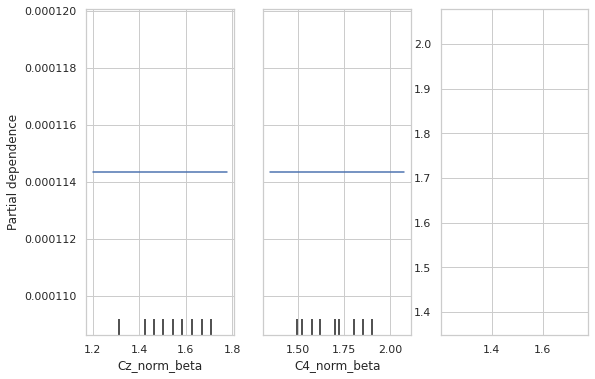

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.inspection import PartialDependenceDisplay

j=10
for i in range(11,12):
  features = [j, i, (j, i)]
  PartialDependenceDisplay.from_estimator(clf_model.best_estimator_, X_train_df, features)

In [ ]:
from sklearn.inspection import partial_dependence

pdp, axes = partial_dependence(clf_model, X_train_df, [0])
pdp

/usr/local/lib/python3.7/dist-packages/sklearn/inspection/_partial_dependence.py:513: FutureWarning:

A Bunch will be returned in place of 'predictions' from version 1.1 (renaming of 0.26) with partial dependence results accessible via the 'average' key. In the meantime, pass kind='average' to get the future behaviour.



array([[0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589, 0.49999589, 0.49999589, 0.49999589,
        0.49999589, 0.49999589]])

In [ ]:
axes

[array([0.93047248, 1.02764434, 1.06548676, 1.20545019, 1.220577  ,
        1.25702509, 1.26290339, 1.27765925, 1.34215158, 1.35396088,
        1.37053863, 1.37384685, 1.39652801, 1.44513567, 1.45765839,
        1.46686654, 1.4820022 , 1.52100999, 1.5324067 , 1.56461019,
        1.56897288, 1.57816384, 1.59907463, 1.60370419, 1.63273853,
        1.63877108, 1.64442323, 1.64735867, 1.66217783, 1.68075594,
        1.68841208, 1.68943028, 1.70216498, 1.71287191, 1.71779933,
        1.71942455, 1.7329792 , 1.7408066 , 1.75069818, 1.75537403,
        1.77521261, 1.85234415, 1.87681644, 1.97310401, 2.00091063,
        2.01065033, 2.04410018])]

Permutation Feature Importance

In [ ]:
from sklearn.inspection import permutation_importance
r = permutation_importance(clf_model, X_train_list, y_train_df.astype('category').cat.codes,
                           n_repeats=30,
                           random_state=0)
for i in r.importances_mean.argsort()[::-1]:
    if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"{X_train_df.columns[i]:<8}"
              f"{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")

Cz_norm_alpha0.095 +/- 0.041


### ALE

In [ ]:
!pip install alibi

In [ ]:
predict_fn = clf_model.decision_function
proba_fn = clf_model.predict_proba

In [ ]:
from alibi.explainers import ALE
ale = ALE(predict_fn, feature_names=bands, target_names=['condition'])

In [ ]:
exp = ale.explain(X_train_list)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f44018cc890>,
      dtype=object)

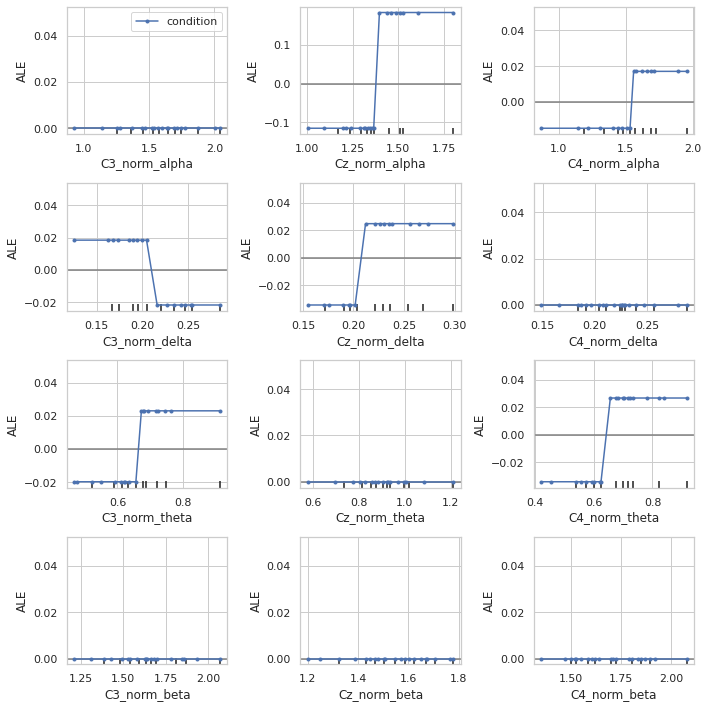

In [ ]:
from alibi.explainers import plot_ale
plot_ale(exp, fig_kw={'figwidth': 10, 'figheight': 10}, sharey=None)


### Protótipos


In [ ]:
!pip install scikit-learn-extra

     |████████████████████████████████| 1.7 MB 5.0 MB/s 


In [ ]:
from sklearn_extra.cluster import KMedoids

centers = [[1, 1], [-1, -1]]

# #############################################################################
# Compute Kmedoids clustering
cobj = KMedoids(n_clusters=2).fit(X_train_df)
labels = cobj.labels_

Cluster 1 is empty! self.labels_[self.medoid_indices_[1]] may not be labeled with its corresponding cluster (1).


In [ ]:
print(labels)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


No handles with labels found to put in legend.


Text(0.5, 1.0, 'KMedoids clustering. Medoids are represented in cyan.')

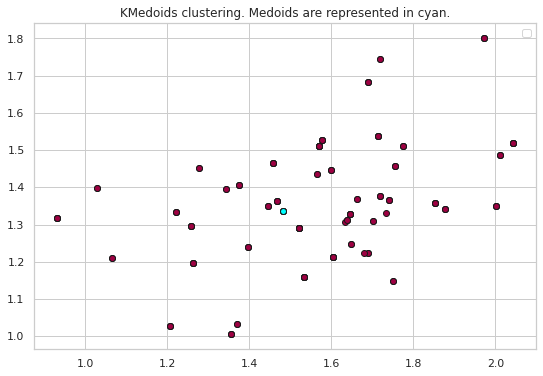

In [ ]:
unique_labels = set(labels)
colors = [
    plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))
]
for k, col in zip(unique_labels, colors):

    class_member_mask = labels == k

    xy = X_train_list[class_member_mask]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.plot(
    cobj.cluster_centers_[:, 0],
    cobj.cluster_centers_[:, 1],
    "o",
    markerfacecolor="cyan",
    markeredgecolor="k",
    markersize=6,
)

plt.legend()
plt.title("KMedoids clustering. Medoids are represented in cyan.")

### ICE

In [ ]:
x1=X_train_df[0:48]
x2=X_train_df[48:96]
x3=X_train_df[96:]

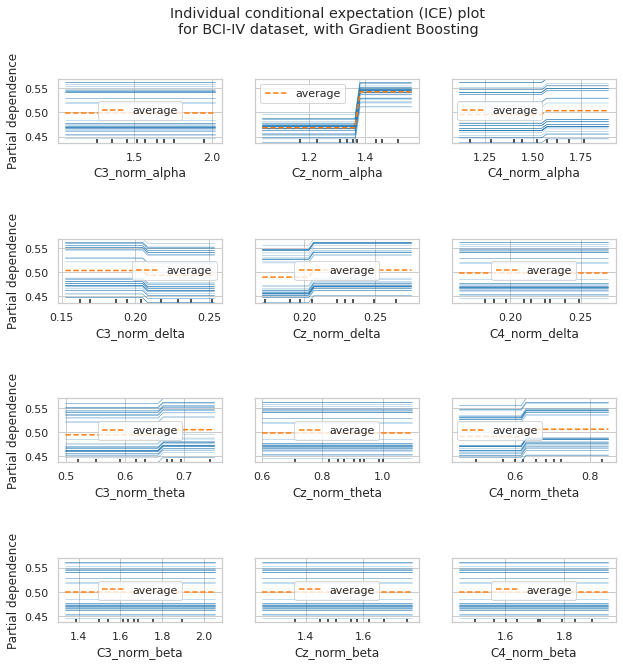

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_model,
    x1,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Gradient Boosting"
)
display.figure_.subplots_adjust(hspace=1.5)

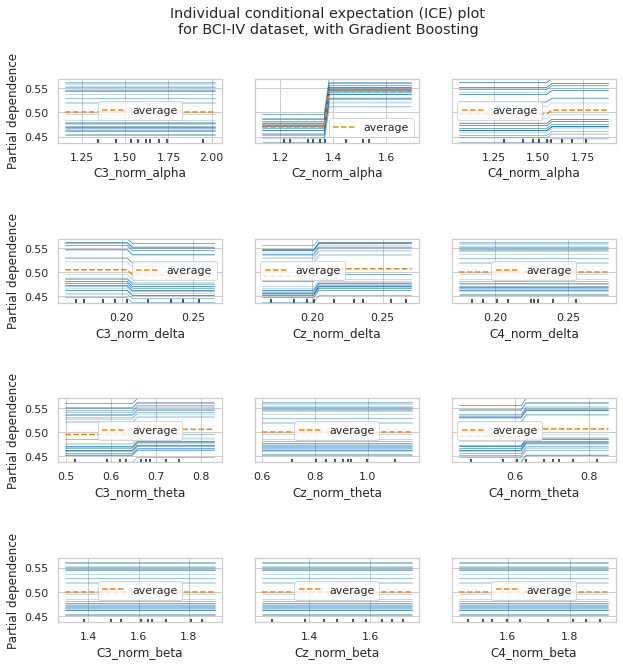

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_model,
    x2,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Gradient Boosting"
)
display.figure_.subplots_adjust(hspace=1.5)

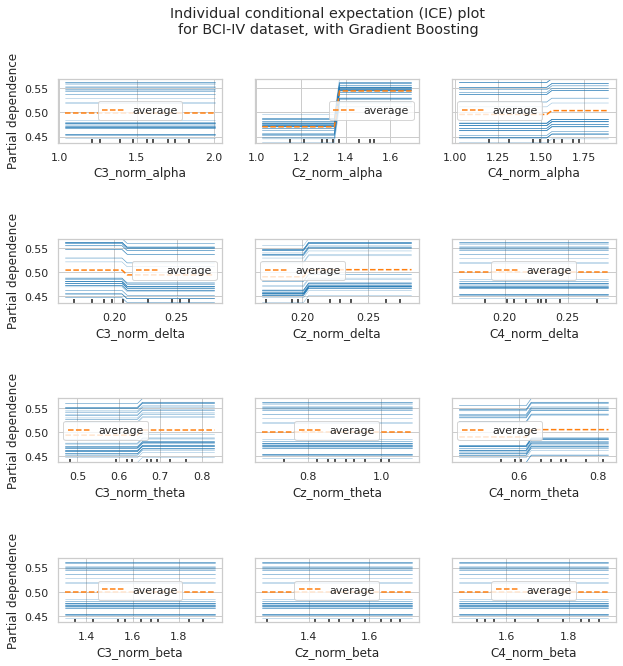

In [516]:
fig,ax=plt.subplots(figsize=(10,10))
features = bands
display = PartialDependenceDisplay.from_estimator(
    clf_model,
    x3,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=30,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.5, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)

display.figure_.suptitle(
    "Individual conditional expectation (ICE) plot\n"
    "for BCI-IV dataset, with Gradient Boosting"
)
display.figure_.subplots_adjust(hspace=1.5)

### Counterfactual

DICE


In [518]:
!pip install tensorflow

In [ ]:
!pip install dice-ml

     |████████████████████████████████| 242 kB 5.1 MB/s 


In [537]:
df= X_train_df.copy()
df['condition']=y_train_df

In [538]:
import dice_ml
from dice_ml.utils import helpers # helper functions

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
# Dataset for training an ML model
d = dice_ml.Data(dataframe=df,continuous_features=bands,
                 outcome_name='condition')
# Pre-trained ML model
m = dice_ml.Model(model=clf_model, backend="sklearn")
# DiCE explanation instance
exp = dice_ml.Dice(d,m)

In [541]:
df_test= X_test_df.copy()
df['condition']=y_test_df

In [543]:
e3 = exp.generate_counterfactuals(df_test[0:1],
                                  total_CFs=2,
                                  desired_class="opposite")
e3.visualize_as_dataframe(show_only_changes=True)

  0%|          | 0/1 [00:00<?, ?it/s]X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but Gra

KeyboardInterrupt: ignored

In [544]:
query_instances = X_test_df[0:11]
imp = exp.global_feature_importance(query_instances)
print(imp.summary_importance)

  0%|          | 0/11 [00:00<?, ?it/s]X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but GradientBoostingClassifier was fitted without feature names
X has feature names, but Gr

KeyboardInterrupt: ignored

###SHAP ou IG

In [ ]:
!pip install shap

     |████████████████████████████████| 564 kB 5.1 MB/s 


In [ ]:
import shap

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(clf_model.best_estimator_)
shap_values = explainer(X_train_df)

# visualize the first prediction's explanation
#shap.plots.waterfall(shap_values[0].base_values, shap_values[0].values, shap_values[0].data)

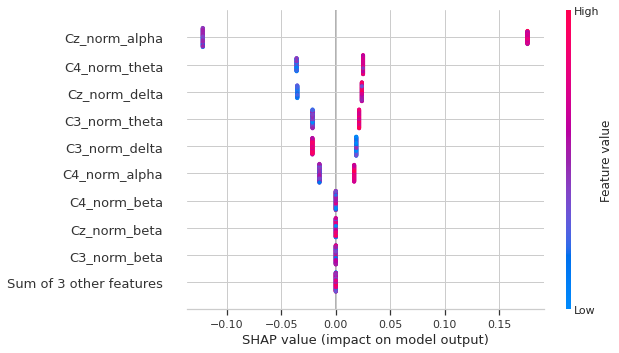

In [ ]:
shap.plots.beeswarm(shap_values)

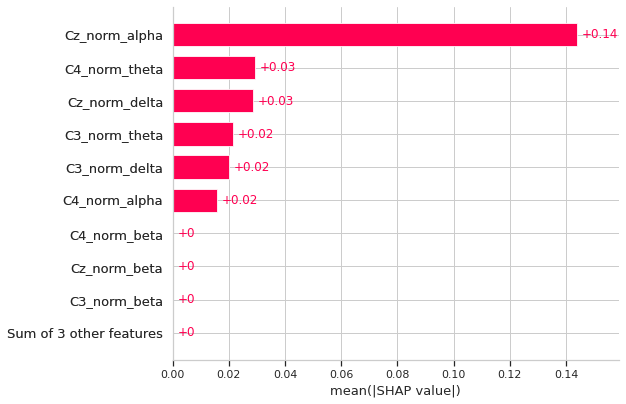

In [ ]:
shap.plots.bar(shap_values)

#CD


In [564]:
!pip install orange3

     |████████████████████████████████| 29.0 MB 163 kB/s 
     |████████████████████████████████| 1.1 MB 10.2 MB/s 
     |████████████████████████████████| 149 kB 47.0 MB/s 
     |████████████████████████████████| 492 kB 11.6 MB/s 
     |████████████████████████████████| 53 kB 1.7 MB/s 
     |████████████████████████████████| 253 kB 34.3 MB/s 
     |████████████████████████████████| 2.5 MB 36.3 MB/s 
     |████████████████████████████████| 992 kB 44.4 MB/s 
     |████████████████████████████████| 84 kB 2.1 MB/s 
     |████████████████████████████████| 228 kB 43.0 MB/s 
     |████████████████████████████████| 8.3 MB 39.6 MB/s 
     |████████████████████████████████| 68 kB 3.8 MB/s 
     |████████████████████████████████| 54 kB 2.1 MB/s 
     |████████████████████████████████| 79 kB 2.7 MB/s 
     |████████████████████████████████| 51 kB 5.6 MB/s 
     |████████████████████████████████| 59.9 MB 83 kB/s 
     |████████████████████████████████| 338 kB 47.0 MB/s 
     |█████████████████████

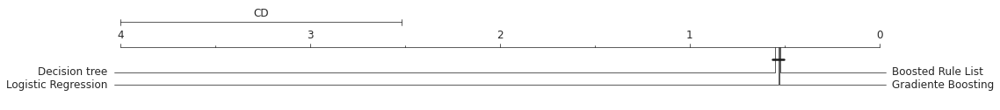

CD value: 1.4832313167567626


In [570]:
import Orange
import matplotlib.pyplot as plt
names = ['Logistic Regression', 'Decision tree','Boosted Rule List', 'Gradiente Boosting']
avranks =  [clf_logreg_df.best_score_, 
            clf_decision_tree.best_score_, 
            model_rule.score(X_test_df,y_train_df.astype('category').cat.codes), 
            clf_model.best_score_]
cd = Orange.evaluation.compute_CD(avranks, n=10, alpha='0.05', test="nemenyi")
Orange.evaluation.graph_ranks(avranks, names, cd=cd, width=15, textspace=1.5, 
  reverse=True)

plt.show()
print('CD value:', cd)